# Setup

Install in R:
```
install.packages("BiocManager")
BiocManager::install(c("edgeR", "BiocParallel", "RhpcBLASctl"))
```

Install

```pip install toytree ete4 pybiomart```

## Options & Data

In [ ]:
%load_ext autoreload
%autoreload 2

import os
import re
import pickle
import matplotlib.pyplot as plt
import warnings
import logging
import seaborn as sns
from scipy.sparse import issparse
from pymer4.models import lmer, lm, glmer, compare
from pymer4 import config
import polars
import statsmodels.api as sm
import senepy
import gseapy as gp
import pertpy as pt
import scanpy as sc
import pandas as pd
import numpy as np
import scflow
from scflow.ax import find_senescence_genes, run_senepy

# Display/Environment Settings
os.environ["KMP_DUPLICATE_LIB_OK"] = "True"
warnings.filterwarnings("ignore", message=".*ast.Ellipsis is deprecated.*")
config.PANDAS_BACKEND = True
warnings.filterwarnings("ignore", message=".*vert.*will be deprecated.*")
pd.set_option("display.max_rows", 500)  # or None for unlimited rows
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_colwidth", 100)
pd.set_option("display.width", 300)
warnings.filterwarnings(
    "ignore", message="Bitwise inversion '~' on bool is deprecated",
    category=DeprecationWarning)

# Process Options
ncpus = os.cpu_count() - 1
overwrite = False

# If You Want Results Emailed (Will Overwrite HTML Regardless of `overwite`)
cur_file = os.path.join(os.path.abspath(""), "analyze_senescence.ipynb")
html_out = os.path.splitext(cur_file)[0] + ".html"
email = "elizabeth.aslinger@aya.yale.edu"
# set email to None to skip

# Cell Type Label Column
col_celltype = "annotation_scanvi"
# col_celltype = "annotation_by_overlap"
# col_celltype = "Annotation_ToppGene"
# col_celltype = "cellmap_class_name"
# col_celltype = "cellmap_class_name_collapsed"
# use_hierarchy = False
collapse_neurons = True  # collapse neuron categories?

# Metadata Information
drop_snc_genes = ["Timp2"]  # opposite effect in brain
species = "Mouse"
col_sample, col_batch = "sample", "Group"
# col_age = "Characteristics[Age at Euthanasia]"
# col_condition = "Factor Value[Spaceflight]"
col_age = "Age_End"
col_condition = "Condition"
# group_order = ["Ground Control | 12 Weeks", "Ground Control | 29 Weeks",
#                "Space Flight | 12 Weeks", "Space Flight | 29 Weeks"]
group_order = ["Ground Control | 20 Weeks", "Ground Control | 37 Weeks",
               "Space Flight | 20 Weeks", "Space Flight | 37 Weeks"]
keys = {col_condition: dict(key_control="Ground Control",
                            key_treatment="Space Flight"),
        col_age: dict(key_control="20 Weeks",
                      key_treatment="37 Weeks"),
        # col_age: dict(key_control="12 Weeks",
        #               key_treatment="29 Weeks"),
        col_batch: dict(key_control=group_order[0],
                        key_treatment=group_order[1:])}
palette = {col_condition: {keys[col_condition]["key_control"]: "b",
                           keys[col_condition]["key_treatment"]: "r"},
           col_age: {keys[col_age]["key_control"]: "g",
                     keys[col_age]["key_treatment"]: "y"},
           col_batch: dict(zip(group_order, ["c", "b", "tab:pink", "r"]))}

# Scoring Metrics
sen_metrics = ["senmayo"]
# sen_metrics = ["senepy", "senmayo"]
use_metric = "senmayo"
percentile = 1

# File Input & Output
file_path = "data/OSD-613_integrated.h5ad"
file_path_new = os.path.splitext(file_path)[0] + "_analyzed.h5ad"

# Load Data
self = scflow.Rna(file_path, col_sample=col_sample, col_batch=col_batch,
                  col_celltype=col_celltype)  # data
self.rna.obs.loc[:, col_batch] = self.rna.obs[col_batch].astype(
    pd.CategoricalDtype(categories=group_order, ordered=True))
self.rna = self.rna[:, self.rna.var.mt == False]  # snRNA-seq so remove MT-
self.rna = self.rna[:, self.rna.var.ribo == False]  # snRNA-seq so remove RB-
self.rna.obs.loc[:, "Spaceflight"] = (self.rna.obs[col_condition] == keys[
    col_condition]["key_treatment"]).astype(int)  # 1 vs. 0 spaceflight
self.rna.obs.loc[:, "Aged"] = (self.rna.obs[col_age] == keys[
    col_age]["key_treatment"]).astype(int)  # 1 vs. 0 older
self.rna.X = self.rna.layers["log1p"].copy()
self.rna.raw = None

# Hierarchical
ref_ct = "Neuron"
keys_cts = {"Neurons": ["Excitatory", "Inhibitory",
                        "Excitatory-Inhibitory", "Neuron"],
            "Macroglia": ["Oligodendrocyte", "OPC", "Astrocyte"],
            "Microglia": ["Microglial"],
            "Endothelial Cell": ["Endothelial"]}
key_cts = dict(pd.concat([pd.Series(dict(([(i, x) for i in keys_cts[
    x]]))) for x in keys_cts]))
if collapse_neurons is True:
    self.rna.obs.loc[:, f"{col_celltype}_collapsed"] = self.rna.obs[
        col_celltype].replace(dict(zip(keys_cts["Neurons"], ["Neurons"] * 3)))
    col_celltype = f"{col_celltype}_collapsed"
    self.col_celltype = col_celltype
self.rna.obs.loc[:, f"{col_celltype}_hierarchy"] = self.rna.obs[
    col_celltype].replace(key_cts)

# Display Object
print(self.rna)
print(self.rna.obs.groupby(col_sample).describe())
self.rna.obs



AnnData object with n_obs × n_vars = 103274 × 12097
    obs: 'Group', 'sample', 'Characteristics[Organism]', 'Term Source REF', 'Term Accession Number', 'Characteristics[Strain]', 'Term Source REF.1', 'Term Accession Number.1', 'Characteristics[Genotype]', 'Term Source REF.2', 'Term Accession Number.2', 'Characteristics[Animal Source]', 'Characteristics[Sex]', 'Term Source REF.3', 'Term Accession Number.3', 'Factor Value[Spaceflight]', 'Term Source REF.4', 'Term Accession Number.4', 'Factor Value[Age]', 'Unit', 'Term Source REF.5', 'Term Accession Number.5', 'Characteristics[Material Type]', 'Term Source REF.6', 'Term Accession Number.6', 'Characteristics[diet]', 'Characteristics[Feeding Schedule]', 'Characteristics[Age at Euthanasia]', 'Unit.1', 'Term Source REF.7', 'Term Accession Number.7', 'Protocol REF', 'Parameter Value[habitat]', 'Parameter Value[Enrichment material]', 'Parameter Value[duration]', 'Unit.2', 'Term Source REF.8', 'Term Accession Number.8', 'Parameter Value[light c

,Group,sample,Characteristics[Organism],Term Source REF,Term Accession Number,Characteristics[Strain],Term Source REF.1,Term Accession Number.1,Characteristics[Genotype],Term Source REF.2,Term Accession Number.2,Characteristics[Animal Source],Characteristics[Sex],Term Source REF.3,Term Accession Number.3,Factor Value[Spaceflight],Term Source REF.4,Term Accession Number.4,Factor Value[Age],Unit,Term Source REF.5,Term Accession Number.5,Characteristics[Material Type],Term Source REF.6,Term Accession Number.6,Characteristics[diet],Characteristics[Feeding Schedule],Characteristics[Age at Euthanasia],Unit.1,Term Source REF.7,Term Accession Number.7,Protocol REF,Parameter Value[habitat],Parameter Value[Enrichment material],Parameter Value[duration],Unit.2,Term Source REF.8,Term Accession Number.8,Parameter Value[light cycle],Protocol REF.1,Parameter Value[Euthanasia Method],Parameter Value[Sample Preservation Method],Term Source REF.9,Term Accession Number.9,Parameter Value[Sample Storage Temperature],Unit.3,Term Source REF.10,Term Accession Number.10,Comment[RFID],Comment[Euthanasia Date],n_cells_original_sample,kws_pp_sample,n_genes_by_counts,total_counts,log1p_n_genes_by_counts,log1p_total_counts,total_counts_mt,pct_counts_mt,log1p_total_counts_mt,total_counts_ribo,pct_counts_ribo,log1p_total_counts_ribo,total_counts_hb,pct_counts_hb,log1p_total_counts_hb,n_counts,n_genes,doublet_score,predicted_doublet,leiden_individual_res0.2dist1.5,annotation_by_markers_individual_res0.2dist1.5,annotation_by_markers_individual_heterogeneous_collapsed,leiden_individual,annotation_by_markers_individual,kws_cluster_individual,annotation_scanvi,kws_integrate,leiden,leiden_resolution,leiden_n_neighbors,leiden_min_dist,annotation_by_overlap,annotation_toppgene,predicted_labels,majority_voting,majority_voting_probabilities,majority_voting_short,annotation_majority_voting,Age_Start,Age_End,Condition,Spaceflight,Aged,annotation_scanvi_collapsed,annotation_scanvi_collapsed_hierarchy
AAACAGCCAATCGCAC-1_RRRM2_BRN_GC_ISS-T_YNG_GY4,Ground Control | 20 Weeks,RRRM2_BRN_GC_ISS-T_YNG_GY4,Mus musculus,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON/10090,C57BL/6NTac,EFO,http://www.ebi.ac.uk/efo/EFO_0020093,Wild Type,NCIT,http://purl.obolibrary.org/obo/NCIT_C62195,Taconic Biosciences,Female,MESH,http://purl.bioontology.org/ontology/MESH/D005260,Ground Control,OSD,https://osdr.nasa.gov/,12,week,UO,http://purl.obolibrary.org/obo/UO_0000034,Left cerebral hemisphere,FMA,http://purl.org/sig/ont/fma/fma61819,Nutrient Upgraded Rodent Food Bar (NuRFB),ad libitum,20,week,UO,http://purl.obolibrary.org/obo/UO_0000034,Animal Husbandry,Rodent Flight Hardware (Transporter and Habitat),Hut,53,day,UO,http://purl.obolibrary.org/obo/UO_0000033,12 h light/dark cycle,sample collection,"Bilateral thoracotomy with sedation, Cardiac puncture with sedation, Ketamine/xylazine injection",Liquid Nitrogen,NCIT,http://purl.obolibrary.org/obo/NCIT_C68796,-80,degree Celsius,UO,http://purl.obolibrary.org/obo/UO_0000027,6E2A671967,18-Sep-2019,8542,"{'min_max_genes': [321.0, None], 'min_max_cells': [20, None], 'max_mt': 10, 'min_max_counts': [4...",2152,4962.0,7.674617,8.509766,56.0,1.128577,4.043051,10.0,0.201532,2.397895,2.0,0.040306,1.098612,4962.0,2152,0.030852,False,1,Neuron,Neuron,1,Neuron,"{'resolution': 0.2, 'min_dist': 1.5, 'n_comps': 50}",Neuron,"{'col_celltype': 'annotation_by_markers_individual_heterogeneous_collapsed', 'flavor': 'scanvi',...",0,0.0075,15,1.8,Neuron,Inhibitory,006 L4/5 IT CTX Glut,006 L4/5 IT CTX Glut,0.842869,L4/5 IT CTX Glut,Glutamatergic,12 Weeks,20 Weeks,Ground Control,0,0,Neuron,Neurons
AAACAGCCAGCACCAT-1_RRRM2_BRN_GC_ISS-T_YNG_GY4,Ground Control | 20 Weeks,RRRM2_BRN_GC_ISS-T_YNG_GY4,Mus musculus,NCBITAXON,http://purl.bioontology.org/ontology/NCBITAXON/10090,C57BL/6NTac,EFO,http://www.ebi.ac.uk/efo/EFO_0020093,Wild Type,NCIT,http://purl.obolibrary.org/obo/NCIT_C62195,Taconic Biosciences,Female,MESH,http://purl.bioontology.org/ontology/MESH/D005260,Ground

## Data Descriptives

In [2]:
%matplotlib inline

# Detect Metadata Columns in AnnData Object
metadata_cols = self.rna.obs.groupby(col_sample).apply(
    lambda x: list(x.columns[np.where(
        x.apply(lambda y: len(y.unique()) ==  1))[0]]))
metadata_cols = [x for x in metadata_cols.explode().unique() if all((
    x in metadata_cols.loc[i] for i in metadata_cols.index.values))]

# Value Counts for Categorical Variables
metadata_cols_category = self.rna.obs[metadata_cols].dtypes[((
    self.rna.obs[metadata_cols].dtypes == "category") | (self.rna.obs[
        metadata_cols].apply(lambda x: len(x.unique()) < 6))) & (self.rna.obs[
            metadata_cols].apply(lambda x: len(x.unique()) > 1))].index
for x in metadata_cols_category:
    print(x, "\n\n", self.rna.obs[x].value_counts(), "\n\n")
    if col_batch is not None:  # by batch
        if x != col_batch:
            print(x, "\n\n", self.rna.obs[[x, col_batch]].groupby(
                col_batch).value_counts(), "\n\n")

# Descriptives for Continuous Variables
print(self.rna.obs[self.rna.obs.columns.difference(
    metadata_cols_category)].describe())
if col_batch is not None:  # by batch
    print(self.rna.obs[list(self.rna.obs.columns.difference(
        metadata_cols_category)) + [col_batch]].groupby(col_batch).describe())

# Cells per Cluster
perc_clusters = round(100 * self.rna.obs.groupby(col_sample).value_counts(
    [col_celltype], normalize=True).unstack(1), 2)
print(f"\n\n*** Cell Composition (%) ***\n\n{perc_clusters}")

# Number of Cells
n_cells = self.rna.obs.groupby(col_sample).apply(
    lambda x: x.n_cells_original_sample.unique()[0],
    include_groups=False).to_frame("Original Cell N").join(
        self.rna.obs.groupby(col_sample).apply(
            lambda x: x.shape[0], include_groups=False).to_frame("N Cells"))
n_cells.loc[:, "Percent_Filtered"] = round(100 * (1 - n_cells[
    "N Cells"] / n_cells["Original Cell N"]), 2)
print("\n\n", n_cells.sort_values("Percent_Filtered"))

/tmp/ipykernel_38697/1416146960.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  metadata_cols = self.rna.obs.groupby(col_sample).apply(


Group 

 Group
Ground Control | 37 Weeks    35362
Ground Control | 20 Weeks    31600
Space Flight | 37 Weeks      19904
Space Flight | 20 Weeks      16408
Name: count, dtype: int64 


sample 

 sample
RRRM2_BRN_GC_ISS-T_OLD_GO16     18386
RRRM2_BRN_GC_ISS-T_YNG_GY2       9651
RRRM2_BRN_GC_ISS-T_YNG_GY4       7547
RRRM2_BRN_GC_ISS-T_OLD_GO19      7539
RRRM2_BRN_GC_ISS-T_OLD_GO18      5842
RRRM2_BRN_FLT_ISS-T_OLD_FO19     5747
RRRM2_BRN_GC_ISS-T_YNG_GY9       5465
RRRM2_BRN_GC_ISS-T_YNG_GY7       5265
RRRM2_BRN_FLT_ISS-T_YNG_FY8      5095
RRRM2_BRN_FLT_ISS-T_OLD_FO20     4922
RRRM2_BRN_FLT_ISS-T_OLD_FO16     4050
RRRM2_BRN_FLT_ISS-T_YNG_FY5      3914
RRRM2_BRN_FLT_ISS-T_OLD_FO14     3864
RRRM2_BRN_FLT_ISS-T_YNG_FY2      3730
RRRM2_BRN_GC_ISS-T_YNG_GY1       3672
RRRM2_BRN_FLT_ISS-T_YNG_FY7      3669
RRRM2_BRN_GC_ISS-T_OLD_GO13      3595
RRRM2_BRN_FLT_ISS-T_OLD_FO17     1321
Name: count, dtype: int64 


sample 

 Group                      sample                      
Ground Control | 20 

## Get Marker Gene Sets

From Google Drive, except senmayo derived from file downloaded from
https://www.gsea-msigdb.org/gsea/msigdb/human/geneset/SAUL_SEN_MAYO.html
then created using:

```
from pybiomart import Server

senmayo = pd.read_csv("resources/SAUL_SEN_MAYO.v2025.1.Hs.tsv",
                      sep="\t", header=0)
senmayo = senmayo[senmayo.STANDARD_NAME == "GENE_SYMBOLS"]
senmayo = pd.Series({"Senmayo": senmayo.iloc[0, 1].split(
    ",")}, name="symbol").rename_axis("Gene_Set").explode().str.strip(
        ).replace("", np.nan).dropna().to_frame()
server = Server(host="http://www.ensembl.org")
mart = server.marts["ENSEMBL_MART_ENSEMBL"] # Access the Ensembl mart
human_dataset = mart.datasets["hsapiens_gene_ensembl"]
orthologs = human_dataset.query(attributes=[
    "external_gene_name", "mmusculus_homolog_associated_gene_name"])
orthologs = orthologs.dropna().set_index(orthologs.columns[0])
orthologs = orthologs.loc[orthologs.index.intersection(
    senmayo.symbol.to_list())].iloc[:, 0]
print(f"{orthologs.shape[0]} orthologs found out of"
      f" {len(senmayo.symbol.unique())} senmayo genes")
senmayo = senmayo.assign(symbol=senmayo.replace({"symbol": dict(zip(
    orthologs.index, orthologs.values))}))
senmayo.to_csv("gene_sets/senmayo.csv")
```

(Also could use `scflow.tl.convert_gene_species(senmayo.symbol.to_list())`)

Certain gene sets created from Google Drive ADBR AWG > Projects > White Matter > Gene Sets files (with the suffix = "_adjusted") were modified for consistency, e.g.,

```
pd.read_csv("gene_sets/_iron_genes_gmt_out.csv", index_col=[
    0, 1]).rename_axis(["row_id", "pathway"]).stack().to_frame(
        "symbol").reset_index(-1, drop=True).reset_index().to_csv(
            "gene_sets/_iron_genes_gmt_out_adjusted.csv")
```


### *A Priori*

In [5]:
mks = [pd.read_csv(os.path.join("gene_sets", i)).dropna(
    how="all", axis=1).assign(Source_File=i) for i in os.listdir("gene_sets")]
mks = [x.assign(Gene_Set=x["Source_File"].iloc[0].split("_2025")[0]) if (
    "pathway" in x) else x for x in mks]
mks = pd.concat(mks).drop("Unnamed: 0", axis=1).drop("row_id", axis=1)
mks = mks[mks.symbol.isin(self.rna.var_names)]
mks = mks[["Gene_Set", "symbol"]].set_index("Gene_Set").groupby(
    "Gene_Set").apply(lambda x: [i for i in x["symbol"].to_list(
        ) if i not in drop_snc_genes] if x.name == "Senmayo" else x[
            "symbol"].to_list())
marker_genes_dict = dict(mks)
marker_gene_sets = mks.copy()
print(marker_gene_sets)

Gene_Set
GOBP_CELLULAR_RESPONSE_TO_IRON_ION                                                                                                                                                                                                                          [B2m, Bmp6, Gpld1, Ireb2, Tfrc, Trf]
GOBP_CENTRAL_NERVOUS_SYSTEM_MYELIN_FORMATION                                                                                                                                                                                                      [Abca2, Ckap5, Cntn1, Ercc2, Mag, Mios, Tenm4]
GOBP_INTRACELLULAR_IRON_ION_HOMEOSTASIS                                                                                                                                                      [Abcb7, Aco1, Atp13a2, Atp6ap1, Atp6v0a2, Atp6v0d1, Atp6v1a, Atp6v1g1, B2m, Bmp6, Bmyc, Bola2, C...
GOBP_IRON_COORDINATION_ENTITY_TRANSPORT                                                                                     

### Clusters in Data

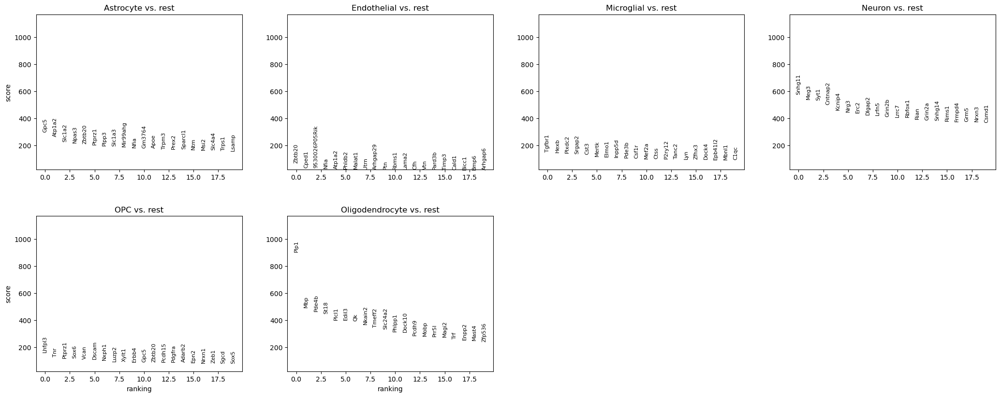

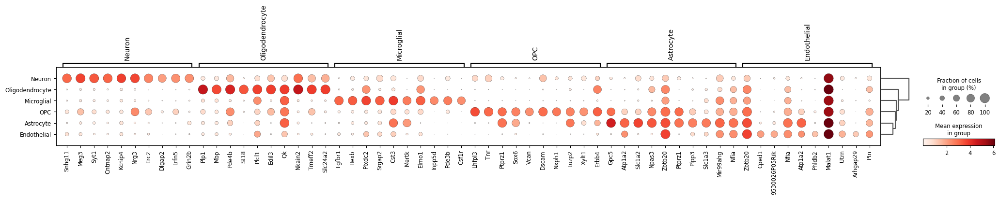

scores  logfoldchanges          pvals      pvals_adj  pct_nz_group  pct_nz_reference
annotation_scanvi_collapsed annotation_scanvi_collapsed names                                                                                                  
Astrocyte                   Astrocyte                   Bcl2            48.899536        2.239125   0.000000e+00   0.000000e+00      0.435693          0.235962
                                                        Abhd3           47.049854        2.996136   0.000000e+00   0.000000e+00      0.327608          0.104211
                                                        Ugp2            47.192318        2.245601   0.000000e+00   0.000000e+00      0.409161          0.204291
Endothelial                 Endothelial                 Zbtb20          70.592384        3.189538   0.000000e+00   0.000000e+00      0.978723          0.698012
                                                        Cped1           36.543205        7.135421  3.759468e-176  6.255610e-175      0.657210          0.036260
                                                        9530026P05Rik   33.864552        5.088588  1.330290e-159  2.076454e-158      0.648936          0.096966
Microglial                  Microglial                  Tgfbr1         151.183472        7.480357   0.000000e+00   0.000000e+00      0.913536          0.087600
                                                        Hexb           149.944946        5.967657   0.000000e+00   0.000000e+00      0.923077          0.292684
                                                        Plxdc2         145.600204        4.736532   0.000000e+00   0.000000e+00      0.945140          0.467174
Neuron                      Neuron                      Sesn3           56.029186        1.102415   0.000000e+00   0.000000e+00      0.494225          0.163855
                                                        Slc4a7          56.406967        1.341596   0.000000e+00   0.000000e+00      0.359661          0.088581
                                                        Rasl10a         56.451958        3.142129   0.000000e+00   0.000000e+00      0.099986          0.005377
OPC                         OPC                         Cspg5           70.893486        3.467703   0.000000e+00   0.000000e+00      0.735171          0.327699
                                                        Arhgap31        70.801170        4.469202   0.000000e+00   0.000000e+00      0.676692          0.085802
                                                        Maml2           69.792191        3.339710   0.000000e+00   0.000000e+00      0.738513          0.210387
Oligodendrocyte             Oligodendrocyte             Trim2           52.249023        1.064298   0.000000e+00   0.000000e+00      0.597691          0.621887
                                                        Prkcq           54.533813        3.233324   0.000000e+00   0.000000e+00      0.185549          0.032000
                                                        E130308A19Rik   54.402321        1.581624   0.000000e+00   0.000000e+00      0.358273          0.309075

In [6]:
self.find_markers(col_celltype=col_celltype)
df_celltype_markers = self.get_markers_df(
    n_genes=50, col_celltype=col_celltype,
    log2fc_threshold=1, p_threshold=1e-10)
df_celltype_markers.groupby(col_celltype).apply(lambda x: x.head(3))

# Regress Out?

In [ ]:
# if vars_regress_out is not None:
#     self.rna.X = self.rna.layers["log1p"].copy()
#     sc.pp.regress_out(self.rna, vars_regress_out)
#     self.rna.layers["log1p"] = self.rna.X.copy()
#     pkg.pp.scale(self.rna, zero_center=True, max_value=10)
#     self.rna.layers["scaled"] = self.rna.X.copy()
#     self.rna.X = self.rna.layers["log1p"].copy()

# Score Senescence

## Run Scoring

If you want just to find the senescence-related genes, run:

```
tissue = "Brain"  # or whatever you want here
celltype = None  # or whatever you want here
genes_senepy, hubs, figs = find_senescence_genes(
    self.rna, species=species, tissue=tissue, celltype=celltype,
    overlap_threshold=0, literature_sources=None,
    sengpt_sources=True, plot=True, col_celltype=col_celltype
)  # find tissue- and/or cell type-specific genes
```

To see available hubs:

```
hubs = senepy.load_hubs(species=species)
hubs.metadata.set_index(["tissue", "cell"]).sort_index()
```

Other examples of arguments you could use:

```
# tissue = ["Brain", "Myeloid"]
# tissue = None

# celltype = "GABA interneuron"  # only human I think
# celltype = ["microglia", "t cell", "monocyte"]
# celltype = "microglia"
# celltype = "microglial cell"`

### Senepy

In [7]:
%%time

tissue = "Brain"
celltype = None  # use all cell types

if "senepy" in sen_metrics:
    self.rna.X = self.rna.layers["log1p"].copy()
    self.rna, genes_senepy, figs = run_senepy(
        self.rna, species=species, tissue=tissue, celltype=celltype,
        overlap_threshold=0, literature_sources=None,
        sengpt_sources=True, col_celltype=col_celltype,
        col_senscore="score_senepy", identifiers=[col_celltype],
        use_translator=True, plot=True, figsize=(20, 20),
        swap_axes=False, standard_scale="group", plot_layer="log1p"
    )  # find tissue- and/or cell type-specific genes
    self.rna.obs.loc[
        :, "score_senepy_original_scale"] = self.rna.obs.score_senepy
    self.rna.obs.loc[:, "score_senepy"] = np.log(
        self.rna.obs.score_senepy)  # log-transform senescence score
    self.rna.obs[["score_senepy"]]

CPU times: user 1 μs, sys: 2 μs, total: 3 μs
Wall time: 5.25 μs


### Senmayo

In [8]:
if "senmayo" in sen_metrics:
    sc.tl.score_genes(self.rna, marker_gene_sets.loc["Senmayo"],
                      ctrl_as_ref=True, ctrl_size=50, gene_pool=None,
                      n_bins=25, score_name="score_senmayo", random_state=0,
                      copy=False, layer="log1p", use_raw=False)

## Label SnCs

### Define Snc Threshold & Label Cells

Based on percentile threshold derived from control group

In [ ]:
# Determine Threshold
perc_s, perc = str(100 - percentile) + "%", 1 - (percentile / 100)
p_h = 3
perc_s_h, perc_h = str(100 - p_h) + "%", 1 - (p_h / 100)
print("Percentile for Threshold:", perc_s)
for u in sen_metrics:
    # raise ValueError("Need to fix so control = reference")
    self.rna.obs = self.rna.obs.assign(**{
        f"Senescence_Threshold_{u}": self.rna[self.rna.obs[col_batch] == keys[
            col_batch]["key_control"]].obs[
            f"score_{u}"].describe(percentiles=[perc])[perc_s]})
    self.rna.obs = self.rna.obs.assign(**{
        f"Senescence_Threshold_{u}_{p_h}": self.rna[self.rna.obs[
            col_batch] == keys[col_batch]["key_control"]].obs[
                f"score_{u}"].describe(percentiles=[perc_h])[perc_s_h]})

# Binary CLassification
for x in sen_metrics:
    self.rna.obs.loc[:, f"Senescent_Cell_{x}"] = (self.rna.obs[
        f"score_{x}"] >= self.rna.obs[f"Senescence_Threshold_{x}"])
    self.rna.obs.loc[:, f"Senescent_Cell_{x}_{p_h}"] = (self.rna.obs[
        f"score_{x}"] >= self.rna.obs[f"Senescence_Threshold_{x}_{p_h}"])

# String Labels (for Plotting/Categorical Analysis)
for x in sen_metrics:
    self.rna.obs.loc[:, f"Senescent_Cell_Label_{x}"] = self.rna.obs[
        f"Senescent_Cell_{x}"].astype(bool).astype(str).replace({
            "True": "Senescent", "False": "Non-Senescent"})
    self.rna.obs.loc[:, f"Senescent_Cell_Label_hierarchy_{x}"] = self.rna.obs[
        f"Senescent_Cell_{x}"].astype(bool).astype(str).replace({
            "True": "Senescent", "False": "Non-Senescent"})
    self.rna.obs.loc[:, f"Senescent_Cell_Label_{x}_{p_h}"] = self.rna.obs[
        f"Senescent_Cell_{x}_{p_h}"].astype(bool).astype(str).replace({
            "True": "Senescent", "False": "Non-Senescent"})
    self.rna.obs.loc[:, f"Senescent_Cell_Label_by_Type_{x}"] = self.rna.obs[
        f"Senescent_Cell_Label_{x}"].replace({
            "Senescent": "SnC ", "Non-Senescent": ""}) + self.rna.obs[
                col_celltype].astype(str)
    self.rna.obs.loc[:, f"SnC_hierarchy_{x}"] = self.rna.obs[
        f"Senescent_Cell_Label_{x}"].replace({
            "Senescent": "SnC ", "Non-Senescent": ""}) + self.rna.obs[
                col_celltype + "_hierarchy"].astype(str)

# Descriptives
for x in sen_metrics:
    print(x, round(self.rna.obs[[
        f"Senescent_Cell_Label_{x}", col_celltype, col_batch]].groupby(
            col_batch).value_counts(normalize=True).sort_index(
                ) * 100, 1).unstack(1))

# Choose Metrics for Main Analysis
for x in ["Senescent_Cell_Label", "Senescent_Cell", "SnC_hierarchy",
            "Senescence_Threshold", "Senescent_Cell_Label_by_Type"]:
    self.rna.obs.loc[:, x] = self.rna.obs[f"{x}_{use_metric}"]
self.rna.obs.loc[:, "senscore"] = self.rna.obs[f"score_{use_metric}"]
self.rna.obs.loc[
    :, f"Senescent_Cell_Label_by_Type_{use_metric}_{p_h}"] = self.rna.obs[
        f"Senescent_Cell_Label_{use_metric}_{p_h}"].replace({
            "Non-Senescent": "", "Senescent": "SnC "}).astype(
                str) + self.rna.obs[
                    col_celltype].astype(str)  # lower threshold SnC by type
genes = marker_gene_sets.loc["Senmayo"] if (
    use_metric == "senmayo") else genes_senepy  # main senescence gene list

# Avoid Nesting Duplication Issues
self.rna.obs.loc[:, "SnC_hierarchy"] = self.rna.obs[
    "SnC_hierarchy"].replace({
        "Neuron": "Neurons", "SnC Neuron": "SnC Neurons"})

Percentile for Threshold: 99%
senmayo Senescent_Cell_Label_senmayo                           Non-Senescent  Senescent
Group                     annotation_scanvi_collapsed                          
Ground Control | 20 Weeks Astrocyte                              8.1        0.3
                          Endothelial                            1.2        0.2
                          Microglial                             3.1        0.2
                          Neuron                                61.2        0.1
                          OPC                                    4.5        0.1
                          Oligodendrocyte                       20.8        0.0
Ground Control | 37 Weeks Astrocyte                              5.4        0.3
                          Endothelial                            0.4        0.2
                          Microglial                             2.0        0.2
                          Neuron                                76.1        0.5
  

### Label Batch/Cell-Specific Senescence Percentiles

In [ ]:
# for x in ["Senescence_Label", "Senescence_CellType"]:
#     if x in self.rna.obs:
#         self.rna.obs = self.rna.obs.drop(x, axis=1)

# # %ile Thresholds (Overall)
# thresh = self.rna.obs["score_senepy"].describe(
#     percentiles=[0.90, 0.95, 0.99])
# thres_ct =  self.rna.obs[["score_senepy", col_celltype]].groupby(
#     col_celltype).describe(percentiles=[0.90, 0.95, 0.99])["score_senepy"]

# sen = self.rna.obs["score_senepy"].apply(
#     lambda x: "Top 1%" if x >= float(thresh.loc["99%"]) else "Top 5%" if (
#         x >= float(thresh.loc["95%"])) else "Top 10%" if x >= float(
#             thresh.loc["90%"]) else "Bottom 90%").to_frame(
#                 "Senescence_Label").loc[self.rna.obs.index]
# self.rna.obs = self.rna.obs.join(sen).loc[self.rna.obs.index]

# # %ile Thresholds (by Cell Type)
# sct = self.rna.obs.groupby(
#     col_celltype).apply(lambda g: g["score_senepy"].apply(
#         lambda x: f"Top 1% {g.name}" if x >= float(thres_ct.loc[g.name][
#             "99%"]) else f"Top 5% {g.name}" if (x >= float(thres_ct.loc[
#                 g.name]["95%"])) else f"Top 10% {g.name}" if x >= float(
#                     thres_ct.loc[g.name]["90%"]) else g.name),
#                         include_groups=False)

# sct = sct.to_frame("Senescence_CellType").reset_index(0, drop=True)
# sct = sct.loc[self.rna.obs.index]
# self.rna.obs = self.rna.obs.join(sct).loc[self.rna.obs.index]

# for x in ["Senescence_Label", "Senescence_CellType"]:
#     self.rna.obs = self.rna.obs.assign(**{
#         x: self.rna.obs[x].astype("category")})

# high_sen_cts = [i for i in self.rna.obs["Senescence_CellType"].unique(
#     ) if " 1% " in i]

### Descriptives of SnCs

Percent Senescent: 

 Senescent_Cell                      0                                                              1                                                    
annotation_scanvi_collapsed Astrocyte Endothelial Microglial Neuron    OPC Oligodendrocyte Astrocyte Endothelial Microglial Neuron   OPC Oligodendrocyte
Group                                                                                                                                                   
Ground Control | 20 Weeks       96.89       83.69      92.49  99.77  98.36           99.85      3.11       16.31       7.51   0.23  1.64            0.15
Ground Control | 37 Weeks       95.43       70.65      89.79  99.29  98.21           99.78      4.57       29.35      10.21   0.71  1.79            0.22
Space Flight | 20 Weeks         94.49       90.20      88.44  99.54  98.75           99.77      5.51        9.80      11.56   0.46  1.25            0.23
Space Flight | 37 Weeks         92.56       69.78      87.97

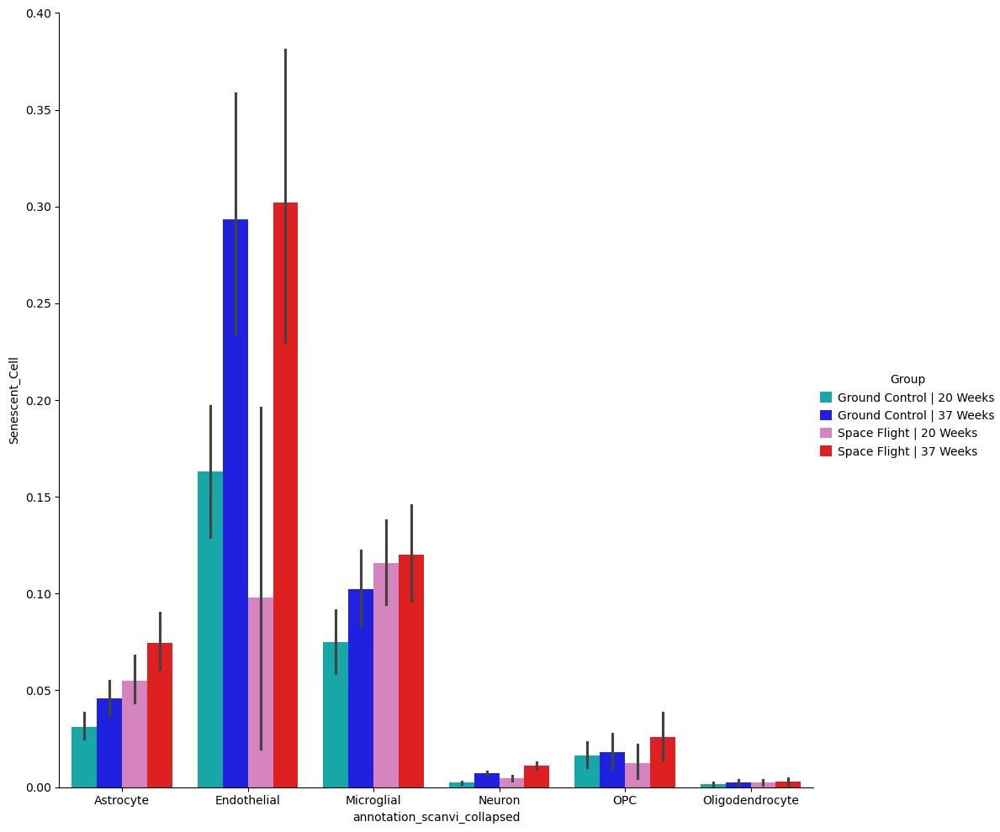

In [19]:
print("Percent Senescent: \n\n", round(self.rna.obs.groupby([
    col_celltype, col_batch]).apply(lambda x: x["Senescent_Cell"].astype(
        int).value_counts(normalize=True), include_groups=False) * 100,
    2).unstack(col_celltype))
sns.catplot(self.rna.obs, y="Senescent_Cell", x=col_celltype,
            hue=col_batch, kind="bar", palette=palette[col_batch], height=10)

# SnC DEGs

## Overall

... storing 'Senescent_Cell_Label_senmayo' as categorical
... storing 'Senescent_Cell_Label_hierarchy_senmayo' as categorical
... storing 'Senescent_Cell_Label_senmayo_3' as categorical
... storing 'Senescent_Cell_Label_by_Type_senmayo' as categorical
... storing 'SnC_hierarchy_senmayo' as categorical
... storing 'Senescent_Cell_Label' as categorical
... storing 'SnC_hierarchy' as categorical
... storing 'Senescent_Cell_Label_by_Type' as categorical
... storing 'Senescent_Cell_Label_by_Type_senmayo_3' as categorical


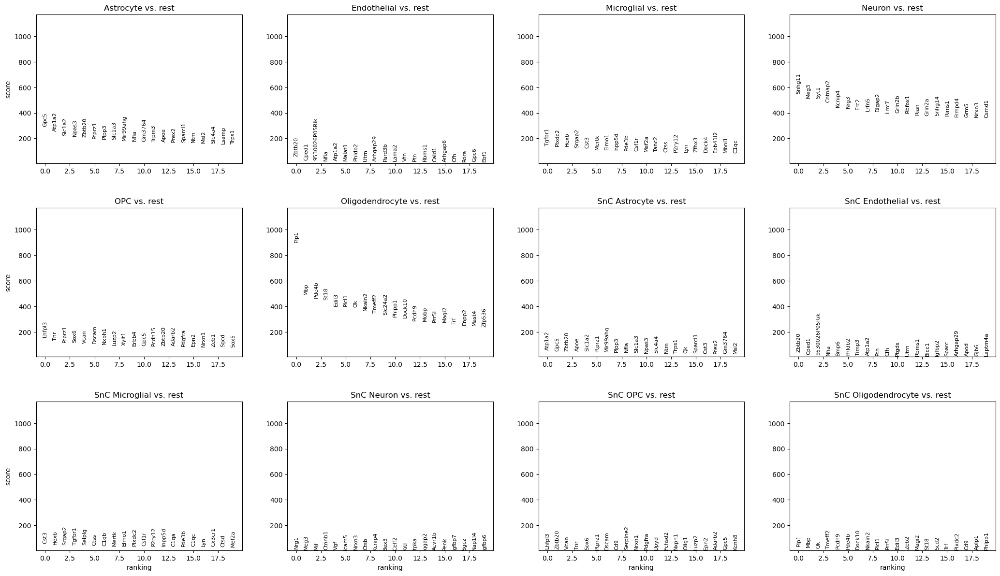

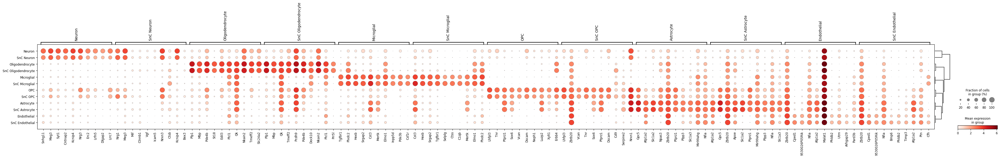

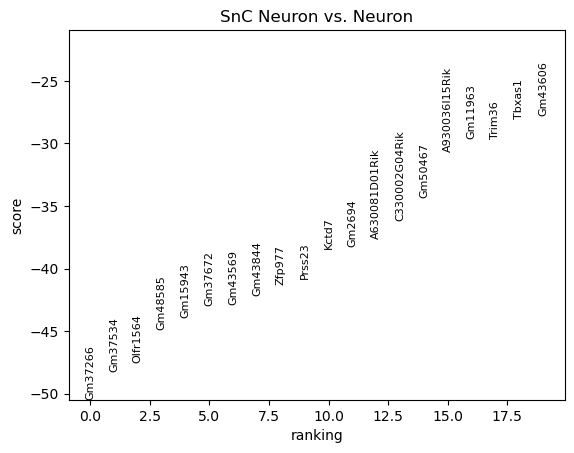

categories: Astrocyte, Endothelial, Microglial, etc.
var_group_labels: SnC Neuron


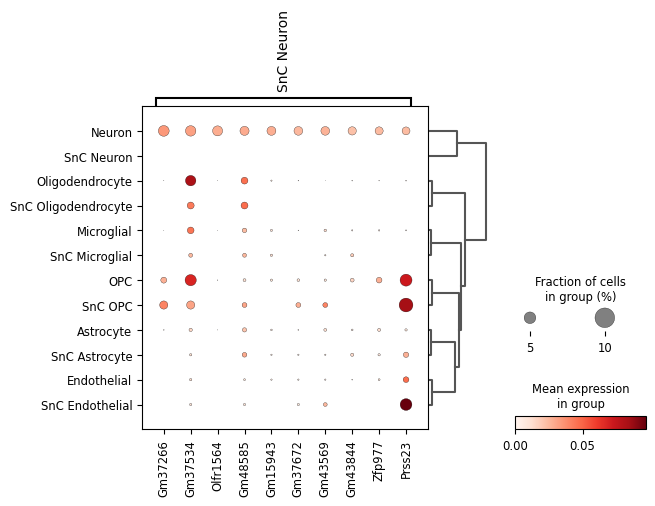

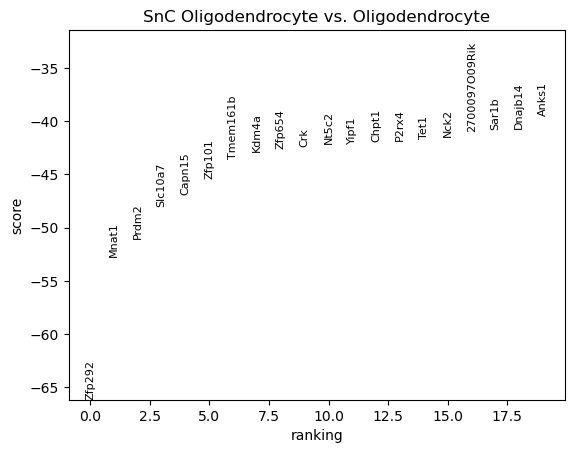

categories: Astrocyte, Endothelial, Microglial, etc.
var_group_labels: SnC Oligodendrocyte


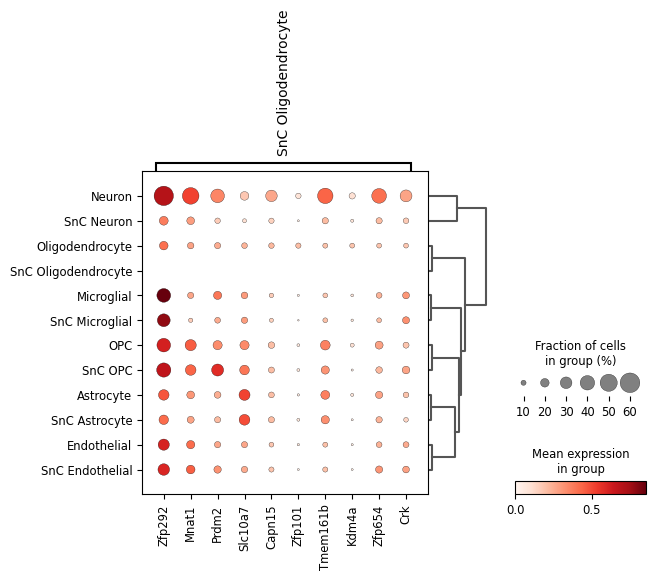

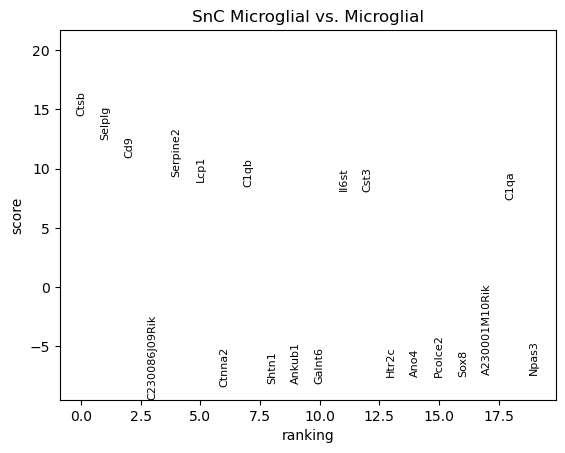

categories: Astrocyte, Endothelial, Microglial, etc.
var_group_labels: SnC Microglial


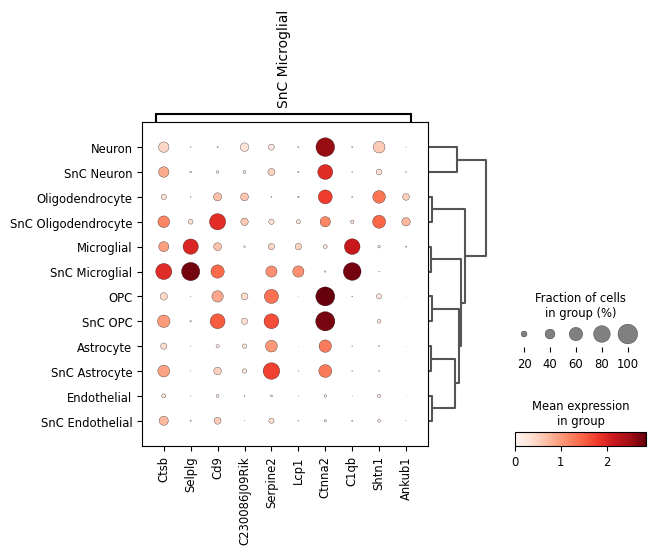

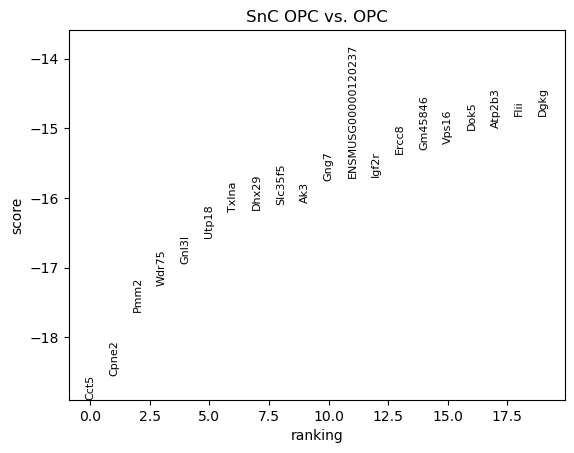

categories: Astrocyte, Endothelial, Microglial, etc.
var_group_labels: SnC OPC


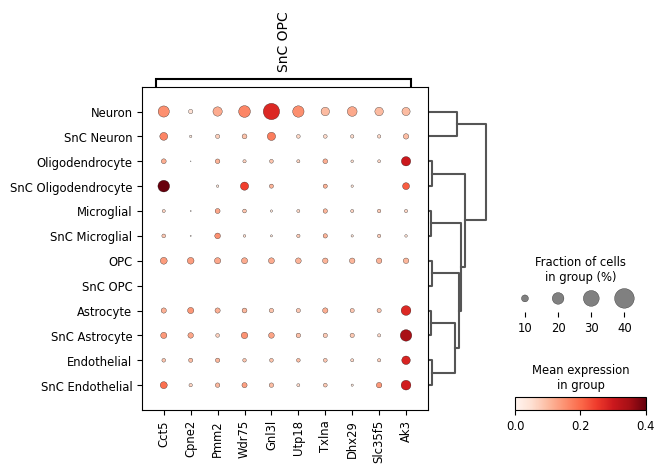

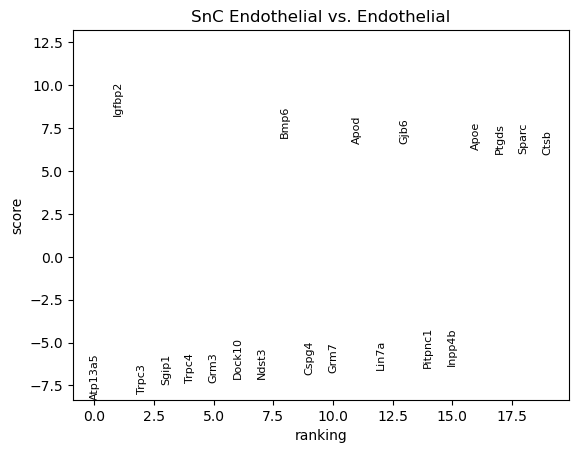

categories: Astrocyte, Endothelial, Microglial, etc.
var_group_labels: SnC Endothelial


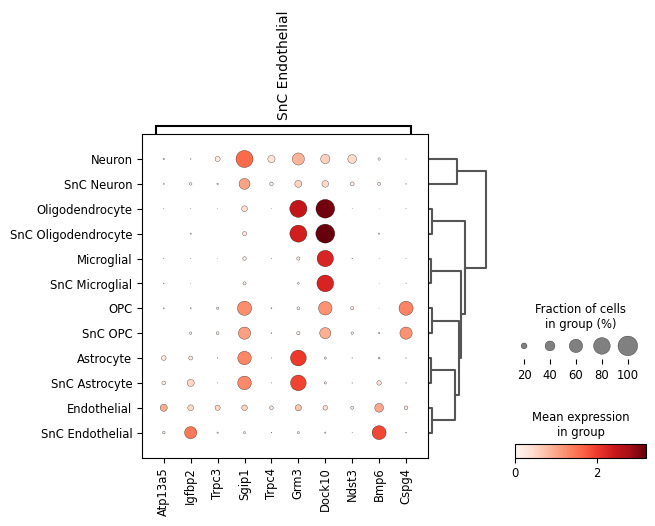

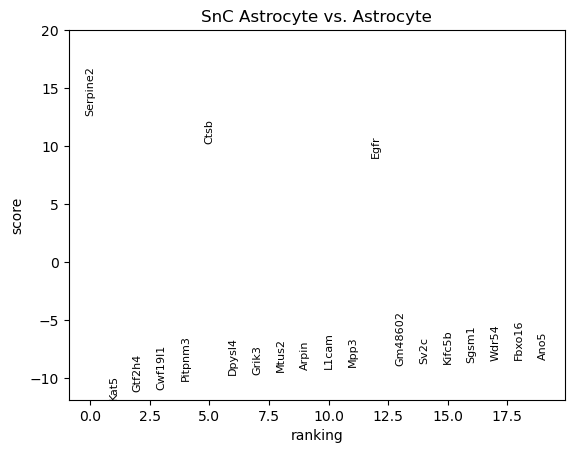

categories: Astrocyte, Endothelial, Microglial, etc.
var_group_labels: SnC Astrocyte


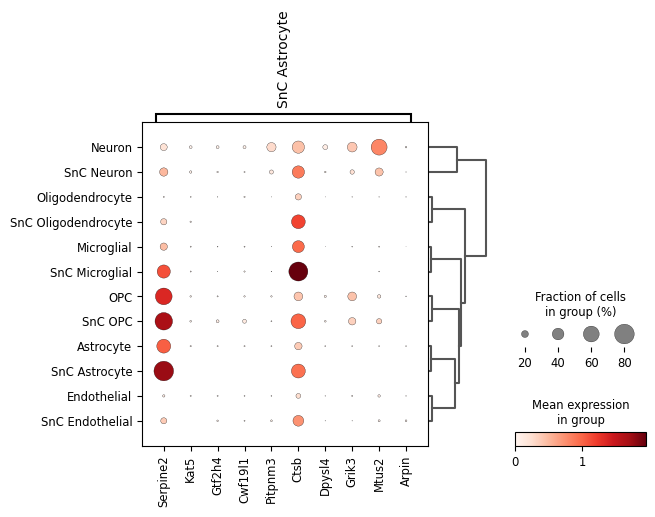

In [20]:
p_threshold = 1e-10
lfc_threshold = 1
self.find_markers(col_celltype="Senescent_Cell_Label_by_Type")
df_snc_markers = {}
df_snc_markers["All"] = self.get_markers_df(
    n_genes=50, col_celltype="Senescent_Cell_Label_by_Type",
    log2fc_threshold=1, p_threshold=1e-10)
# print(df_snc_markers["All"].loc[pd.unique([
#     i[0] for i in df_snc_markers["All"].index.values if (
#         "SnC" in i[0])])].groupby("Senescent_Cell_Label_by_Type").apply(
#             lambda x: x.head(3)))
for x in self.rna.obs[col_celltype].unique():
    df_snc_markers[x] = self.find_markers(
        col_celltype="Senescent_Cell_Label_by_Type",
        reference=x, groups=[x, f"SnC {x}"], rankby_abs=True,
        inplace=False).reset_index(0, drop=True).assign(**{
            col_celltype: f"SnC {x}"}).reset_index().set_index([
                col_celltype, "names"])
df_snc_markers = pd.concat(df_snc_markers, names=["Comparison"])
df_snc_markers = df_snc_markers.rename_axis([
    "Comparison", col_celltype, "names"]).rename({
        "logfoldchanges": "log_fc"}, axis=1).assign(
            log_fc_abs=df_snc_markers["logfoldchanges"].abs())
df_snc_markers_top = df_snc_markers[df_snc_markers.pvals_adj < p_threshold]
df_snc_markers_top = df_snc_markers_top[
    df_snc_markers.log_fc_abs >= lfc_threshold]
df_snc_markers_top = df_snc_markers_top.groupby([
    "Comparison", col_celltype]).apply(
        lambda x: x.assign(scores_abs=x.scores.abs()).sort_values(
            "scores_abs", ascending=False).head(20),
        include_groups=False).reset_index([0, 1], drop=True)

## By Group

### Find Snc versus Non-SnC DEGs by Group

In [21]:
res_rank_genes, p_threshold = {}, 1e-10

for x in self.rna.obs[col_condition].unique():
    res_rank_genes[x] = {}
    for c in self.rna.obs[self.rna.obs[col_condition] == x][
            col_celltype].unique():
        s_iter = (self.rna.obs[col_condition] == x) & (self.rna.obs[
            "Senescent_Cell_Label_by_Type"].isin([c, f"SnC {c}"]))
        all_pres = all([i in self.rna[s_iter].obs[
            "Senescent_Cell_Label_by_Type"].to_list()
                        for i in [c, f"SnC {c}"]])
        if all_pres is False:
            print(f"SnC not in {c} for {x}")
            continue
        tmp = sc.tl.rank_genes_groups(
            self.rna[s_iter], "Senescent_Cell_Label_by_Type", rankby_abs=True,
            layer="log1p", groups=[c, f"SnC {c}"], reference=c, copy=True)
        res_rank_genes[x][c] = sc.get.rank_genes_groups_df(
            tmp, f"SnC {c}", pval_cutoff=p_threshold)
    tmp = sc.tl.rank_genes_groups(
            self.rna[self.rna.obs[col_condition] == x],
            "Senescent_Cell_Label", rankby_abs=True,
            layer="log1p", reference="Non-Senescent", copy=True)
    res_rank_genes[x]["Overall"] = sc.get.rank_genes_groups_df(
            tmp, f"Senescent", pval_cutoff=p_threshold)
    res_rank_genes[x] = pd.concat(res_rank_genes[x], names=[col_celltype])
res_rank_genes = pd.concat(res_rank_genes, names=[col_condition])
res_rank_genes = res_rank_genes.assign(
    logfoldchanges_abs=res_rank_genes.logfoldchanges.abs())
res_rank_genes_top = res_rank_genes.reset_index().groupby([
    col_condition, col_celltype]).apply(
        lambda x: x.sort_values("logfoldchanges_abs").iloc[:20],
        include_groups=False).reset_index(2, drop=True).set_index(
            "names", append=True).rename_axis([
                col_condition, col_celltype, "variable"])
res_rank_genes_top

level_2     scores  logfoldchanges         pvals     pvals_adj  logfoldchanges_abs
Condition      annotation_scanvi_collapsed variable                                                                                         
Ground Control Astrocyte                   Dnai4               60  -7.532269       -3.409990  3.653953e-13  6.055050e-11            3.409990
                                           Alg5                64  -7.457073       -3.442318  4.519470e-13  7.388111e-11            3.442318
                                           Atp8a2              67  -7.355440       -3.568862  5.233833e-13  8.408923e-11            3.568862
                                           Far1os              55  -7.759039       -3.675905  2.667213e-14  5.562979e-12            3.675905
                                           Dnajb1              74  -7.310317      -24.270786  3.140755e-13  5.276905e-11           24.270786
                                           Shkbp1              71  -7.322898      -24.297029  2.862980e-13  5.019344e-11           24.297029
                                           Nxt2                68  -7.346299      -24.297848  2.409020e-13  4.415442e-11           24.297848
                                           Cetn2               69  -7.339543      -24.305641  2.532276e-13  4.572082e-11           24.305641
                                           Efcab12             72  -7.314837      -24.355375  3.038057e-13  5.250197e-11           24.355375
                                           Lrrtm1              62  -7.491515      -24.369284  8.156986e-14  1.591533e-11           24.369284
                                           L1cam               70  -7.324287      -24.375507  2.833827e-13  5.019344e-11           24.375507
                                           Slc35e3             66  -7.377574      -24.377438  1.911101e-13  3.556707e-11           24.377438
                                           Fbxo16              65  -7.429897      -24.382870  1.294644e-13  2.447080e-11           24.382870
                                           C77080              75  -7.239285      -24.386814  5.282947e-13  8.408923e-11           24.386814
                                           4932443L11Rik       73  -7.312694      -24.388893  3.086320e-13  5.258481e-11           24.388893
                                           Gm42664             59  -7.541192      -24.414322  5.605980e-14  1.130259e-11           24.414322
                                           Sv2c                54  -7.792601      -24.478643  8.105555e-15  1.782780e-12           24.478643
                                           Saxo2               63  -7.483676      -24.483557  8.652436e-14  1.661405e-11           24.483557
                                           Gm42722             61  -7.510676      -24.492861  7.060303e-14  1.400139e-11           24.492861
                                           A130050O07Rik       52  -7.830372      -24.497906  6.030621e-15  1.376461e-12           24.497906
               Microglial                  Selplg               1   8.319475        1.312419  1.178251e-14  2.850661e-11            1.312419
                                           Ctsb                 0   9.934962        2.022084  5.868506e-19  7.099132e-15            2.022084
                                           C230086J09Rik        5  -7.634874      -25.850742  3.764137e-14  7.588885e-11           25.850742
                                           Nipal3               3  -7.830887      -26.120775  8.504930e-15  2.850661e-11           26.120775
                                           Faim2                4  -7.811448      -26.144331  9.871771e-15  2.850661e-11           26.144331
                                           Tenm1                6  -7.614305      -26.162209  4.391353e-14  7.588885e-11           26.162209
                                           Mtrf1l               2  -7.947381      -26.196335  3.457597e-15  2.

### Figures by Batch (Cell Types in Same Figure)

In [ ]:
# if col_batch in self.rna.obs.index.names:
#     self.rna.obs = self.rna.obs.reset_index(col_batch)
# for k in res_rank_genes_top[col_batch].unique():
#     g_top_snc_sfold = dict(res_rank_genes_top.loc[k].groupby(
#         col_celltype).apply(lambda x: x.loc[x.name].index.values))
#     fig = self.plot(subset=self.rna.obs[col_batch] == k,
#                     genes=g_top_snc_sfold, col_celltype=col_celltype,
#                     kind=["heat"], figsize=(20, 20),
#                     standard_scale="var", title=k, fontsize=20)

#### Genes Grouped by Batch

In [ ]:
# for k in res_rank_genes_top.reset_index()[col_celltype].unique():
#     g_top_snc_sfold = dict(res_rank_genes_top.loc[:, k, :].groupby(
#         col_batch).apply(lambda x: x.loc[x.name].index.values))
#     fig = self.plot(subset=self.rna.obs[col_celltype] == k,
#                     genes=g_top_snc_sfold, col_celltype=col_batch,
#                     kind="matrix", figsize=(20, 20),
#                     swap_axes=True, title=k,
#                     standard_scale="var", fontsize=20)

#### Not Grouped

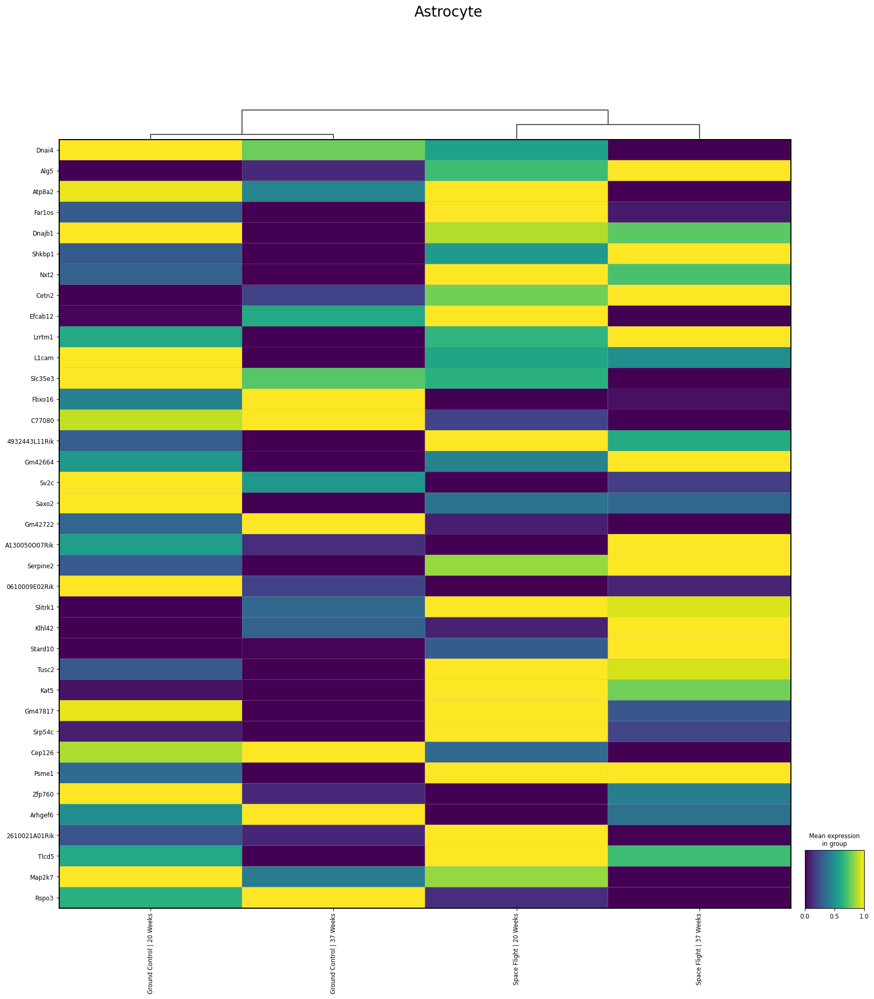

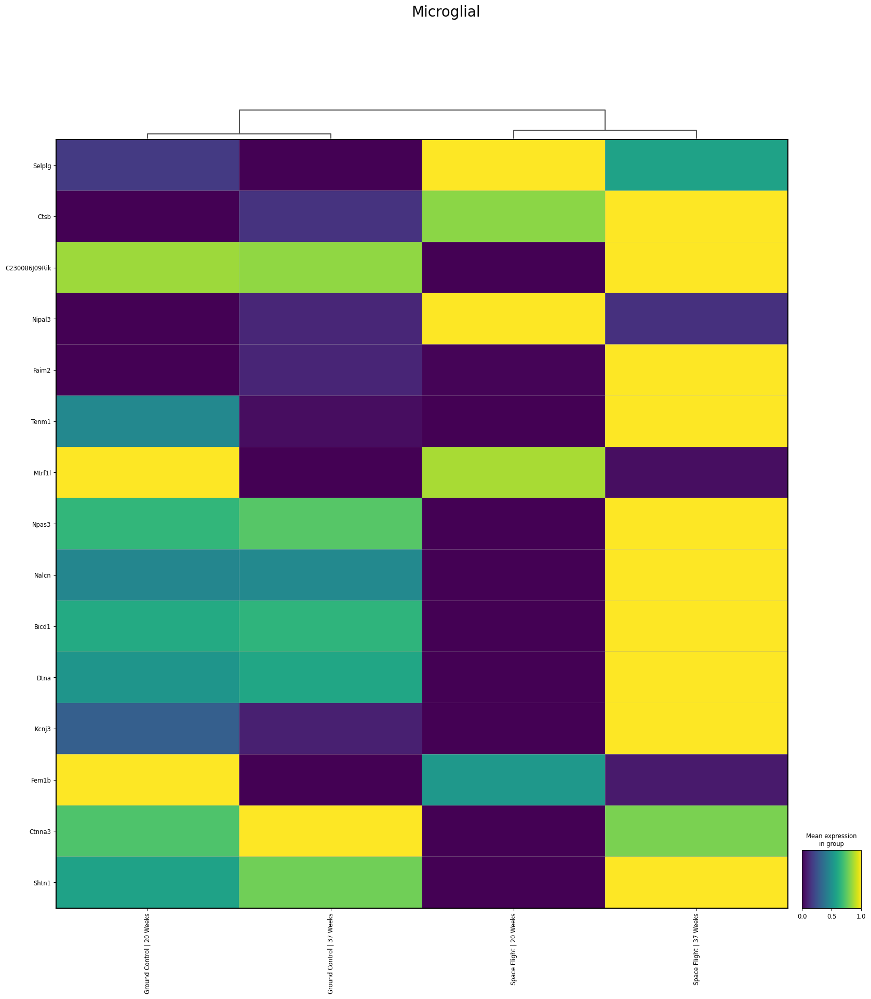

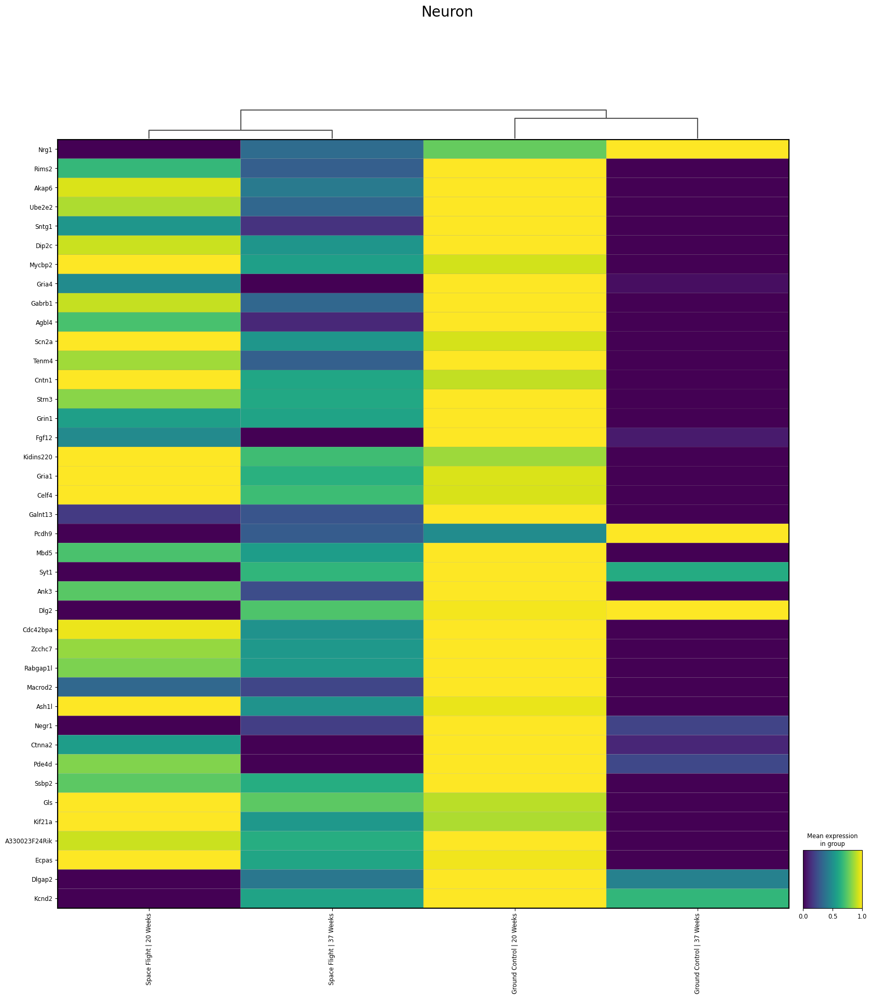

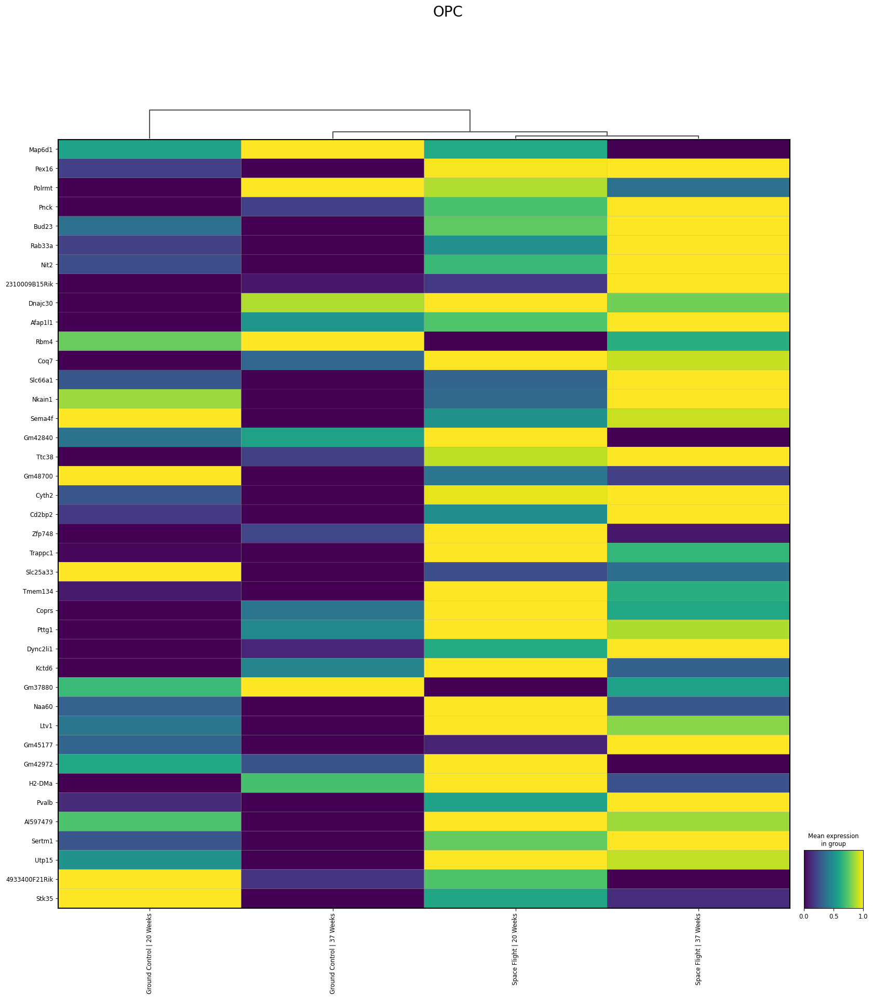

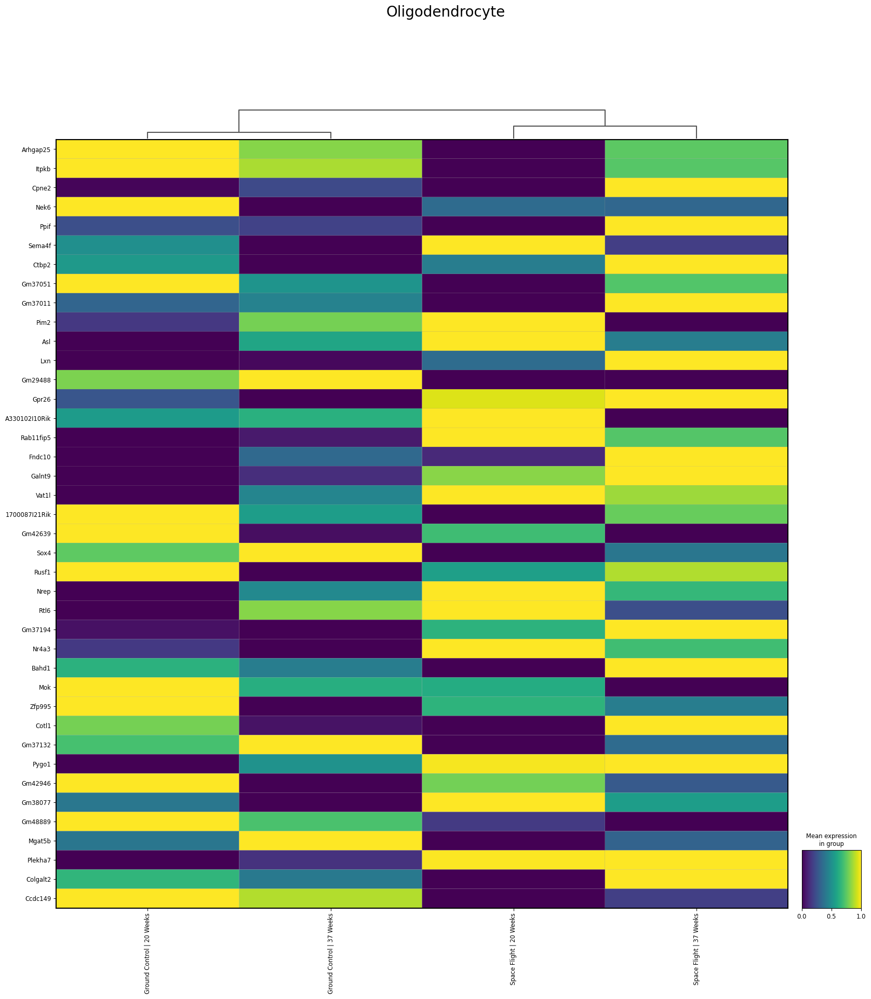

In [22]:
for k in [i for i in res_rank_genes_top.reset_index()[col_celltype].unique(
        ) if i in self.rna.obs[col_celltype].unique()]:
    g_top_snc_sfold = list(res_rank_genes_top.loc[:, k, :].reset_index(
        ).variable.unique())
    fig = self.plot(subset=self.rna.obs[col_celltype] == k,
                    genes=g_top_snc_sfold, col_celltype=col_batch,
                    kind="matrix", figsize=(20, 20), swap_axes=True, title=k,
                    dendrogram=True, standard_scale="var", fontsize=20)

# Plot

## Comparison

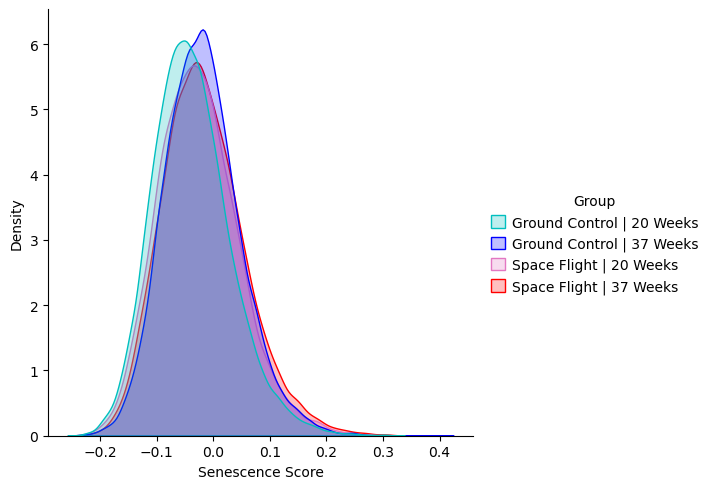

In [23]:
scores = self.rna.obs[[col_batch] + [
    f"score_{x}" for x in sen_metrics]].set_index(
        col_batch, append=True)
scores = scores.rename_axis("Metric", axis=1).stack().to_frame(
    "Senescence Score").reset_index()
sns.displot(scores, kind="kde", cut=0, fill=True, common_norm=False,
            x="Senescence Score", hue=col_batch, palette=palette[col_batch])

## Scores

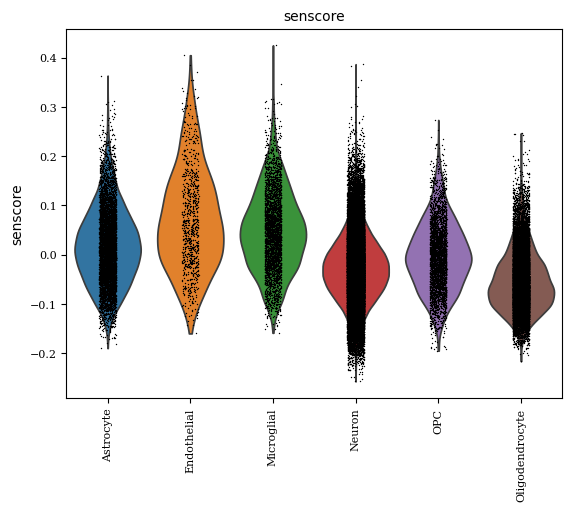



***Plotting group Neuron (0.0%)...


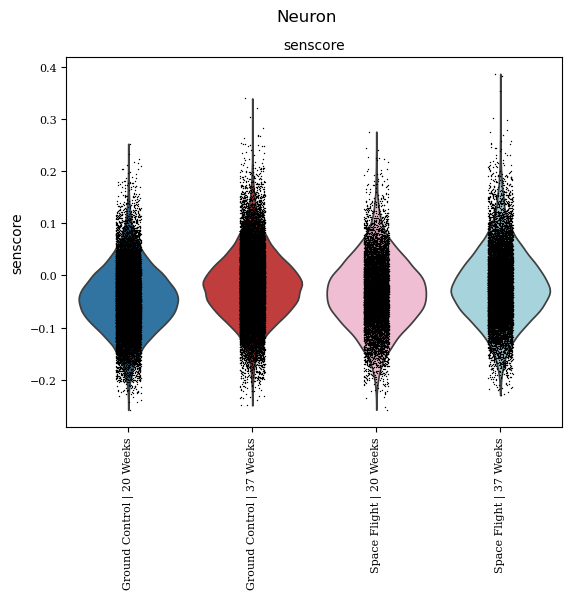



***Plotting group Oligodendrocyte (16.7%)...


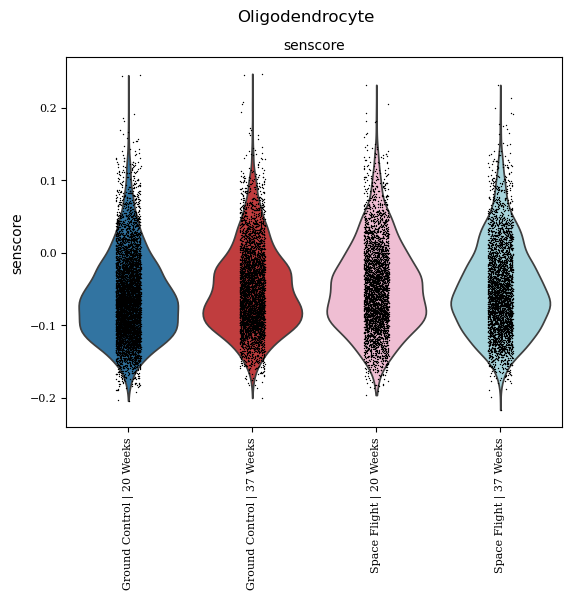



***Plotting group Microglial (33.3%)...


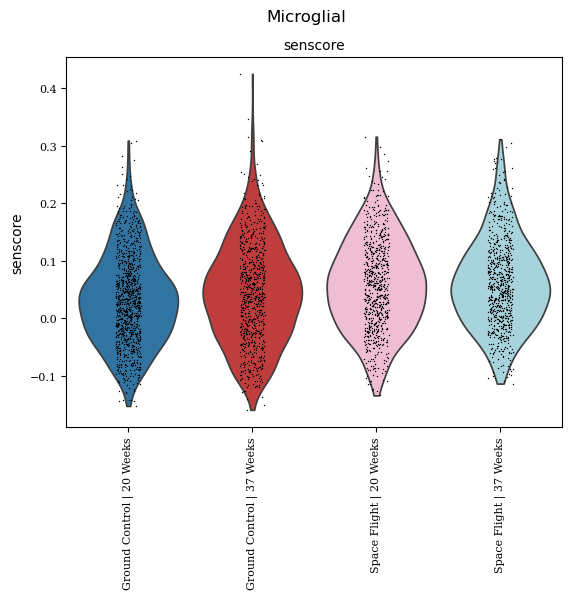



***Plotting group OPC (50.0%)...


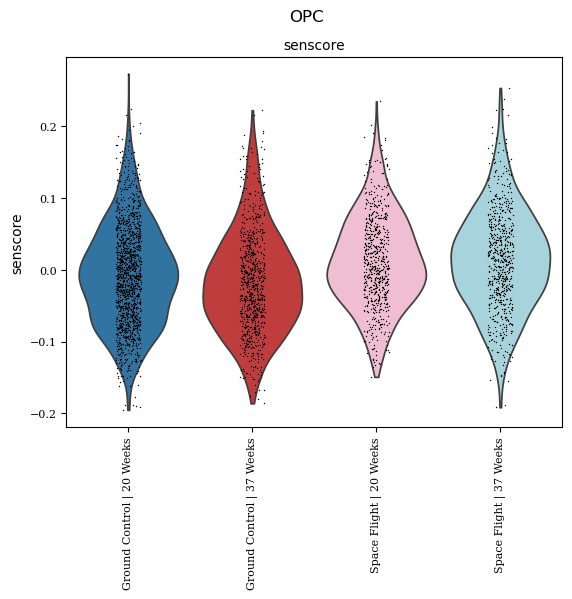



***Plotting group Endothelial (66.7%)...


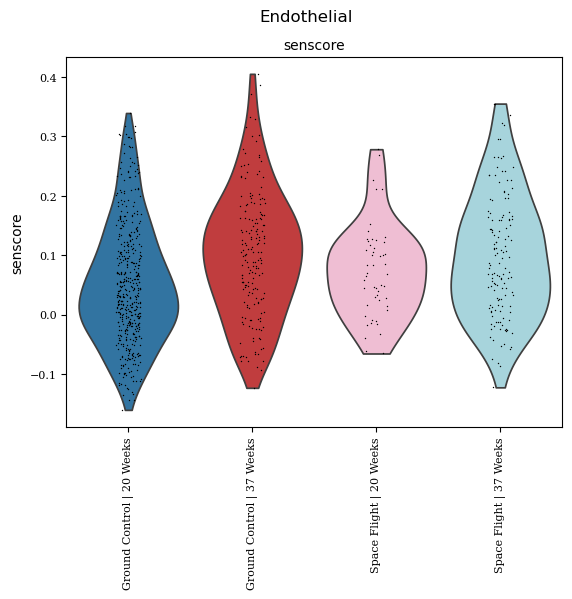



***Plotting group Astrocyte (83.3%)...


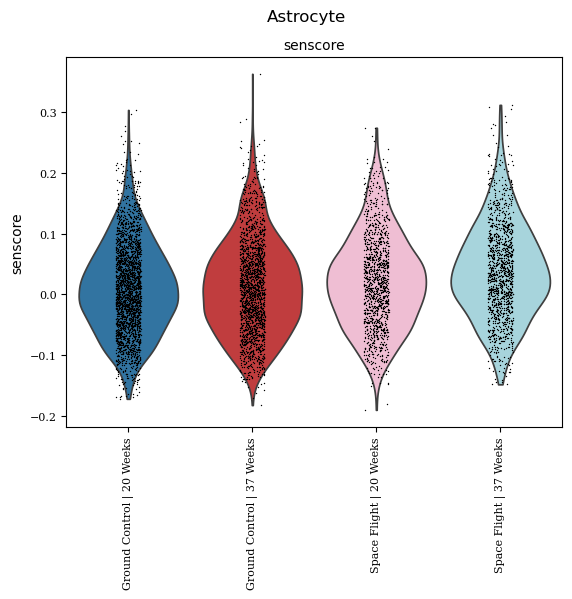

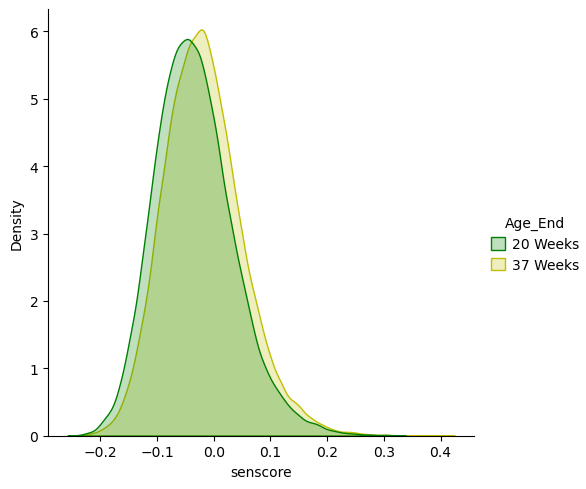

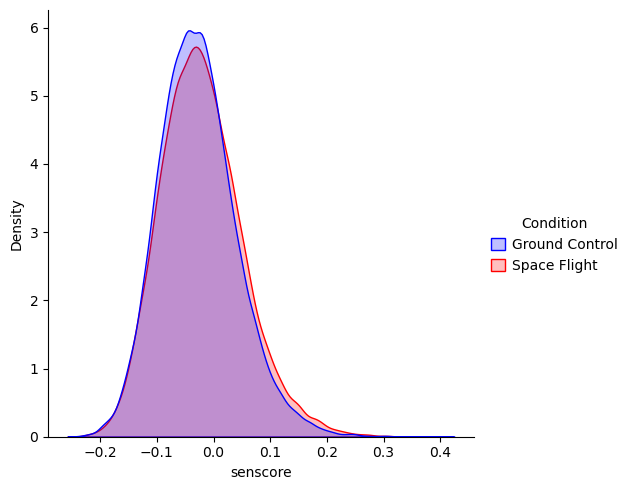

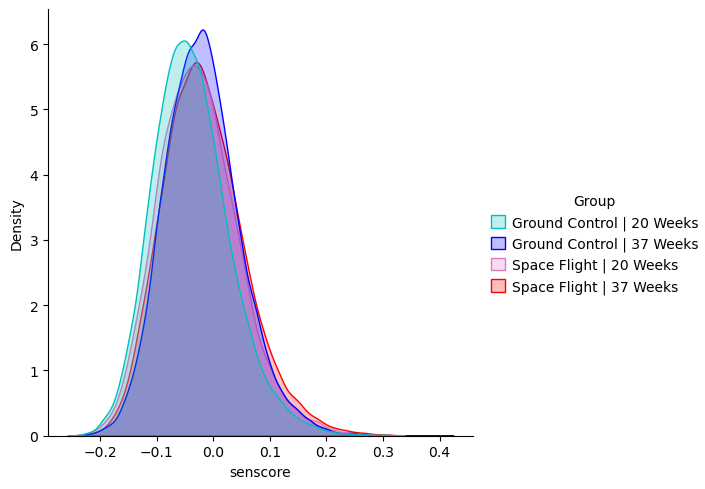

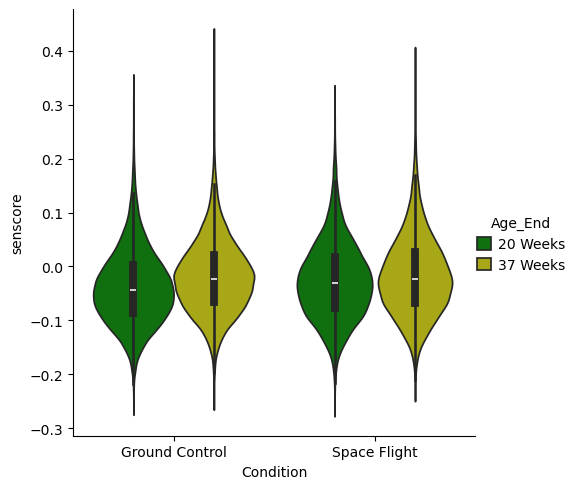

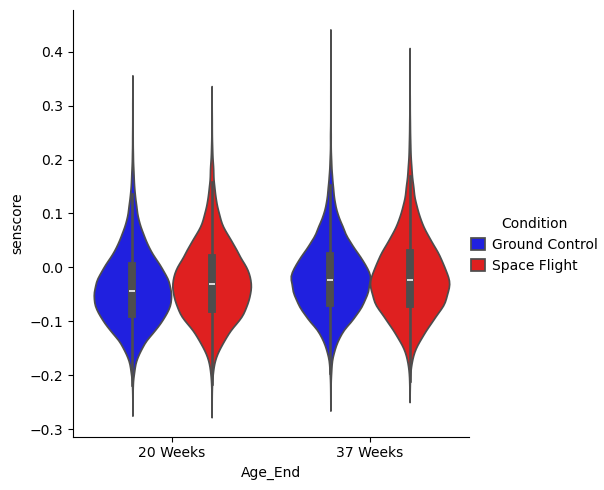

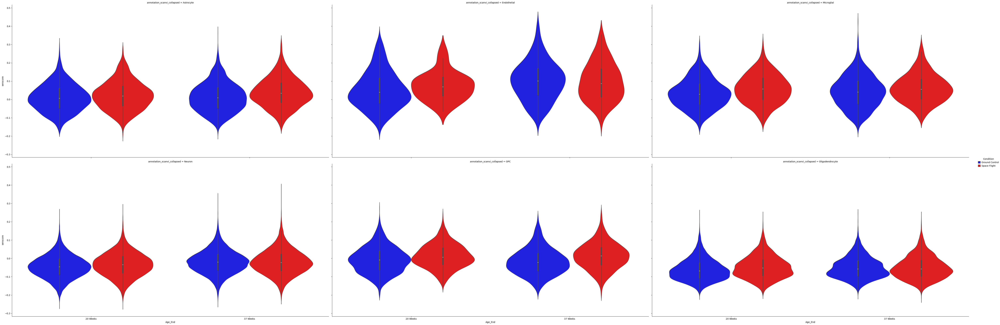

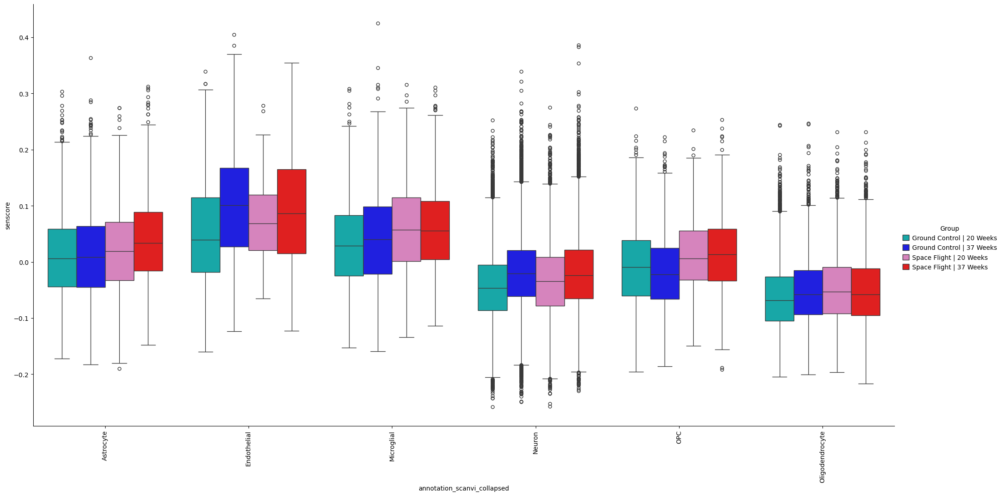

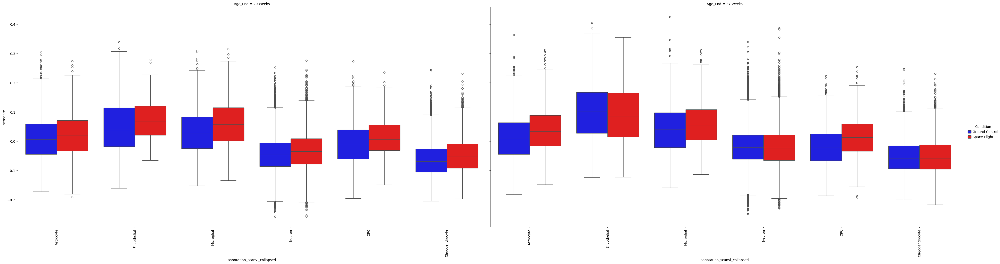

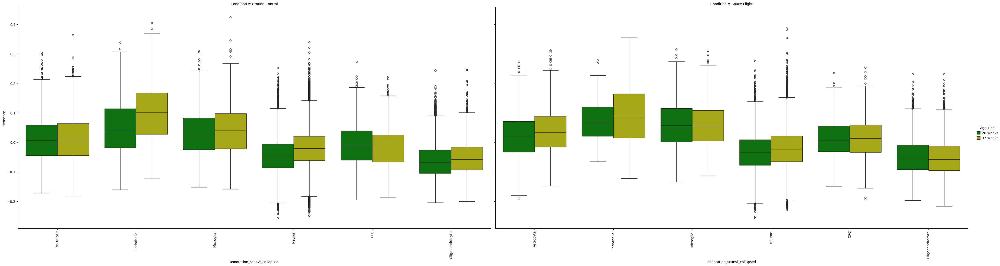

In [47]:
# UMAP with Senescence Scores
bnds = self.rna.obs["senscore"].describe(percentiles=[0.75, 0.99])
# _ = self.plot(kind="umap", genes=["senscore", col_celltype], umap=dict(
#     palette=None, color_map="Reds", vmin=bnds["75%"], vmax=bnds["99%"]))

# Violin Plot of Senescence Scores
_ = self.plot(kind="violin", genes=["senscore"], common_norm=False,
              col_celltype=col_celltype, rotation=90)
_ = self.plot(kind="violin", genes=["senscore"], common_norm=False,
              by_group=col_celltype, col_wrap=1,
              col_celltype=col_batch, rotation=90)

# KDEs
fig_sen_kde = {}
for x in [col_age, col_condition, col_batch]:
    fig_sen_kde[x] = sns.displot(self.rna.obs, hue=x, x="senscore",
                                 palette=palette[x], kind="kde",
                                 cut=0, common_norm=False, fill=True)

# Overall (All Cell Types)
fig_sen_overall = sns.catplot(self.rna.obs, x=col_condition,
                              hue=col_age, y="senscore",
                              palette=palette[col_age],
                              kind="violin")
fig_sen_overall_2 = sns.catplot(self.rna.obs, x=col_age, hue=col_condition,
                                palette=palette[col_condition],
                                y="senscore", kind="violin")

# By Cell Type
fig_sen_rc = sns.catplot(self.rna.obs, col=col_celltype, y="senscore",
                         palette=palette[col_condition],
                         hue=col_condition, x=col_age, kind="violin",
                         height=10, aspect=2, col_wrap=3)
fig_sen = sns.catplot(self.rna.obs, x=col_celltype, y="senscore",
                      palette=palette[col_batch],
                      hue=col_batch, kind="box", height=10, aspect=2)
for a in fig_sen.axes.flatten():
    a.tick_params(axis="x", labelrotation=90)
fig_sen_2 = sns.catplot(self.rna.obs, x=col_celltype, y="senscore",
                        col=col_age, hue=col_condition,
                        palette=palette[col_condition],
                        kind="box", height=10, aspect=2)
for a in fig_sen_2.axes.flatten():
    a.tick_params(axis="x", labelrotation=90)
fig_sen_3 = sns.catplot(self.rna.obs, x=col_celltype, y="senscore",
                        col=col_condition, hue=col_age,
                        palette=palette[col_age],
                        kind="box", height=10, aspect=2)
for a in fig_sen_3.axes.flatten():
    a.tick_params(axis="x", labelrotation=90)

## Burden 

Group by sample and cell type and get percentage of senescent cells



                 min  25%  50%  75%    max
Condition                                
Ground Control  0.0  0.3  2.8  7.5   66.7
Space Flight    0.0  0.3  1.6  6.9  100.0


           min  25%  50%  75%    max
Age_End                            
20 Weeks  0.0  0.2  1.7  6.0   66.7
37 Weeks  0.0  0.4  2.8  7.5  100.0


                          min  25%  50%  75%    max
Condition      Age_End                            
Ground Control 20 Weeks  0.0  0.2  2.3  6.1   66.7
               37 Weeks  0.0  0.4  2.9  9.2   38.8
Space Flight   20 Weeks  0.0  0.2  1.2  4.9   21.1
               37 Weeks  0.0  0.4  1.7  7.4  100.0


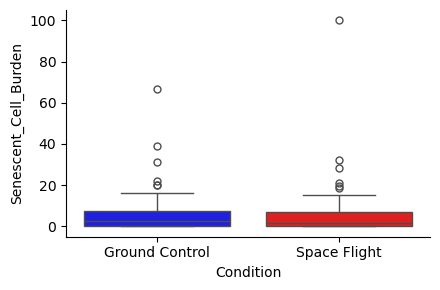

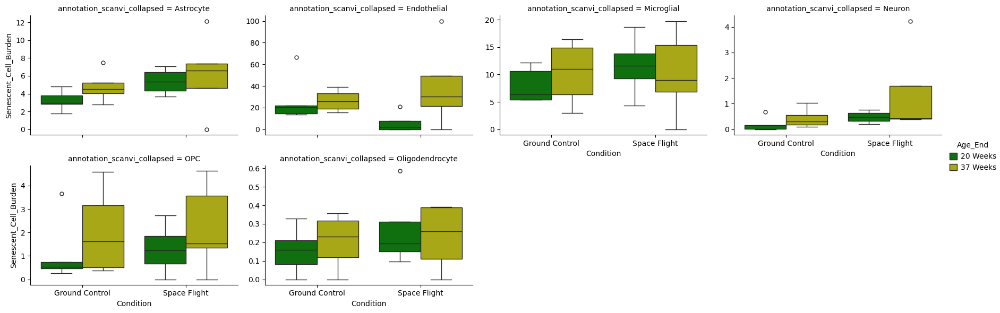

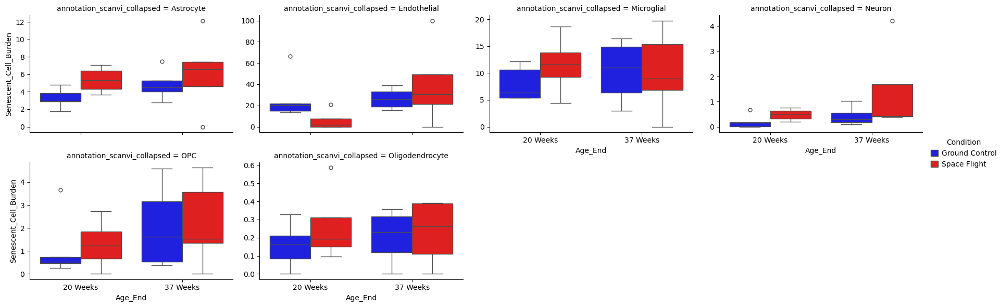

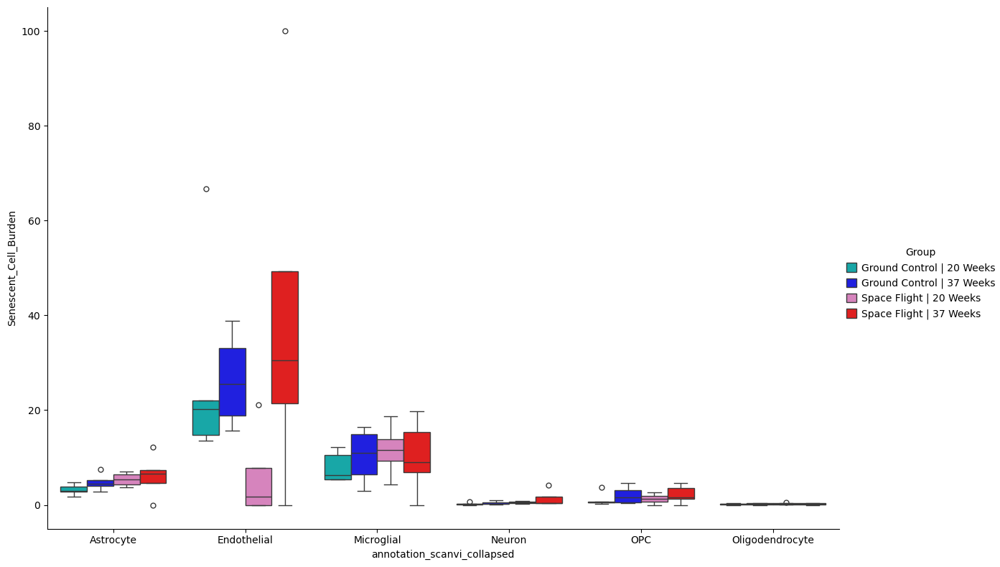

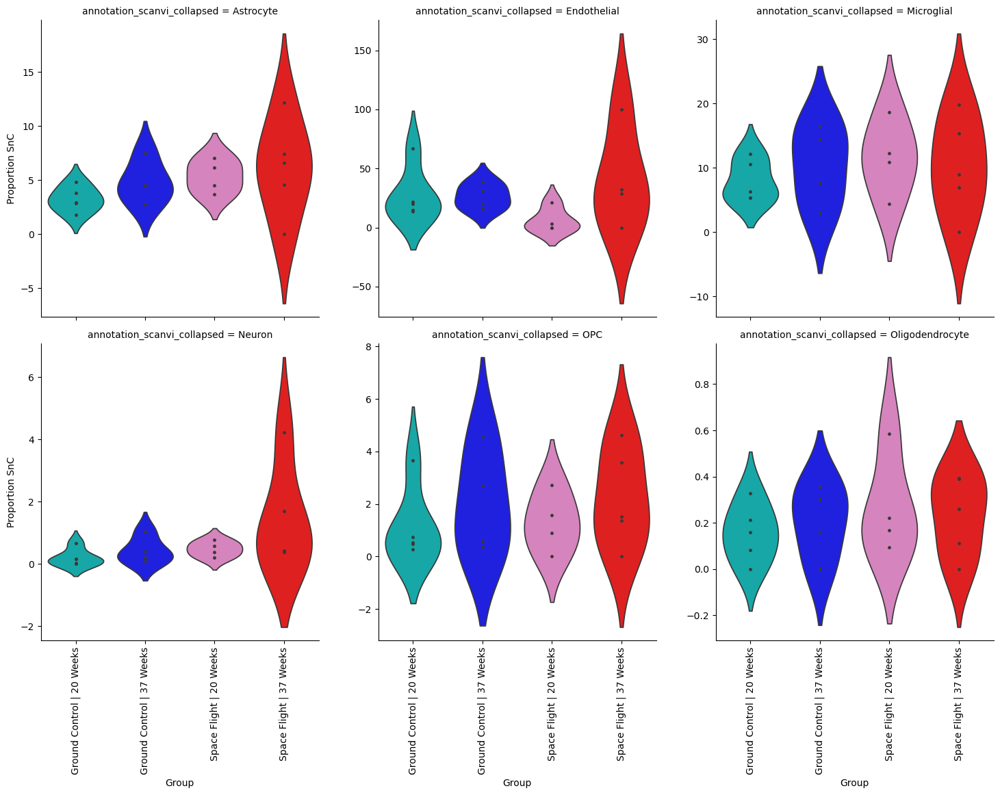

In [51]:
grps = [col_sample, col_celltype, col_age, col_condition, col_batch]
dff = self.rna.obs[grps + ["Senescent_Cell"]].groupby(grps).apply(
    lambda x: x["Senescent_Cell"].mean(), include_groups=False
    ).to_frame("Senescent_Cell_Burden") * 100
# kws_plot = dict(kind="violin", split=False, , common_norm=True)
kws_plot = dict(kind="box", errorbar=("ci", 95))

sns.catplot(y="Senescent_Cell_Burden", x=col_condition, **kws_plot,
            palette=palette[col_condition],
            hue=col_condition, data=dff, height=3, aspect=1.5)
sns.catplot(y="Senescent_Cell_Burden", x=col_condition, **kws_plot,
            col=col_celltype, col_wrap=4, sharey=False,
            palette=palette[col_age],
            hue=col_age, data=dff, height=3, aspect=1.5)
sns.catplot(y="Senescent_Cell_Burden", hue=col_condition, **kws_plot,
            col=col_celltype, col_wrap=4, sharey=False,
            palette=palette[col_condition],
            x=col_age, data=dff, height=3, aspect=1.5)
sns.catplot(y="Senescent_Cell_Burden", x=col_celltype, **kws_plot,
            palette=palette[col_batch],
            hue=col_batch, data=dff, height=8, aspect=1.5)

props_snc = self.rna.obs.groupby([col_celltype, col_batch, col_sample]).apply(
    lambda x: 100 * np.mean(x["Senescent_Cell"]), include_groups=False)
fig = sns.catplot(data=props_snc.to_frame("Proportion SnC"),
                  y="Proportion SnC", hue=col_batch, x=col_batch,
                  col=col_celltype, col_wrap=3, kind="violin",
                  palette=palette[col_batch], inner="point",
                  sharey=False, common_norm=False)
for a in fig.axes.flatten():
    a.tick_params(axis="x", labelrotation=90)

# props_snc = self.rna.obs.groupby([
#     col_celltype, col_batch, col_sample]).apply(
#         lambda x: 100 * np.mean(x[f"Senescent_Cell_{use_metric}_{p_h}"]),
#         include_groups=False)
# fig = sns.catplot(data=props_snc.to_frame("Proportion SnC"),
#                   y="Proportion SnC", hue=col_batch, x=col_batch,
#                   col=col_celltype, col_wrap=3, kind="violin",
#                   palette=palette[col_batch], inner="point",
#                   common_norm=False)
# for a in fig.axes.flatten():
#     a.tick_params(axis="x", labelrotation=90)

for x in [col_condition, col_age, [col_condition, col_age]]:
    print("\n\n", round(dff["Senescent_Cell_Burden"].groupby(x).describe()[[
        "min", "25%", "50%", "75%", "max"]], 1))

# Analyze

## Regressions & ANOVAs & MEMs

In [60]:
r_dff = polars.DataFrame(dff.reset_index())  # pymer-compatible aggregated df
r_rna = polars.DataFrame(self.rna.obs.rename({
    col_celltype: "CT_"}, axis=1).copy())  # pymer-compatible cell-level df
lvls = ["key_control", "key_treatment"]
factors = {col_condition: [keys[col_condition][i] for i in lvls],
           col_age: [keys[col_age][i] for i in lvls],
           "CT_": [ref_ct] + [i for i in self.rna.obs[
               col_celltype].unique() if i != ref_ct]}

### Scores

##### Cell Type Random Effects

In [61]:
# # Age + Condition
# model_ca_mlm = lmer(f"senscore ~ {col_condition} + {col_age} +"
#                     f"(1 | {col_sample})", data=r_rna)  # set up model
# model_ca_mlm.set_factors(factors)
# model_ca_mlm.set_transforms({"senscore": "zscore"})
# model_ca_mlm.anova(summary=True).show()

# # Age * Condition
# model_ca_mlm_i = lmer(
#     f"senscore ~ {col_condition} * {col_age} + "
#     f"(1 | {col_sample})", data=r_rna)  # set up model
# model_ca_mlm_i.set_factors(factors)
# model_ca_mlm_i.set_transforms({"senscore": "zscore"})
# model_ca_mlm_i.anova(summary=True).show()

# # Age * Condition (Condition as Random Effect)
# model_ca_mlm_ii = lmer(
#     f"senscore ~ {col_condition} * {col_age} + "
#     f"(1 | {col_sample}) + (1 + {col_condition} | CT_)",
#     data=r_rna)  # set up model
# model_ca_mlm_ii.set_factors(factors)
# model_ca_mlm_ii.set_transforms({"senscore": "zscore"})
# model_ca_mlm_ii.anova(summary=True).show()

# Age * Condition (Age and Condition as Random Effect)
model_ca_mlm_iii = lmer(
    f"senscore ~ {col_condition} * {col_age} + (1 | {col_sample})"
    f" + (1 + {col_condition} + {col_age} | CT_)",
    data=r_rna)  # set up model
model_ca_mlm_iii.set_factors(factors)
model_ca_mlm_iii.set_transforms({"senscore": "zscore"})
model_ca_mlm_iii.anova(summary=True).show()

# Model Comparison
# compare(model_ca_mlm, model_ca_mlm_i, model_ca_mlm_i,
#         model_ca_mlm_ii, model_ca_mlm_iii).show()

# GLM Version of Results
# model_ca_mlm.summary().show()
# model_ca_mlm_i.summary().show()
# model_ca_mlm_ii.summary().show()
model_ca_mlm_iii.summary().show()

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.



ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Condition 
 1.000 
 inf 
 6.685 
 6.685 
 0.009723 
 ** 
 
 
 Age_End 
 1.000 
 inf 
 2.152 
 2.152 
 0.1423 
 
 
 
 Condition:Age_End 
 1.000 
 inf 
 0.105 
 0.105 
 0.7464 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lmer(senscore~Condition*Age_End+(1|sample)+(1+Condition+Age_End|CT_)) 
 
 
 Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -138090 
AIC: 276204 | BIC: 276318 
Residual error: 0.921 
 
 
 Random Effects: 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 DF 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.163 
 
 
 
 
 
 
 
 
 
 CT_-sd 
 (Intercept) 
 0.605 
 
 
 
 
 
 
 
 
 
 CT_-sd 
 ConditionSpace Flight 
 0.118 
 
 
 
 
 
 
 
 
 
 CT_-sd 
 Age_End37 Weeks 
 0.259 
 
 
 
 
 
 
 
 
 
 CT_-cor 
 (Intercept) 
 0.310 
 
 
 
 
 
 
 
 
 
 CT_-cor 
 (Intercept) 
 0.501 
 
 
 
 
 
 
 
 
 
 CT_-cor 
 ConditionSpace Flight 
 −0.656 
 
 
 
 
 
 
 
 
 
 Residual-sd 
 Observation 
 0.921 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.298 
 0.258 
 −0.335 
 0.931 
 1.156 
 5.898 
 0.2925 
 
 
 
 
 ConditionSpace Flight 
 0.263 
 0.120 
 0.010 
 0.516 
 2.184 
 17.653 
 0.04274 
 * 
 
 
 
 Age_End37 Weeks 
 0.219 
 0.153 
 −0.109 
 0.547 
 1.429 
 14.278 
 0.1745 
 
 
 
 
 ConditionSpace Flight:Age_End37 Weeks 
 −0.050 
 0.156 
 −0.384 
 0.284 
 −0.323 
 13.916 
 0.7512 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

#### Cell Type as Moderator

In [54]:
# Age + Condition * Cell Type
model_cac_mlm_i2 = lmer(
    f"senscore ~  Aged + Spaceflight * CT_ + "
    f"(1 | {col_sample})", data=r_rna)  # set up model
model_cac_mlm_i2.set_transforms({"senscore": "zscore"})
model_cac_mlm_i2.anova(summary=True).show()

# Age * Condition * Cell Type
model_cac_mlm_i2b = lmer(
    f"senscore ~  Aged * Spaceflight + Spaceflight * CT_ + "
    f"(1 | {col_sample})", data=r_rna)  # set up model
model_cac_mlm_i2b.set_transforms({"senscore": "zscore"})
model_cac_mlm_i2b.anova(summary=True).show()

# Age * Condition * Cell Type
model_cac_mlm_i3 = lmer(
    f"senscore ~  Aged * Spaceflight * CT_ + "
    f"(1 | {col_sample})", data=r_rna)  # set up model
model_cac_mlm_i3.set_transforms({"senscore": "zscore"})
model_cac_mlm_i3.anova(summary=True).show()

# GLM Version of Results
model_cac_mlm_i2.summary().show()
model_cac_mlm_i2b.summary().show()
model_cac_mlm_i3.summary().show()

# Model Comparison
compare(model_cac_mlm_i2, model_cac_mlm_i2b, model_cac_mlm_i3).show()

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.



ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Aged 
 1.000 
 inf 
 6.697 
 6.697 
 0.009657 
 ** 
 
 
 Spaceflight 
 1.000 
 inf 
 11.071 
 11.071 
 <.001 
 *** 
 
 
 CT_ 
 5.000 
 inf 
 2,624.131 
 13,120.655 
 
 *** 
 
 
 Spaceflight:CT_ 
 5.000 
 inf 
 25.705 
 128.525 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.



ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Aged 
 1.000 
 inf 
 6.311 
 6.311 
 0.012 
 * 
 
 
 Spaceflight 
 1.000 
 inf 
 10.459 
 10.459 
 0.001221 
 ** 
 
 
 CT_ 
 5.000 
 inf 
 2,624.141 
 13,120.705 
 
 *** 
 
 
 Aged:Spaceflight 
 1.000 
 inf 
 0.140 
 0.140 
 0.7087 
 
 
 
 Spaceflight:CT_ 
 5.000 
 inf 
 25.701 
 128.505 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.

R messages: 
Note: D.f. calculations have been disabled because the number of observations exceeds 3000.
To enable adjustments, add the argument 'lmerTest.limit = 103274' (or larger)
[or, globally, 'set emm_options(lmerTest.limit = 103274)' or larger];
but be warned that this may result in large computation time and memory use.



ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Aged 
 1.000 
 inf 
 5.599 
 5.599 
 0.01797 
 * 
 
 
 Spaceflight 
 1.000 
 inf 
 9.392 
 9.392 
 0.002179 
 ** 
 
 
 CT_ 
 5.000 
 inf 
 2,547.195 
 12,735.975 
 
 *** 
 
 
 Aged:Spaceflight 
 1.000 
 inf 
 0.076 
 0.076 
 0.7822 
 
 
 
 Aged:CT_ 
 5.000 
 inf 
 47.046 
 235.230 
 <.001 
 *** 
 
 
 Spaceflight:CT_ 
 5.000 
 inf 
 30.423 
 152.115 
 <.001 
 *** 
 
 
 Aged:Spaceflight:CT_ 
 5.000 
 inf 
 15.259 
 76.295 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lmer(senscore~Aged+Spaceflight*CT_+(1|sample)) 
 
 
 Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -138234 
AIC: 276499 | BIC: 276642 
Residual error: 0.922 
 
 
 Random Effects: 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 DF 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.161 
 
 
 
 
 
 
 
 
 
 Residual-sd 
 Observation 
 0.922 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.433 
 0.065 
 0.295 
 0.570 
 6.663 
 16.143 
 <.001 
 *** 
 
 
 
 Aged 
 0.198 
 0.077 
 0.035 
 0.361 
 2.588 
 14.926 
 0.02065 
 * 
 
 
 
 Spaceflight 
 0.296 
 0.080 
 0.128 
 0.464 
 3.714 
 17.497 
 0.001653 
 ** 
 
 
 
 CT_Endothelial 
 0.784 
 0.039 
 0.709 
 0.860 
 20.349 
 103,250.427 
 <.001 
 *** 
 
 
 
 CT_Microglial 
 0.371 
 0.025 
 0.322 
 0.421 
 14.638 
 103,246.477 
 <.001 
 *** 
 
 
 
 CT_Neuron 
 −0.667 
 0.014 
 −0.695 
 −0.639 
 −46.668 
 103,253.241 
 
 *** 
 
 
 
 CT_OPC 
 −0.325 
 0.024 
 −0.371 
 −0.279 
 −13.799 
 103,249.399 
 <.001 
 *** 
 
 
 
 CT_Oligodendrocyte 
 −0.953 
 0.016 
 −0.984 
 −0.921 
 −59.001 
 103,248.641 
 
 *** 
 
 
 
 Spaceflight:CT_Endothelial 
 0.004 
 0.080 
 −0.152 
 0.160 
 0.055 
 103,251.837 
 0.9561 
 
 
 
 
 Spaceflight:CT_Microglial 
 0.046 
 0.039 
 −0.031 
 0.123 
 1.161 
 103,246.518 
 0.2458 
 
 
 
 
 Spaceflight:CT_Neuron 
 −0.166 
 0.024 
 −0.213 
 −0.119 
 −6.885 
 103,255.032 
 <.001 
 *** 
 
 
 
 Spaceflight:CT_OPC 
 0.061 
 0.039 
 −0.016 
 0.138 
 1.543 
 103,249.185 
 0.1228 
 
 
 
 
 Spaceflight:CT_Oligodendrocyte 
 −0.165 
 0.027 
 −0.218 
 −0.113 
 −6.207 
 103,248.824 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lmer(senscore~Aged*Spaceflight+Spaceflight*CT_+(1|sample)) 
 
 
 Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -138235 
AIC: 276503 | BIC: 276655 
Residual error: 0.922 
 
 
 Random Effects: 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 DF 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.166 
 
 
 
 
 
 
 
 
 
 Residual-sd 
 Observation 
 0.922 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.420 
 0.075 
 0.259 
 0.581 
 5.564 
 14.727 
 <.001 
 *** 
 
 
 
 Aged 
 0.228 
 0.111 
 −0.012 
 0.467 
 2.042 
 13.875 
 0.0606 
 . 
 
 
 
 Spaceflight 
 0.325 
 0.114 
 0.083 
 0.568 
 2.864 
 15.006 
 0.01183 
 * 
 
 
 
 CT_Endothelial 
 0.784 
 0.039 
 0.709 
 0.860 
 20.349 
 103,250.119 
 <.001 
 *** 
 
 
 
 CT_Microglial 
 0.371 
 0.025 
 0.322 
 0.421 
 14.638 
 103,246.444 
 <.001 
 *** 
 
 
 
 CT_Neuron 
 −0.667 
 0.014 
 −0.695 
 −0.639 
 −46.669 
 103,252.198 
 
 *** 
 
 
 
 CT_OPC 
 −0.325 
 0.024 
 −0.371 
 −0.279 
 −13.799 
 103,249.070 
 <.001 
 *** 
 
 
 
 CT_Oligodendrocyte 
 −0.953 
 0.016 
 −0.984 
 −0.921 
 −59.001 
 103,248.480 
 
 *** 
 
 
 
 Aged:Spaceflight 
 −0.059 
 0.158 
 −0.397 
 0.280 
 −0.374 
 13.925 
 0.7144 
 
 
 
 
 Spaceflight:CT_Endothelial 
 0.004 
 0.080 
 −0.151 
 0.160 
 0.055 
 103,251.314 
 0.9558 
 
 
 
 
 Spaceflight:CT_Microglial 
 0.046 
 0.039 
 −0.031 
 0.123 
 1.161 
 103,246.478 
 0.2458 
 
 
 
 
 Spaceflight:CT_Neuron 
 −0.166 
 0.024 
 −0.213 
 −0.119 
 −6.885 
 103,253.041 
 <.001 
 *** 
 
 
 
 Spaceflight:CT_OPC 
 0.061 
 0.039 
 −0.016 
 0.138 
 1.543 
 103,248.998 
 0.1228 
 
 
 
 
 Spaceflight:CT_Oligodendrocyte 
 −0.165 
 0.027 
 −0.218 
 −0.113 
 −6.207 
 103,248.645 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: lmer(senscore~Aged*Spaceflight*CT_+(1|sample)) 
 
 
 Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -138064 
AIC: 276180 | BIC: 276428 
Residual error: 0.92 
 
 
 Random Effects: 
 
 Estimate 
 SE 
 CI-low 
 CI-high 
 T-stat 
 DF 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.164 
 
 
 
 
 
 
 
 
 
 Residual-sd 
 Observation 
 0.920 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.510 
 0.075 
 0.350 
 0.670 
 6.768 
 15.432 
 <.001 
 *** 
 
 
 
 Aged 
 0.022 
 0.113 
 −0.219 
 0.262 
 0.191 
 15.479 
 0.8509 
 
 
 
 
 Spaceflight 
 0.172 
 0.114 
 −0.070 
 0.414 
 1.508 
 16.128 
 0.1509 
 
 
 
 
 CT_Endothelial 
 0.526 
 0.046 
 0.436 
 0.617 
 11.413 
 103,241.248 
 <.001 
 *** 
 
 
 
 CT_Microglial 
 0.317 
 0.034 
 0.251 
 0.383 
 9.445 
 103,236.310 
 <.001 
 *** 
 
 
 
 CT_Neuron 
 −0.794 
 0.019 
 −0.831 
 −0.756 
 −41.520 
 103,237.288 
 
 *** 
 
 
 
 CT_OPC 
 −0.282 
 0.030 
 −0.341 
 −0.223 
 −9.377 
 103,240.512 
 <.001 
 *** 
 
 
 
 CT_Oligodendrocyte 
 −0.995 
 0.021 
 −1.037 
 −0.954 
 −46.868 
 103,237.961 
 
 *** 
 
 
 
 Aged:Spaceflight 
 0.269 
 0.162 
 −0.073 
 0.612 
 1.664 
 16.246 
 0.1153 
 
 
 
 
 Aged:CT_Endothelial 
 0.797 
 0.085 
 0.631 
 0.962 
 9.409 
 103,239.675 
 <.001 
 *** 
 
 
 
 Aged:CT_Microglial 
 0.124 
 0.051 
 0.024 
 0.225 
 2.430 
 103,236.500 
 0.0151 
 * 
 
 
 
 Aged:CT_Neuron 
 0.277 
 0.029 
 0.221 
 0.333 
 9.636 
 103,242.879 
 <.001 
 *** 
 
 
 
 Aged:CT_OPC 
 −0.158 
 0.048 
 −0.252 
 −0.063 
 −3.256 
 103,238.136 
 0.001132 
 ** 
 
 
 
 Aged:CT_Oligodendrocyte 
 0.089 
 0.033 
 0.025 
 0.153 
 2.741 
 103,238.937 
 0.006131 
 ** 
 
 
 
 Spaceflight:CT_Endothelial 
 0.204 
 0.139 
 −0.069 
 0.478 
 1.466 
 103,238.767 
 0.1428 
 
 
 
 
 Spaceflight:CT_Microglial 
 0.207 
 0.054 
 0.101 
 0.313 
 3.825 
 103,236.367 
 <.001 
 *** 
 
 
 
 Spaceflight:CT_Neuron 
 −0.004 
 0.034 
 −0.070 
 0.062 
 −0.112 
 103,237.112 
 0.9105 
 
 
 
 
 Spaceflight:CT_OPC 
 0.136 
 0.054 
 0.030 
 0.242 
 2.522 
 103,237.461 
 0.01168 
 * 
 
 
 
 Spaceflight:CT_Oligodendrocyte 
 0.015 
 0.037 
 −0.057 
 0.087 
 0.406 
 103,239.112 
 0.6847 
 
 
 
 
 Aged:Spaceflight:CT_Endothelial 
 −0.755 
 0.177 
 −1.101 
 −0.408 
 −4.266 
 103,239.805 
 <.001 
 *** 
 
 
 
 Aged:Spaceflight:CT_Microglial 
 −0.336 
 0.079 
 −0.490 
 −0.181 
 −4.260 
 103,236.501 
 <.001 
 *** 
 
 
 
 Aged:Spaceflight:CT_Neuron 
 −0.352 
 0.048 
 −0.446 
 −0.257 
 −7.283 
 103,243.029 
 <.001 
 *** 
 
 
 
 Aged:Spaceflight:CT_OPC 
 −0.075 
 0.079 
 −0.231 
 0.080 
 −0.949 
 103,238.659 
 0.3426 
 
 
 
 
 Aged:Spaceflight:CT_Oligodendrocyte 
 −0.362 
 0.053 
 −0.467 
 −0.257 
 −6.776 
 103,238.858 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Analysis of Deviance Table 
 
 
 Model 1: lmer(senscore~Aged+Spaceflight CT_+(1|sample)) 
Model 2: lmer(senscore~Aged Spaceflight+Spaceflight CT_+(1|sample)) 
Model 3: lmer(senscore~Aged Spaceflight*CT_+(1|sample)) 
 
 
 
 AIC 
 BIC 
 logLik 
 npar 
 -2*log(L) 
 Chisq 
 Df 
 Pr(>Chisq) 
 
 
 
 
 
 1.00 
 276499.3 
 276642.5 
 −138234.6 
 15.00 
 276.40K 
 
 
 
 
 
 
 2.00 
 276503 
 276655.7 
 −138235.5 
 16.00 
 276.40K 
 0.18 
 1.00 
 0.671 
 
 
 
 3.00 
 276180 
 276428.2 
 −138064 
 26.00 
 276.01K 
 387.08 
 10.00 
 <.001 
 *** 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

### Binary Snc/Not

Multilevel Logistic Regression

#### Cell Type Random Effects

In [62]:
glmmod = {}
# for x in ["1", f"1 + {col_condition}", f"1 + {col_condition} + {col_age}"]:
#     fff = str(f"Senescent_Cell ~ {col_age} * {col_condition}"
#               f" + (1 | {col_sample}) + ({x} | CT_)")
for x in ["1", f"1 + Spaceflight", f"1 + Spaceflight + Aged",
            f"1 + Spaceflight * Aged"]:
    sep = "|" if x == "1" else "||"
    fff = str(f"Senescent_Cell ~ Aged * Spaceflight"
              f" + (1 | {col_sample}) + ({x} {sep} CT_)")
    glmmod[x] = glmer(fff, data=r_rna, family="binomial")
    glmmod[x].set_factors(factors)
    # glmmod[x].set_factors(factors)
    glmmod[x].fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
    # print(glmmod[x].emmeans(col_condition))
    # print(glmmod[x].emmeans(col_age))
    glmmod[x].summary().show()
    # print(glmmod[x].ranef["CT_"])
compare(*[glmmod[x] for x in glmmod])

# Plot
# grid = sns.FacetGrid(self.rna.obs, col=col_age, hue=col_condition)
# grid.map(sns.countplot, "Senescent_Cell", order=[False, True])
# grid.add_legend()
# grid.set_xlabels("")
# grid.set_xticklabels(["Not SnC", "Snc"])
# sns.despine()
# fig = plt.figure(figsize=(10, 2))
# g_s = fig.add_gridspec(1, 2, width_ratios=[1, 3])
# left, right = fig.add_subplot(g_s[0]), fig.add_subplot(g_s[1])
# left = sns.kdeplot(x="resid", data=glmmod.data, ax=left)
# left.set(xlabel="Residuals", title="Error Distribution")
# right.stem(glmmod.data["cooksd"], basefmt=" ", label="Cook's Distance")
# right.set(xlabel="Row Number", ylabel="Cook's Distance",
#           title="Influential Observations",
#           xticks=range(glmmod.data.height))
# sns.despine()

Exception ignored from cffi callback <function _processevents at 0x7d3ca952d440>:
Traceback (most recent call last):
  File "/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/rpy2/rinterface_lib/callbacks.py", line 308, in _processevents
    @ffi_proxy.callback(ffi_proxy._processevents_def,
KeyboardInterrupt: 


R messages: 
boundary (singular) fit: see help('isSingular')

R messages: 
boundary (singular) fit: see help('isSingular')

R messages: 
boundary (singular) fit: see help('isSingular')



Formula: glmer(Senescent_Cell~Aged*Spaceflight+(1|sample)+(1+Spaceflight*Aged||CT_)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -6014 
AIC: 12047 | BIC: 12133 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.369 
 
 
 
 
 
 
 
 
 
 CT_-sd 
 (Intercept) 
 1.743 
 
 
 
 
 
 
 
 
 
 CT_.1-sd 
 Spaceflight 
 0.188 
 
 
 
 
 
 
 
 
 
 CT_.2-sd 
 Aged 
 0.291 
 
 
 
 
 
 
 
 
 
 CT_.3-sd 
 Spaceflight:Aged 
 0.000 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.017 
 0.006 
 0.047 
 0.009 
 −7.666 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 1.615 
 0.974 
 2.678 
 0.417 
 1.856 
 inf 
 0.06342 
 . 
 
 
 
 Spaceflight 
 1.501 
 0.924 
 2.438 
 0.372 
 1.640 
 inf 
 0.101 
 
 
 
 
 Aged:Spaceflight 
 1.092 
 0.588 
 2.027 
 0.345 
 0.278 
 inf 
 0.7808 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

InvalidOperationError: Series AIC, length 1 doesn't match the DataFrame height of 3

If you want expression: Series[literal] to be broadcasted, ensure it is a scalar (for instance by adding '.first()').

#### Cell Type as Moderator

In [63]:
# Just SF
fff = str(f"Senescent_Cell ~ Spaceflight * CT_ + "
          "(1 | sample)")
glmmod_ct = glmer(fff, data=r_rna, family="binomial")
glmmod_ct.set_factors(factors)
glmmod_ct.fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
glmmod_ct.summary().show()

# 2-Way Interaction
fff = str(f"Senescent_Cell ~ Aged + Spaceflight * CT_ + "
          "(1 | sample)")
glmmod_ct2 = glmer(fff, data=r_rna, family="binomial")
glmmod_ct2.set_factors(factors)
glmmod_ct2.fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
glmmod_ct2.summary().show()

# 2 2-Way Interactions
fff = str(f"Senescent_Cell ~ Aged * Spaceflight + Spaceflight * CT_"
          f" + (1 | {col_sample})")
glmmod_ct2b = glmer(fff, data=r_rna, family="binomial")
glmmod_ct2b.set_factors(factors)
glmmod_ct2b.fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
glmmod_ct2b.anova(summary=True).show()
glmmod_ct2b.summary().show()

# 3-Way Interaction
fff = str(f"Senescent_Cell ~ Aged * Spaceflight * CT_"
          f" + (1 | {col_sample})")
model_allix = glmer(fff, data=r_rna, family="binomial")
model_allix.set_factors(factors)
model_allix.fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
model_allix.anova(summary=True).show()
model_allix.summary().show()
res_allix_fixed = pd.DataFrame(model_allix.result_fit[[
    "term", "estimate", "p_value"]], columns=[
        "Term", "OR", "P"]).set_index("Term")
res_allix_fixed.loc[:, "Log-Odds"] = np.log(
    res_allix_fixed.OR.astype(float))
res_allix_fixed.loc[:, "Significance"] = res_allix_fixed.P.apply(
    lambda x: "***" if x < 0.001 else "**" if x < 0.01 else "*" if (
        x < 0.05) else "")
print(res_allix_fixed)

# Model Comparison
compare(glmmod_ct, glmmod_ct2, glmmod_ct2b, model_allix)

Formula: glmer(Senescent_Cell~Spaceflight*CT_+(1|sample)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -6001 
AIC: 12029 | BIC: 12153 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.452 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.004 
 0.003 
 0.005 
 0.001 
 −33.666 
 inf 
 <.001 
 *** 
 
 
 
 Spaceflight 
 2.080 
 1.315 
 3.291 
 0.487 
 3.129 
 inf 
 0.001755 
 ** 
 
 
 
 CT_Oligodendrocyte 
 0.426 
 0.275 
 0.659 
 0.095 
 −3.830 
 inf 
 <.001 
 *** 
 
 
 
 CT_Microglial 
 22.623 
 18.332 
 27.918 
 2.428 
 29.065 
 inf 
 <.001 
 *** 
 
 
 
 CT_OPC 
 4.060 
 2.907 
 5.669 
 0.692 
 8.224 
 inf 
 <.001 
 *** 
 
 
 
 CT_Endothelial 
 65.363 
 51.119 
 83.576 
 8.197 
 33.331 
 inf 
 <.001 
 *** 
 
 
 
 CT_Astrocyte 
 9.071 
 7.433 
 11.070 
 0.922 
 21.700 
 inf 
 <.001 
 *** 
 
 
 
 Spaceflight:CT_Oligodendrocyte 
 0.801 
 0.429 
 1.493 
 0.255 
 −0.699 
 inf 
 0.4843 
 
 
 
 
 Spaceflight:CT_Microglial 
 0.769 
 0.570 
 1.037 
 0.117 
 −1.724 
 inf 
 0.08477 
 . 
 
 
 
 Spaceflight:CT_OPC 
 0.598 
 0.352 
 1.017 
 0.162 
 −1.897 
 inf 
 0.05781 
 . 
 
 
 
 Spaceflight:CT_Endothelial 
 0.590 
 0.380 
 0.918 
 0.133 
 −2.341 
 inf 
 0.01923 
 * 
 
 
 
 Spaceflight:CT_Astrocyte 
 0.996 
 0.744 
 1.334 
 0.148 
 −0.027 
 inf 
 0.9786 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: glmer(Senescent_Cell~Aged+Spaceflight*CT_+(1|sample)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -5998 
AIC: 12024 | BIC: 12157 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.356 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.003 
 0.002 
 0.004 
 0.001 
 −35.313 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 1.721 
 1.209 
 2.451 
 0.310 
 3.012 
 inf 
 0.002592 
 ** 
 
 
 
 Spaceflight 
 1.953 
 1.322 
 2.883 
 0.388 
 3.365 
 inf 
 <.001 
 *** 
 
 
 
 CT_Oligodendrocyte 
 0.427 
 0.266 
 0.685 
 0.103 
 −3.530 
 inf 
 <.001 
 *** 
 
 
 
 CT_Microglial 
 22.657 
 18.288 
 28.069 
 2.476 
 28.549 
 inf 
 <.001 
 *** 
 
 
 
 CT_OPC 
 4.078 
 2.907 
 5.719 
 0.704 
 8.145 
 inf 
 <.001 
 *** 
 
 
 
 CT_Endothelial 
 65.736 
 51.189 
 84.417 
 8.389 
 32.799 
 inf 
 <.001 
 *** 
 
 
 
 CT_Astrocyte 
 9.086 
 7.419 
 11.129 
 0.940 
 21.327 
 inf 
 <.001 
 *** 
 
 
 
 Spaceflight:CT_Oligodendrocyte 
 0.798 
 0.408 
 1.561 
 0.273 
 −0.660 
 inf 
 0.5095 
 
 
 
 
 Spaceflight:CT_Microglial 
 0.768 
 0.567 
 1.040 
 0.119 
 −1.709 
 inf 
 0.08742 
 . 
 
 
 
 Spaceflight:CT_OPC 
 0.597 
 0.347 
 1.026 
 0.165 
 −1.867 
 inf 
 0.06195 
 . 
 
 
 
 Spaceflight:CT_Endothelial 
 0.583 
 0.374 
 0.910 
 0.132 
 −2.375 
 inf 
 0.01755 
 * 
 
 
 
 Spaceflight:CT_Astrocyte 
 0.993 
 0.738 
 1.337 
 0.150 
 −0.044 
 inf 
 0.9647 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Aged 
 1.000 
 inf 
 9.545 
 9.545 
 0.002005 
 ** 
 
 
 Spaceflight 
 1.000 
 inf 
 4.666 
 4.666 
 0.03076 
 * 
 
 
 CT_ 
 5.000 
 inf 
 497.108 
 2,485.540 
 
 *** 
 
 
 Aged:Spaceflight 
 1.000 
 inf 
 0.020 
 0.020 
 0.888 
 
 
 
 Spaceflight:CT_ 
 5.000 
 inf 
 2.111 
 10.555 
 0.06094 
 . 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: glmer(Senescent_Cell~Aged*Spaceflight+Spaceflight*CT_+(1|sample)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -5998 
AIC: 12026 | BIC: 12169 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.356 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.003 
 0.002 
 0.004 
 0.001 
 −32.581 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 1.679 
 1.045 
 2.698 
 0.406 
 2.141 
 inf 
 0.03227 
 * 
 
 
 
 Spaceflight 
 1.903 
 1.119 
 3.236 
 0.515 
 2.375 
 inf 
 0.01754 
 * 
 
 
 
 CT_Oligodendrocyte 
 0.427 
 0.274 
 0.665 
 0.097 
 −3.758 
 inf 
 <.001 
 *** 
 
 
 
 CT_Microglial 
 22.651 
 18.337 
 27.978 
 2.441 
 28.949 
 inf 
 <.001 
 *** 
 
 
 
 CT_OPC 
 4.076 
 2.900 
 5.729 
 0.708 
 8.091 
 inf 
 <.001 
 *** 
 
 
 
 CT_Endothelial 
 65.703 
 51.349 
 84.070 
 8.263 
 33.276 
 inf 
 <.001 
 *** 
 
 
 
 CT_Astrocyte 
 9.084 
 7.433 
 11.103 
 0.930 
 21.551 
 inf 
 <.001 
 *** 
 
 
 
 Aged:Spaceflight 
 1.051 
 0.524 
 2.108 
 0.373 
 0.141 
 inf 
 0.888 
 
 
 
 
 Spaceflight:CT_Oligodendrocyte 
 0.798 
 0.417 
 1.527 
 0.264 
 −0.681 
 inf 
 0.4961 
 
 
 
 
 Spaceflight:CT_Microglial 
 0.768 
 0.569 
 1.038 
 0.118 
 −1.717 
 inf 
 0.08603 
 . 
 
 
 
 Spaceflight:CT_OPC 
 0.597 
 0.347 
 1.026 
 0.165 
 −1.869 
 inf 
 0.06167 
 . 
 
 
 
 Spaceflight:CT_Endothelial 
 0.583 
 0.374 
 0.909 
 0.132 
 −2.381 
 inf 
 0.01726 
 * 
 
 
 
 Spaceflight:CT_Astrocyte 
 0.994 
 0.740 
 1.334 
 0.149 
 −0.041 
 inf 
 0.9672 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

ANOVA (Type III tests) 
 
 
 model term 
 df1 
 df2 
 F_ratio 
 Chisq 
 p_value 
 
 
 
 
 
 Aged 
 1.000 
 inf 
 9.593 
 9.593 
 0.001953 
 ** 
 
 
 Spaceflight 
 1.000 
 inf 
 3.613 
 3.613 
 0.05734 
 . 
 
 
 CT_ 
 5.000 
 inf 
 416.366 
 2,081.830 
 
 *** 
 
 
 Aged:Spaceflight 
 1.000 
 inf 
 0.560 
 0.560 
 0.4541 
 
 
 
 Aged:CT_ 
 5.000 
 inf 
 6.111 
 30.555 
 <.001 
 *** 
 
 
 Spaceflight:CT_ 
 5.000 
 inf 
 2.819 
 14.095 
 0.01501 
 * 
 
 
 Aged:Spaceflight:CT_ 
 5.000 
 inf 
 0.883 
 4.415 
 0.4912 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

Formula: glmer(Senescent_Cell~Aged*Spaceflight*CT_+(1|sample)) 
 
 
 Family: binomial (link: default ) 
Number of observations: 103274 
Confidence intervals: parametric 
--------------------- 
Log-likelihood: -5981 
AIC: 12012 | BIC: 12250 
Residual error: 1.0 
 
 
 Random Effects: 
 
 Estimate 
 CI-low 
 CI-high 
 SE 
 Z-stat 
 df 
 p 
 
 
 
 
 
 sample-sd 
 (Intercept) 
 0.349 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 
 Fixed Effects: 
 
 
 
 
 
 
 
 
 
 
 
 
 (Intercept) 
 0.002 
 0.002 
 0.003 
 0.000 
 −31.509 
 inf 
 <.001 
 *** 
 
 
 
 Aged 
 2.607 
 1.560 
 4.357 
 0.683 
 3.658 
 inf 
 <.001 
 *** 
 
 
 
 Spaceflight 
 1.991 
 1.111 
 3.567 
 0.592 
 2.313 
 inf 
 0.02072 
 * 
 
 
 
 CT_Oligodendrocyte 
 0.702 
 0.386 
 1.274 
 0.214 
 −1.165 
 inf 
 0.2441 
 
 
 
 
 CT_Microglial 
 35.834 
 25.375 
 50.603 
 6.310 
 20.324 
 inf 
 <.001 
 *** 
 
 
 
 CT_OPC 
 7.107 
 4.557 
 11.085 
 1.612 
 8.648 
 inf 
 <.001 
 *** 
 
 
 
 CT_Endothelial 
 81.924 
 58.007 
 115.703 
 14.430 
 25.013 
 inf 
 <.001 
 *** 
 
 
 
 CT_Astrocyte 
 14.230 
 10.243 
 19.768 
 2.387 
 15.831 
 inf 
 <.001 
 *** 
 
 
 
 Aged:Spaceflight 
 1.007 
 0.471 
 2.152 
 0.390 
 0.017 
 inf 
 0.9861 
 
 
 
 
 Aged:CT_Oligodendrocyte 
 0.476 
 0.208 
 1.088 
 0.201 
 −1.759 
 inf 
 0.0785 
 . 
 
 
 
 Aged:CT_Microglial 
 0.507 
 0.327 
 0.785 
 0.113 
 −3.045 
 inf 
 0.002327 
 ** 
 
 
 
 Aged:CT_OPC 
 0.389 
 0.205 
 0.740 
 0.128 
 −2.877 
 inf 
 0.00401 
 ** 
 
 
 
 Aged:CT_Endothelial 
 0.871 
 0.537 
 1.414 
 0.215 
 −0.558 
 inf 
 0.5771 
 
 
 
 
 Aged:CT_Astrocyte 
 0.524 
 0.349 
 0.786 
 0.109 
 −3.121 
 inf 
 0.001805 
 ** 
 
 
 
 Spaceflight:CT_Oligodendrocyte 
 0.752 
 0.303 
 1.869 
 0.349 
 −0.613 
 inf 
 0.5396 
 
 
 
 
 Spaceflight:CT_Microglial 
 0.810 
 0.490 
 1.339 
 0.208 
 −0.822 
 inf 
 0.4111 
 
 
 
 
 Spaceflight:CT_OPC 
 0.390 
 0.162 
 0.936 
 0.174 
 −2.107 
 inf 
 0.03515 
 * 
 
 
 
 Spaceflight:CT_Endothelial 
 0.281 
 0.105 
 0.750 
 0.141 
 −2.534 
 inf 
 0.01127 
 * 
 
 
 
 Spaceflight:CT_Astrocyte 
 0.899 
 0.546 
 1.479 
 0.228 
 −0.420 
 inf 
 0.6747 
 
 
 
 
 Aged:Spaceflight:CT_Oligodendrocyte 
 1.091 
 0.319 
 3.732 
 0.685 
 0.138 
 inf 
 0.8899 
 
 
 
 
 Aged:Spaceflight:CT_Microglial 
 0.876 
 0.465 
 1.651 
 0.283 
 −0.409 
 inf 
 0.6827 
 
 
 
 
 Aged:Spaceflight:CT_OPC 
 2.206 
 0.720 
 6.756 
 1.260 
 1.386 
 inf 
 0.1658 
 
 
 
 
 Aged:Spaceflight:CT_Endothelial 
 2.051 
 0.684 
 6.153 
 1.150 
 1.282 
 inf 
 0.1999 
 
 
 
 
 Aged:Spaceflight:CT_Astrocyte 
 1.152 
 0.625 
 2.125 
 0.360 
 0.454 
 inf 
 0.6496 
 
 
 
 
 
 
 Signif. codes: 0 *** 0.001 ** 0.01 * 0.05 . 0.1

                                            OR         P  Log-Odds Significance
Term                                                                           
(Intercept)                            0.00224       0.0 -6.101490          ***
Aged                                  2.607457  0.000254  0.958376          ***
Spaceflight                           1.990604  0.020725  0.688438            *
CT_Oligodendrocyte                    0.701554  0.244137 -0.354458             
CT_Microglial                        35.833762       0.0  3.578891          ***
CT_OPC                                7.107289       0.0  1.961121          ***
CT_Endothelial                       81.923835       0.0  4.405790          ***
CT_Astrocyte                         14.229724       0.0  2.655333          ***
Aged:Spaceflight                      1.006779  0.986096  0.006756             
Aged:CT_Oligodendrocyte               0.476268  0.078497 -0.741775             
Aged:CT_Microglial                    0.

GT(_tbl_data=shape: (4, 10)
┌──────────────┬──────────────┬──────────────┬──────┬───┬──────┬────────────┬───────┬─────┐
│ AIC          ┆ BIC          ┆ logLik       ┆ npar ┆ … ┆ Df   ┆ Pr(>Chisq) ┆ stars ┆ ids │
│ ---          ┆ ---          ┆ ---          ┆ ---  ┆   ┆ ---  ┆ ---        ┆ ---   ┆ --- │
│ f64          ┆ f64          ┆ f64          ┆ i64  ┆   ┆ f64  ┆ str        ┆ str   ┆ i64 │
╞══════════════╪══════════════╪══════════════╪══════╪═══╪══════╪════════════╪═══════╪═════╡
│ 12029.535936 ┆ 12153.622768 ┆ -6001.767968 ┆ 13   ┆ … ┆ 0.0  ┆            ┆       ┆ 1   │
│ 12024.309635 ┆ 12157.941608 ┆ -5998.154817 ┆ 14   ┆ … ┆ 1.0  ┆ 0.00718    ┆ **    ┆ 2   │
│ 12026.290658 ┆ 12169.467772 ┆ -5998.145329 ┆ 15   ┆ … ┆ 1.0  ┆ 0.89       ┆       ┆ 3   │
│ 12012.346826 ┆ 12250.97535  ┆ -5981.173413 ┆ 25   ┆ … ┆ 10.0 ┆ <.001      ┆ ***   ┆ 4   │
└──────────────┴──────────────┴──────────────┴──────┴───┴──────┴────────────┴───────┴─────┘, _body=<great_tables._gt_data.Body object at 0x7d37aaa037a0>, _boxhead=Boxhead([ColInfo(var='ids', type=<ColInfoTypeEnum.stub: 2>, column_label='', column_align='right', column_width=None), ColInfo(var='AIC', type=<ColInfoTypeEnum.default: 1>, column_label='AIC', column_align='right', column_width=None), ColInfo(var='BIC', type=<ColInfoTypeEnum.default: 1>, column_label='BIC', column_align='right', column_width=None), ColInfo(var='logLik', type=<ColInfoTypeEnum.default: 1>, column_label='logLik', column_align='right', column_width=None), ColInfo(var='npar', type=<ColInfoTypeEnum.default: 1>, column_label='npar', column_align='right', column_width=None), ColInfo(var='-2*log(L)', type=<ColInfoTypeEnum.default: 1>, column_label='-2*log(L)', column_align='right', column_width=None), ColInfo(var='Chisq', type=<ColInfoTypeEnum.default: 1>, column_label='Chisq', column_align='right', column_width=None), ColInfo(var='Df', type=<ColInfoTypeEnum.default: 1>, column_label='Df', column_align='right', column_width=None), ColInfo(var='Pr(>Chisq)', type=<ColInfoTypeEnum.default: 1>, column_label='Pr(>Chisq)', column_align='left', column_width=None), ColInfo(var='stars', type=<ColInfoTypeEnum.default: 1>, column_label='', column_align='left', column_width=None)]), _stub=<great_tables._gt_data.Stub object at 0x7d37aa990bf0>, _spanners=Spanners([]), _heading=Heading(title='Analysis of Deviance Table', subtitle=Md(text='Model 1: glmer(Senescent_Cell~Spaceflight*CT_+(1|sample))   \nModel 2: glmer(Senescent_Cell~Aged+Spaceflight*CT_+(1|sample))   \nModel 3: glmer(Senescent_Cell~Aged*Spaceflight+Spaceflight*CT_+(1|sample))   \nModel 4: glmer(Senescent_Cell~Aged*Spaceflight*CT_+(1|sample))   \n'), preheader=None), _stubhead=None, _source_notes=[Md(text='Signif. codes: *0 *** 0.001 ** 0.01 * 0.05 . 0.1*')], _footnotes=[], _styles=[], _locale=<great_tables._gt_data.Locale object at 0x7d37aaa032f0>, _formats=[<great_tables._gt_data.FormatInfo object at 0x7d37aa9911f0>, <great_tables._gt_data.FormatInfo object at 0x7d37aa993170>], _substitutions=[<great_tables._gt_data.FormatInfo object at 0x7d37aa9926f0>], _options=Options(table_id=OptionsInfo(scss=False, category='table', type='value', value=None), table_caption=OptionsInfo(scss=False, category='table', type='value', value=None), table_width=OptionsInfo(scss=True, category='table', type='px', value='auto'), table_layout=OptionsInfo(scss=True, category='table', type='value', value='fixed'), table_margin_left=OptionsInfo(scss=True, category='table', type='px', value='auto'), table_margin_right=OptionsInfo(scss=True, category='table', type='px', value='auto'), table_background_color=OptionsInfo(scss=True, category='table', type='value', value='#FFFFFF'), table_additional_css=OptionsInfo(scss=False, category='table', type='values', value=[]), table_font_names=OptionsInfo(scss=False, category='table', type='values', value=['-apple-system', 'BlinkMacSystemFont', 'Segoe UI', 'Roboto', 'Oxygen', 'Ubuntu', 'Cantarell', 'Helvetica Neue', 'Fira Sans', 'Droid Sans', 'Arial', 'sans-se

### Burden (Percent SnC)

ANOVA: Percent SnCs across (a) Condition x Age and (b) Condition x Age x Cell Type

In [ ]:
# Age + Condition
model_1 = lm(
    f"Senescent_Cell_Burden ~ {col_condition} + {col_age}", data=r_dff)
model_1.set_factors(factors)
model_1.anova(summary=True).show()
model_1.summary().show()

# Age + Condition +  Cell Type
model_2 = lm(
    f"Senescent_Cell_Burden ~ {col_condition} + {col_age} + {col_celltype}",
    data=r_dff)
model_2.set_factors(factors)
model_2.anova(summary=True).show()
model_2.summary().show()

# Age + Condition * Cell Type
model_3 = lm(
    f"Senescent_Cell_Burden ~ {col_age} + {col_condition} * {col_celltype}",
    data=r_dff)
model_3.set_factors(factors)
model_3.anova(summary=True).show()

# # Age * Condition * Cell Type
# model_4 = lm(
#     f"Senescent_Cell_Burden ~ {col_age} * {col_condition} * {col_celltype}",
#     data=r_dff)
# model_4.set_factors(factors)
# model_4.anova(summary=True).show()
# model_4.summary().show()

# Compare
# compare(model_1, model_2, model_3, model_4).show()
for x in [model_1, model_2, model_3]:
    x.summary().show()
compare(model_1, model_2, model_3).show()

### Just Age as Predictor

In [ ]:
# model_cac_mlm_i3_a = lmer(
#     f"senscore ~  {col_age} * {col_celltype} + (1 | {col_sample})",
#     data=r_rna)  # set up model
# model_cac_mlm_i3_a.set_factors(factors)
# model_cac_mlm_i3_a.set_transforms({"senscore": "zscore"})
# model_cac_mlm_i3_a.fit()
# model_cac_mlm_i3_a.summary().show()

# fff = str(f"Senescent_Cell ~ Aged * {col_celltype} + "
#           "(1 | sample)")
# glmmod_ct2a = glmer(fff, data=r_rna, family="binomial")
# glmmod_ct2a.fit(exponentiate=True, ncpus=ncpus)  # estimates => odds
# glmmod_ct2a.summary().show()

### Lower SnC Threshold

In [ ]:
# Column for Lower Threshold Classification
chp = f"Senescent_Cell_{use_metric}_{p_h}"  # column name

# Cell Type Random Effects
fff = str(f"{chp} ~ Aged * Spaceflight"
          f" + (1 | {col_sample}) + (1 + Spaceflight + Aged || CT_)")
glmmod_lenient_thresh = glmer(fff, data=r_rna, family="binomial")
glmmod_lenient_thresh.fit(exponentiate=True, ncpus=ncpus)  # => odds
glmmod_lenient_thresh.summary().show()

# Cell Type as Moderator
fff = str(f"{chp} ~ Aged * Spaceflight * CT_ + (1 | {col_sample})")
glmmod_lenient_thresh_ct = glmer(fff, data=r_rna, family="binomial")
glmmod_lenient_thresh_ct.fit(exponentiate=True, ncpus=ncpus)  # => odds
glmmod_lenient_thresh_ct.summary().show()

## Perturbation Distance

In [ ]:
print(f"\n\n{'=' * 80}\nOverall Distance\n{'=' * 80}\n\n")
df_distance, figs_distance = scflow.ax.analyze_perturbation_distance(
    self.rna, col_condition=[col_age, col_condition, col_batch])

print(f"\n\n{'=' * 80}\nJust Senescence Genes\n{'=' * 80}\n\n")
df_distance_snc, figs_distance_snc = scflow.ax.analyze_perturbation_distance(
    self.rna[:, genes], col_condition=[
        col_age, col_condition, col_batch])

## Composition Analysis

### Cell Type

In [ ]:
# print(f"\n\n{'=' * 80}\nOverall Sample\n{'=' * 80}\n\n")
# out_ctc = scflow.ax.analyze_composition(
#     self.rna, col_celltype, col_batch, col_sample=col_sample,
#     palette=palette[col_batch],
#     formula=None, key_modality="coda", reference_cell_type="automatic",
#     absence_threshold=0.1, est_fdr=0.1, level_order=[keys[
#         col_batch]["key_control"]] + keys[col_batch]["key_treatment"])
# plt.show()

# print(f"\n\n{'=' * 80}\nAged Subset\n{'=' * 80}\n\n")
# out_ctc_sf = scflow.ax.analyze_composition(
#     self.rna[self.rna.obs[col_age] != keys[col_age]["key_control"]],
#     col_celltype, col_condition, col_sample=col_sample,
#     formula=None, key_modality="coda", reference_cell_type="automatic",
#     absence_threshold=0.1, est_fdr=0.1, level_order=[keys[col_condition][
#         "key_control"]] + [keys[col_condition]["key_treatment"]])

### Senescent Cells

#### Tree-Aggregated

In [ ]:
# Setup
# col_celltype_hierarchy = [
#     f"{col_celltype}_hierarchical", "SnC_hierarchy"]
col_celltype_hierarchy = [
    "Senescent_Cell", f"{col_celltype}_hierarchical", "SnC_hierarchy",
    "Senescent_Cell_Label_by_Type"]
# col_celltype_hierarchy = [
#     "Senescent_Cell_Label", f"SnC_hierarchy",
#     "Senescent_Cell_Label_by_Type"]
ref_celltype = self.rna.obs[col_celltype_hierarchy[-1]].value_counts(
    ).index.values[0]
form_c = " + ".join([col_condition, col_age]) + " + " + " * ".join([
    col_condition, col_age])

# By SF vs. GC (No Age)
_ = scflow.ax.analyze_composition_tree(
    self.rna, col_celltype_hierarchy[-1], col_condition,
    col_sample=col_sample, formula=None, seed=0, est_fdr=0.2,
    reference_cell_type=ref_celltype, num_warmup=2000,
    col_celltype_hierarchy=col_celltype_hierarchy)

# By SF & Age
_ = scflow.ax.analyze_composition_tree(
    self.rna, col_celltype_hierarchy[-1], [col_condition, col_age],
    formula=form_c, col_sample=col_sample, seed=0,
    reference_cell_type=ref_celltype, est_fdr=0.2,
    col_celltype_hierarchy=col_celltype_hierarchy)

#### `scCoda`

##### Just by Condition (By Cell Type)

In [64]:
for x in self.rna.obs[col_celltype].unique():
    r_s, num_samples, num_warmup = 0, 10000, 2000  # defaults
    if "annotation_scanvi" in col_celltype:  # avoid bad acceptance rates
        r_s = 2 if x  == "OPC" else 2323 if x in [
            "Microglial"] else r_s  # different random seed
        if x == "Endothelial":
            r_s, num_samples, num_warmups = 7654321, 14000, 2000
    print(f"Seed = {r_s}; {num_samples} samples; {num_samples} warmup")
    out = scflow.ax.analyze_composition(
        self.rna[self.rna.obs[col_celltype] == x],
        "Senescent_Cell_Label_by_Type", col_condition,
        col_sample=col_sample, formula=None, key_modality="coda",
        full_hmc=False, palette=palette[col_condition], seed=r_s,
        num_samples=10000, num_warmup=2000,
        reference_cell_type=x, absence_threshold=0.1, est_fdr=0.2,
        level_order=[keys[col_condition]["key_control"], keys[
            col_condition]["key_treatment"]])
    plt.show()
    del out

# x = "Endothelial"
# ann = self.rna[self.rna.obs[col_celltype] == x]
# sccoda = pt.tl.Sccoda()
# mdata = sccoda.load(ann, type="cell_level", generate_sample_level=True,
#                     cell_type_identifier="Senescent_Cell_Label_by_Type",
#                     sample_identifier=col_sample, covariate_obs=[col_batch])
# fig = sccoda.plot_boxplots(mdata, feature_name=col_batch, plot_facets=True,
#                            level_order=list(palette[col_batch].keys()),
#                            palette=palette[col_batch], return_fig=True)
# for a in fig.fig.axes:
#     a.tick_params(axis="x", labelrotation=90)

Seed = 0; 10000 samples; 10000 warmup


KeyboardInterrupt: 

##### By Condition & Age

In [ ]:
print(f"\n\n{'=' * 80}\nBy Cell Type (by Group)\n{'=' * 80}\n\n")
for x in self.rna.obs[col_celltype].unique():
    r_s = 1618
    if "annotation_scanvi" in col_celltype:
        r_s = 32145 if x in ["Neuron"] else 16 if x in [
            "Microglia", "OPC"] else r_s
    out = scflow.ax.analyze_composition(
        self.rna[self.rna.obs[col_celltype] == x],
        "Senescent_Cell_Label_by_Type", col_batch, col_sample=col_sample,
        formula=None, key_modality="coda", full_hmc=False,
        palette=palette[col_batch], seed=r_s,
        num_samples=10000, num_warmup=2000,
        reference_cell_type=x, absence_threshold=0.1, est_fdr=0.2,
        level_order=[keys[col_batch]["key_control"]] + keys[
            col_batch]["key_treatment"])
    plt.show()
    del out

##### Lower SnC Threshold

In [ ]:
%time

chp = f"Senescent_Cell_Label_by_Type_{use_metric}_{p_h}"  # column name
print("Cross-Tabs of Cell Counts in SnC Classifications "
      f"with Top {percentile}% Threshold versus Top {p_h}%")
print(self.rna.obs[["Senescent_Cell_Label_by_Type", chp]].value_counts(
    ).sort_index(), "\n\n")  # cross-tabs of higher vs. lower SnC threshold
# print(self.rna.obs[["Senescent_Cell_Label_by_Type", chp, col_batch]].groupby(
#     col_batch).value_counts().unstack(0).replace(0, np.nan).dropna(
#         how="all", axis=0).astype(int).sort_index())  # cross-tabs by group
for x in self.rna.obs[col_celltype].unique():
    r_s = 1618
    if "annotation_scanvi" in col_celltype and x == "Endothelial":
        r_s = 0
    out = scflow.ax.analyze_composition(
        self.rna[self.rna.obs[col_celltype] == x],
        chp, col_condition, col_sample=col_sample,
        formula=None, key_modality="coda", full_hmc=False,
        palette=palette[col_condition], seed=r_s,
        num_samples=10000, num_warmup=2000,
        reference_cell_type=x, absence_threshold=0.1, est_fdr=0.2,
        level_order=[keys[col_condition]["key_control"], keys[
            col_condition]["key_treatment"]])
    plt.show()
    del out

## Differential Gene Expression

Mainly using `edgeR`

### Pseudo-Bulk & Examine Covariates

>>>Pseudo-bulking data with grouping columns ['sample', 'Condition', 'Age_End'] and cell type column Senescent_Cell_Label_by_Type (`mode='sum'`)
	***Creating combined group column with ['sample', 'Condition', 'Age_End']
AAACAGCCAATCGCAC-1_RRRM2_BRN_GC_ISS-T_YNG_GY4    RRRM2_BRN_GC_ISS-T_YNG_GY4 *** Ground Control *** 20 Weeks
AAACAGCCAGCACCAT-1_RRRM2_BRN_GC_ISS-T_YNG_GY4    RRRM2_BRN_GC_ISS-T_YNG_GY4 *** Ground Control *** 20 Weeks
AAACAGCCAGGTTCAC-1_RRRM2_BRN_GC_ISS-T_YNG_GY4    RRRM2_BRN_GC_ISS-T_YNG_GY4 *** Ground Control *** 20 Weeks
AAACAGCCATCAATCG-1_RRRM2_BRN_GC_ISS-T_YNG_GY4    RRRM2_BRN_GC_ISS-T_YNG_GY4 *** Ground Control *** 20 Weeks
AAACAGCCATGTCAAT-1_RRRM2_BRN_GC_ISS-T_YNG_GY4    RRRM2_BRN_GC_ISS-T_YNG_GY4 *** Ground Control *** 20 Weeks
Name: PBULK_GROUPING, dtype: object
	***Using `pertpy` pseudo-bulking on layer counts...
	***Total count-normalizing pseudobulk data (`target_sum=10000.0`)...
	***Log-transforming pseudo-bulked data...
	***Scaling pseudo-bulked data (`max_v

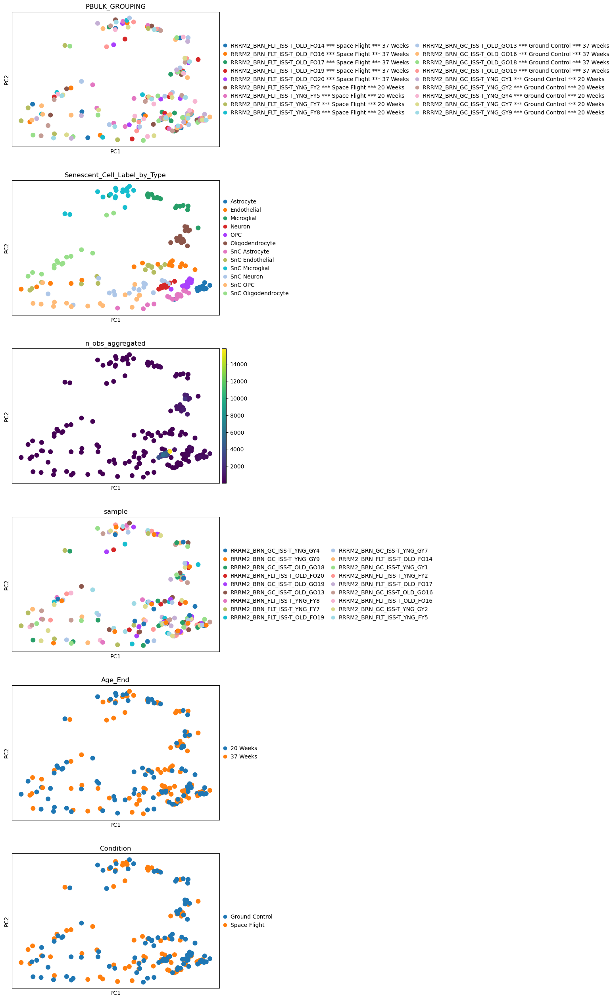

In [65]:
pdata = scflow.tl.create_pseudobulk(
    self.rna, [i for i in [col_sample, col_condition, col_age] if i],
    "Senescent_Cell_Label_by_Type", layer="counts", mode="sum")
pdata.layers["counts"] = pdata.X.copy()
sc.pp.normalize_total(pdata, target_sum=1e6)
sc.pp.log1p(pdata)
sc.pp.pca(pdata)
sc.pl.pca(pdata, color=pdata.obs, ncols=1, size=300)

### Overall DEGs by Groups

#### Age

**In older spaceflight mice compared to younger spaceflight mice**
* 9630013a20Rik (CNS myelination and neural tissue regeneration) is downregulated.
* mt-Td is upregulated.

In [ ]:
%matplotlib inline

# Overall
print(f"\n\n{'=' * 80}\nOverall Sample\n{'=' * 80}\n\n")
out_edgr_age = scflow.ax.run_deg_edgr(
    self.rna, col_age, col_covariate=None, formula=None,
    **keys[col_age], log2fc_thresh=0, n_top_vars=25,
    col_celltype=col_celltype, col_sample=col_sample,
    fig_title="Age DEGs: Overall Sample\n\n")

# Ground Control Subset
print(f"\n\n{'=' * 80}\nGround Control Subset\n{'=' * 80}\n\n")
out_edgr_age_gc = scflow.ax.run_deg_edgr(
    self.rna[self.rna.obs[col_condition] == keys[
        col_condition]["key_control"]],
    col_age, col_covariate=None, formula=None,
    **keys[col_age], log2fc_thresh=0, n_top_vars=25,
    col_celltype=col_celltype, col_sample=col_sample,
    fig_title="Age DEGs: Just Ground Control\n\n")

# Space Flight Subset
print(f"\n\n{'=' * 80}\nSpace Flight Subset\n{'=' * 80}\n\n")
out_edgr_age_sf = scflow.ax.run_deg_edgr(
    self.rna[self.rna.obs[col_condition] == keys[
        col_condition]["key_treatment"]],
    col_age, col_covariate=None, formula=None, **keys[col_age],
    log2fc_thresh=0, n_top_vars=25, col_celltype=col_celltype,
    col_sample=col_sample, fig_title="Age DEGs: Just Space Flight\n\n")

#### Condition

```
out_edgr_con_o[0][(out_edgr_con_o[0].adj_p_value < 0.01) & (
    out_edgr_con_o[0].abs_log_fc > 0.5)].sort_values(
        "abs_log_fc", ascending=False)
```

Among the older mice, *Mir6236* was differentially highly expressed in aged spaceflight mice compared to ground control mice (LFC=1.95, adjusted p=2.61e-13 in the overall sample; LFC=2.11, adjusted p=0.000015 in the aged subset). Suppression of this gene has been linked to neuronal morphogenesis (https://pubs.acs.org/doi/abs/10.1021/acsabm.0c01389) and therefore may represent a candidate intervention target. 

*Il31ra*, which has been linked to neuroinflammation (https://advanced.onlinelibrary.wiley.com/doi/pdfdirect/10.1002/advs.202409086), was also more highly expressed in spaceflight mice compared to ground control mice (LFC=1.52, adjusted p<0.001 in the overall sample; LFC=1.53, adjusted p<0.001 in the aged subset).

*UBA52*, also more highly expressed in spaceflight mice (LFC=1.43, adjusted p<0.001 in the overall sample; LFC=1.45, adjusted p<0.001 in the aged subset), may serve a neuroprotective role: It has been shown underexpressed in PD (https://www.mdpi.com/2073-4409/11/23/3770) and plays a role in neuroautophagy (https://www.tandfonline.com/doi/pdf/10.1080/15548627.2024.2395727). Likewise, *Pomp*, a gene associated with oxidative stress resistance and protein clearance [CITATION] was also more highly expressed in spaceflight mice. In contrast to past observations of downregulation of *Uqcr11* in Alheimer's (https://www.benthamdirect.com/content/journals/car/10.2174/1567205014666170505095921), that gene was differentially highly expressed in spaceflight mice (LFC=1.23 aged subset; LFC=1.44 overall; p<0.001); however, *Cmss1*, which has been associated with Alzheimer's in APOE4 mice (https://pmc.ncbi.nlm.nih.gov/articles/PMC8064208/), was also more highly expressed in spaceflight mice.

Genes involved in oxidative phosphorylation and the electron transport chain, including *Atp5e*, *Ndufa12*, and *Uqcr11* were also more highly expressed in spaceflight mice. *Uqcr11* has shown an anti-apoptotic and oxidative stress alleviation role in mice (https://www.mdpi.com/2073-4425/16/5/526).

*Tpt1* and *Rn7sk* were also upregulated in spaceflight mice. *Tpt1*, which is associated with cancer progression, anti-apoptosis, and cell stress response, has been shown to have a potentially bi-directional relationship with cell cycle control gene and canonical senescence marker *TP53* (https://www.tandfonline.com/doi/pdf/10.4161/cc.25404). *Rn7sk* is associated with cellular senescence (https://onlinelibrary.wiley.com/doi/abs/10.1002/jcp.28119) and Alzheimer's (https://www.nature.com/articles/s41598-024-82490-9.pdf).

---

*Pvalb* overall sample (LFC=1.61, p=1.25e-11)

*Trim17*

*Cck*

*Pam16*

---

*Mitochondrial/electron transport chain genes whose upregulation has been linked to Parkinson's disease (https://pmc.ncbi.nlm.nih.gov/articles/PMC10259399/pdf/AMS-19-3-131629.pdf) and/or adaptive responses to neurodegeneration in Alheimer's mouse models (https://journals.sagepub.com/doi/abs/10.1177/13872877251314847), including *mt-Atp6*, *mt-Co1*, *mt-Cytb* *mt-Nd2*, and *mt-Nd5*, *mt-Nd6...pregulation of *mt-Rnr1*, which also showed higher expression in spaceflight aged mice, has been seen in response to ionizing radiation, possibly reflecting increased mitochonrial biogenesis as an adaptive stress response (https://pmc.ncbi.nlm.nih.gov/articles/PMC5555881)** 

In [ ]:
# Overall
print(f"\n\n{'=' * 80}\nOverall Sample\n{'=' * 80}\n\n")
out_edgr_con = scflow.ax.run_deg_edgr(
    self.rna, col_condition, col_covariate=None, formula=None,
    **keys[col_condition], log2fc_thresh=0, n_top_vars=25,
    col_celltype=col_celltype, col_sample=col_sample,
    fig_title=f"{col_condition} DEGs (Overall Sample)\n\n")
out_edgr_con_df = out_edgr_con[0][out_edgr_con[
    0].adj_p_value < 0.001].sort_values("abs_log_fc", ascending=False)
goe = out_edgr_con_df.variable[:10].to_list()
print(out_edgr_con_df.iloc[:min(100, out_edgr_con_df.shape[0])], "\n\n", goe)
plt.show()

# Just Old
print(f"\n\n{'=' * 80}\nAged Subset\n{'=' * 80}\n\n")
out_edgr_con_o = scflow.ax.run_deg_edgr(
    self.rna[self.rna.obs[col_age] == keys[col_age]["key_treatment"]],
    col_condition, col_covariate=None, formula=None,
    **keys[col_condition], log2fc_thresh=0, n_top_vars=25,
    col_celltype=col_celltype, col_sample=col_sample,
    fig_title=f"{col_condition} DEGs (Just Aged)\n\n")
plt.show()
out_edgr_con_o_df = out_edgr_con_o[0][out_edgr_con_o[
    0].adj_p_value < 0.001].sort_values("abs_log_fc", ascending=False)
goes = out_edgr_con_o_df.variable[:10].to_list()
print(out_edgr_con_o_df, "\n\n", goes)
_ = self.plot(
    kind=["violin", "matrix"], col_celltype=col_batch, layer="log1p",
    violin=dict(col_wrap=5, hspace=0.25, rotation=45, figsize=(20, 20)),
    matrix=dict(standard_scale="var"), genes=goes)
out_edgr_old_sf_v_gc = out_edgr_con_o_df[0][(
    out_edgr_con_o_df[0].abs_log_fc > 1) & (
        out_edgr_con_o_df[0].adj_p_value < 0.001)].sort_values(
            "adj_p_value", ascending=True)
out_edgr_old_sf_v_gc = out_edgr_old_sf_v_gc.groupby("contrast").apply(
    lambda x: x.sort_values("adj_p_value", ascending=True).iloc[
        :20]).set_index("variable", append=True).reset_index(
            1, drop=True).rename_axis([col_condition, "variable"])
out_edgr_con_compare = out_edgr_con_o_df.set_index("variable")[[
    "log_fc", "adj_p_value"]].join(out_edgr_con_df.set_index("variable")[[
        "log_fc", "adj_p_value"]], how="inner", lsuffix="_Aged_Subset",
                                   rsuffix="_Overall_Sample")
out_edgr_con_compare

#### Age x Condition

Spaceflight effect (main analysis), can visualize at different ages

*Chchd2* (related to oxidative phosphorylation, cell migration, apoptosis inhibition, COX regulation, stress adaptation, Parkinson's, Lewy Body diseases, and cancer) was more highly expressed in spaceflight mice (and demonstrated a bigger young versus old difference in spaceflight mice).
Spaceflight mice also showed higher expression of several ribosomal proteins (*Rps16*, *Rpl31*, *Rpl17*, *Rpl9*, *Rpl15*, *Rps15a*, *Rpl19*, *Rps7*, *Rps23*, *Rpl37*, *Rps3a1*, *Rpl29*, *Rps15*, *Rps14*).

*Ndufa4* was also more highly expressed (implicated in cancer and mitochondrial dysfunction, part of the cytochrome c oxidase complex which drives oxidative phosphorylation, adaptation to hypoxia via downregulation of oxygen consumption and suppression of mitochondrial ROS production https://www.cell.com/cell-metabolism/fulltext/S1550-4131(11)00394-9?mobileUi=0) in spaceflight mice, as were other genes involved in ATP production/the electron transport chain and oxidative phosophorylation, including *Cox7a2*, *Uqcr11*, *Ndufa12*, *Ndufa4*, *Ndufc1*, *Atp5o-1*, *Atp5e*, and *Uqcrh* (which additionally has been implicated in tumor suppression https://aacrjournals.org/cancerres/article/80/16_Supplement/4795/643367).


In [ ]:
# With Single Label for Age x Condition
print(f"\n\n{'=' * 80}\nGroup (Single Factor)\n{'=' * 80}\n\n")
out_edgr_groups = scflow.ax.run_deg_edgr(
    self.rna, col_batch, col_covariate=None, formula=None,
    **keys[col_batch], col_sample=col_sample,
    log2fc_thresh=0, n_top_vars=25, col_celltype=col_celltype)
print(list(out_edgr_groups[0].variable[:25]))
plt.show()
# _ = self.plot(kind="violin", col_celltype=col_batch,
#               genes=list(out_edgr_groups[0].variable[:25]), layer="scaled",
#               violin=dict(col_wrap=4, hspace=1, rotation=45))
out_edgr_batches = out_edgr_groups[0][(out_edgr_groups[0].abs_log_fc > 1) & (
    out_edgr_groups[0].adj_p_value < 0.001)].sort_values(
        "adj_p_value", ascending=True)
out_edgr_batches_top = out_edgr_batches.groupby("contrast").apply(
    lambda x: x.sort_values("adj_p_value", ascending=True).iloc[
        :20]).set_index("variable", append=True).reset_index(
            1, drop=True).rename_axis([col_condition, "variable"])

# With Contrasts (Age & Condition = Separate Factors)
print(f"\n\n{'=' * 80}\nAge * Condition (2-Factor Contrast)\n{'=' * 80}\n\n")
out_edgr_contrasts = scflow.ax.run_deg_edgr(
    self.rna, col_condition, col_covariate=col_age, formula=None,
    **keys[col_condition], log2fc_thresh=0, n_top_vars=24,
    col_celltype=col_celltype, col_sample=col_sample)
_ = self.plot(
    kind=["violin", "matrix"], col_celltype=col_batch,
    genes=out_edgr_contrasts[0][out_edgr_contrasts[
        0].adj_p_value < 0.001].sort_values(
            "abs_log_fc", ascending=False).variable[:10], layer="log1p",
    violin=dict(col_wrap=5, hspace=0.25, rotation=45, figsize=(20, 20)),
    matrix=dict(standard_scale="var"))

# Condition x Age
# Vulnerability of mice who were older at launch to spaceflight stress
out_edgr_contrasts_age = scflow.ax.run_deg_edgr(
    self.rna, col_age, col_covariate=col_condition, formula=None,
    **keys[col_age], log2fc_thresh=0, n_top_vars=24,
    col_celltype=col_celltype, col_sample=col_sample)

#### Senescence Gene Contrasts Results

In [ ]:
# Genes
sen_genes_in_contrasts = list(set(genes).intersection(
    out_edgr_contrasts[0].variable.unique()))  # senescence genes in contrasts
out_edgr_snc = out_edgr_contrasts[0].set_index(
    "variable").loc[sen_genes_in_contrasts]  # contrast results for snc genes
res_snc_contrast = out_edgr_snc[out_edgr_snc.adj_p_value < 0.01]  # p < 0.01
sig_contrast_genes = list(res_snc_contrast.index.values)  # significant genes

# Plots By Groups; Axis by Cell Types
kws = dict(dot=dict(figsize=(10, 5)), heat=dict(figsize=(15, 15)))
_ = self.plot(kind=["matrix", "dot"], genes=sig_contrast_genes,
              standard_scale="obs", col_celltype=col_celltype,
              by_group=col_batch, **kws)

# Plots By Cell Types; Axis by Groups
# kws = dict(dot=dict(figsize=(10, 5)), heat=dict(figsize=(15, 15)),
#            violin=dict(figsize=(30, 20), col_wrap=4, xlabel=None,
#                        rotation=45, hspace=1, top=0.95))
kws = dict(dot=dict(figsize=(10, 5)), heat=dict(figsize=(15, 15)))
_ = self.plot(kind=["matrix", "dot"], genes=sig_contrast_genes,
              standard_scale="obs", col_celltype=col_batch,
              by_group=col_celltype, **kws)

# Results
print(f"\n{'=' * 80}\nSignificant Senescence Gene Contrasts\n{'=' * 80}\n")
print(sig_contrast_genes)
res_snc_contrast

### Snc versus Not (Group=Covariate)

In [ ]:
# Group = Covariate
out_edgr_contrasts_snc = scflow.ax.run_deg_edgr(
    self.rna, "Senescent_Cell_Label",
    # col_covariate=col_batch,
    col_covariate=col_condition,
    formula=None,
    key_treatment="Senescent", key_control="Non-Senescent",
    log2fc_thresh=0, n_top_vars=24, xlabel_rotation=45,
    hspace=0.5, wspace=0.2, top=0.92, legend_loc="upper right",
    col_celltype=col_celltype, col_sample=col_sample)

### SnC versus Not SnC (Group=Subset)

In [ ]:
# Aged Subset
subset_old = self.rna.obs[col_age] == keys[col_age]["key_treatment"]

# Old Ground Control SnCs
print(f"\n\n{'=' * 80}\nGround Control (Aged)\n{'=' * 80}\n\n")
subset_gc = self.rna.obs[col_condition] == keys[
    col_condition]["key_control"]
out_edgr_contrasts_snc_gc = scflow.ax.run_deg_edgr(
    self.rna[subset_gc & subset_old], "Senescent_Cell_Label",
    key_treatment="Senescent", top=0.92,
    key_control="Non-Senescent", log2fc_thresh=0, n_top_vars=24,
    xlabel_rotation=45, hspace=0.5, wspace=0.2, legend_loc="upper right",
    col_celltype=col_celltype, col_sample=col_sample)
if len(self.rna[subset_gc & subset_old].obs[col_batch].unique()) > 1:
    raise ValueError("Check subsetting")
key_1 = self.rna[subset_gc & subset_old].obs[col_batch].unique()[0]

# Old Spaceflight SnCs
print(f"\n\n{'=' * 80}\nSpaceflight (Aged)\n{'=' * 80}\n\n")
subset_sf = self.rna.obs[col_condition] == keys[
    col_condition]["key_treatment"]
out_edgr_contrasts_snc_sf = scflow.ax.run_deg_edgr(
    self.rna[subset_sf & subset_old], "Senescent_Cell_Label",
    key_treatment="Senescent", key_control="Non-Senescent",
    log2fc_thresh=0, n_top_vars=24, xlabel_rotation=45,
    hspace=0.5, wspace=0.2, top=0.92, legend_loc="upper right",
    col_celltype=col_celltype, col_sample=col_sample)
if len(self.rna[subset_sf & subset_old].obs[col_batch].unique()) > 1:
    raise ValueError("Check subsetting")
key_2 = self.rna[subset_sf & subset_old].obs[col_batch].unique()[0]

# Compare
res_snc_gc = out_edgr_contrasts_snc_gc[0][out_edgr_contrasts_snc_gc[
    0].adj_p_value < 0.001].sort_values("adj_p_value").set_index("variable")
res_snc_sf = out_edgr_contrasts_snc_sf[0][out_edgr_contrasts_snc_sf[
    0].adj_p_value < 0.001].sort_values("adj_p_value").set_index("variable")
res_snc_grps = pd.concat([
    res_snc_gc, res_snc_sf], keys=[key_1, key_2], names=[col_condition])
res_snc_grps = res_snc_grps[res_snc_grps.abs_log_fc >= 1]
# top_tx_g_snc = res_snc_grps.loc[keys[col_condition][
#     "key_treatment"]].sort_values("abs_log_fc", ascending=False).index
# print(res_snc_grps.unstack(0).replace(np.nan, "")[[
#     "log_fc", "adj_p_value"]].loc[top_tx_g_snc])
# just_sf = res_snc_grps.loc[keys[col_condition][
#     "key_treatment"]].index.difference(res_snc_grps.loc[keys[
#         col_condition]["key_control"]].index)
# just_gc = res_snc_grps.loc[keys[col_condition][
#     "key_control"]].index.difference(res_snc_grps.loc[keys[
#         col_condition]["key_treatment"]].index)
# print(res_snc_grps.loc[:, just_gc, :].sort_values(
#     "abs_log_fc", ascending=False)[["log_fc", "adj_p_value"]], "\n\n")
# res_snc_grps.loc[:, just_sf, :].sort_values(
#     "abs_log_fc", ascending=False)[["log_fc", "adj_p_value"]]
res_snc_grps.unstack(0).replace(np.nan, "")[["log_fc", "adj_p_value"]]

### Group DEGs (SnC=Covariate)

In [ ]:
out_edgr_contrasts_snc_cov = {}
for a in self.rna.obs[col_age].unique():
    print(f"\n\n{'=' * 80}\nAge = {a}\n{'=' * 80}\n\n")
    out_edgr_contrasts_snc_cov[a] = scflow.ax.run_deg_edgr(
        self.rna[self.rna.obs[col_age] == a], col_condition,
        col_covariate="Senescent_Cell_Label",
        **keys[col_condition], log2fc_thresh=0, n_top_vars=24,
        xlabel_rotation=45, hspace=0.5, wspace=0.2, top=0.85,
        legend_loc="upper right", col_celltype=col_celltype,
        col_sample=col_sample)
    plt.show()

### Group DEGs (SnC=Subset)

##### All Groups SnCs

In [ ]:
out_edgr_groups_snc = scflow.ax.run_deg_edgr(
    self.rna[(self.rna.obs["Senescent_Cell_Label"] == "Senescent")],
    col_batch, **keys[col_batch], col_sample=col_sample,
    log2fc_thresh=0, n_top_vars=25, col_celltype=col_celltype)
print(list(out_edgr_groups_snc[0].variable[:25]))
out_edgr_batches_snc = out_edgr_groups_snc[0][(
    out_edgr_groups_snc[0].abs_log_fc > 1) & (
        out_edgr_groups_snc[0].adj_p_value < 0.001)].sort_values(
            "adj_p_value", ascending=True)
# out_edgr_batches_snc_top = out_edgr_batches_snc.groupby("contrast").apply(
#     lambda x: x.sort_values("adj_p_value", ascending=True).iloc[
#         :20]).set_index("variable", append=True).reset_index(
#             1, drop=True).rename_axis([col_condition, "variable"])
plt.show()

##### Just Condition

>>>Pseudo-bulking data with grouping columns ['sample', 'Condition'] and cell type column annotation_scanvi_collapsed (`mode='sum'`)
	***Creating combined group column with ['sample', 'Condition']
AAACCAACAGCAGGTA-1_RRRM2_BRN_GC_ISS-T_YNG_GY4    RRRM2_BRN_GC_ISS-T_YNG_GY4 *** Ground Control
AAAGGACGTGCTAGAC-1_RRRM2_BRN_GC_ISS-T_YNG_GY4    RRRM2_BRN_GC_ISS-T_YNG_GY4 *** Ground Control
AACCGCTCACAAAGAC-1_RRRM2_BRN_GC_ISS-T_YNG_GY4    RRRM2_BRN_GC_ISS-T_YNG_GY4 *** Ground Control
AACCTCCTCTAACTGA-1_RRRM2_BRN_GC_ISS-T_YNG_GY4    RRRM2_BRN_GC_ISS-T_YNG_GY4 *** Ground Control
AAGCAAGTCTCCTCAA-1_RRRM2_BRN_GC_ISS-T_YNG_GY4    RRRM2_BRN_GC_ISS-T_YNG_GY4 *** Ground Control
Name: PBULK_GROUPING, dtype: object
	***Using `pertpy` pseudo-bulking on layer counts...
	***Total count-normalizing pseudobulk data (`target_sum=10000.0`)...
	***Log-transforming pseudo-bulked data...
	***Scaling pseudo-bulked data (`max_value=10`, `zero_center=True`)...
	***Performing PCA on pseudo-bulked data...
	***Swappin

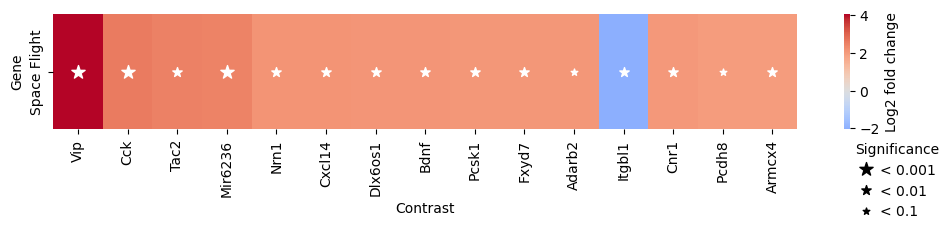

In [66]:
out_edgr_sf_snc = scflow.ax.run_deg_edgr(
    self.rna[(self.rna.obs["Senescent_Cell_Label"] == "Senescent")],
    col_condition, **keys[col_condition], col_sample=col_sample,
    log2fc_thresh=0, n_top_vars=25, col_celltype=col_celltype)
print(list(out_edgr_sf_snc[0].variable[:25]))
out_edgr_batches_snc = out_edgr_sf_snc[0][(
    out_edgr_sf_snc[0].abs_log_fc > 1) & (
        out_edgr_sf_snc[0].adj_p_value < 0.001)].sort_values(
            "adj_p_value", ascending=True)
# out_edgr_batches_snc_top = out_edgr_batches_snc.groupby("contrast").apply(
#     lambda x: x.sort_values("adj_p_value", ascending=True).iloc[
#         :20]).set_index("variable", append=True).reset_index(
#             1, drop=True).rename_axis([col_condition, "variable"])
plt.show()

##### Just Aged SnCs

In [ ]:
out_edgr_contrasts_sncto, snc_degs_by_condition_age_ct = {}, {}
thresh_p_c, thresh_lfcabs_c = 0.05, 0.5  # thresholds
subs_old = self.rna.obs[col_age] == keys[col_age]["key_treatment"]
subs_sf = self.rna.obs[col_condition] == keys[col_condition]["key_treatment"]
# subs_ac = (self.rna.obs["Senescent_Cell_Label"] == "Senescent") & (
#     subs_old | subs_sf)
subs_ac = (self.rna.obs["Senescent_Cell_Label"] == "Senescent") & (subs_old)
out_edgr_contrasts_sncto["Overall"] = scflow.ax.run_deg_edgr(
        self.rna[subs_ac], col_condition,
        # col_covariate=col_age,
        **keys[col_condition],
        log2fc_thresh=0, n_top_vars=24,
        legend_loc="upper center", fig_title=f"Overall",
        wspace=0.25, bottom=0.3, hspace=1 if len(x) > 10 else 0.4, top=0.95,
        kws_xticks=dict(fontsize=10, rotation=45 if len(x) > 10 else None),
        col_celltype=col_celltype, col_sample=col_sample)
plt.show()
tmp = out_edgr_contrasts_sncto["Overall"][0]
tmp = tmp[(tmp.adj_p_value < thresh_p_c) & (
    tmp.abs_log_fc >= thresh_lfcabs_c)]  # filter by p & lfc
snc_degs_by_condition_age_ct["Overall"] = list(
    tmp.sort_values("adj_p_value", ascending=True).variable)
for x in self.rna.obs[col_celltype].unique():
    print(x)
    out_edgr_contrasts_sncto[x] = scflow.ax.run_deg_edgr(
        self.rna[(subs_ac) & (self.rna.obs[col_celltype] == x)],
        col_condition,
        # col_covariate=col_age,
        **keys[col_condition],
        log2fc_thresh=0, n_top_vars=24,
        legend_loc="upper center", fig_title=f"Senescent {x}",
        wspace=0.25, bottom=0.3, hspace=1 if len(x) > 10 else 0.4, top=0.95,
        kws_xticks=dict(fontsize=10, rotation=45 if len(x) > 10 else None),
        col_celltype=col_celltype, col_sample=col_sample)
    plt.show()
    tmp = out_edgr_contrasts_sncto[x][0]
    tmp = tmp[(tmp.adj_p_value < thresh_p_c) & (
        tmp.abs_log_fc >= thresh_lfcabs_c)]  # filter by p & lfc
    snc_degs_by_condition_age_ct[x] = list(tmp.sort_values(
            "adj_p_value", ascending=True).variable)
    del tmp
out_edgr_contrasts_snc_all_top = pd.concat([out_edgr_contrasts_sncto[x][
    0].set_index("variable").loc[snc_degs_by_condition_age_ct[
        x]] for x in out_edgr_contrasts_sncto], keys=out_edgr_contrasts_sncto,
                                           names=[col_celltype])
out_edgr_contrasts_snc_all = pd.concat([
    out_edgr_contrasts_sncto[x][0].set_index("variable")
    for x in out_edgr_contrasts_sncto], keys=out_edgr_contrasts_sncto,
                                       names=[col_celltype])
out_edgr_contrasts_snc_all_top

### More Specific Contrasts (`pyDESeq2`)

#### Group

In [ ]:
# pdata =  scflow.tl.create_pseudobulk(
#     self.rna, [col_sample, col_condition, col_age],
#     col_celltype, layer="counts", mode="sum")
# design = f"~{col_condition} + {col_age} + {col_condition} * {col_age}"
# # edgr = pt.tl.EdgeR(pdata, design=design)
# pds2 = pt.tl.PyDESeq2(adata=pdata, design=design)
# pds2.fit()
# key_control, key_treatment = [keys[col_condition][k] for k in [
#     "key_control", "key_treatment"]]
# key_control_cov, key_treatment_cov = [keys[col_age][k] for k in [
#     "key_control", "key_treatment"]]
# sf_old = {col_condition: key_treatment, col_age: key_treatment_cov}
# sf_yng = {col_condition: key_treatment, col_age: key_control_cov}
# gc_old = {col_condition: key_control, col_age: key_treatment_cov}
# gc_yng = {col_condition: key_control, col_age: key_control_cov}

# # Spaceflight-Specific Age DEGs
# spaceflight_specfic_age_degs = (pds2.cond(**sf_old) - pds2.cond(
#     **sf_yng)) - (pds2.cond(**gc_old) - pds2.cond(**gc_yng))
# interaction_res_df = pds2.test_contrasts(spaceflight_specfic_age_degs)
# pds2.plot_volcano(interaction_res_df, log2fc_thresh=0)

# # Age-Specific Spaceflight DEGs
# age_specfic_sf_degs = (pds2.cond(**sf_old) - pds2.cond(**gc_old)) - (
#     pds2.cond(**sf_yng) - pds2.cond(**gc_yng))
# interaction_res_df2 = pds2.test_contrasts(age_specfic_sf_degs)
# pds2.plot_volcano(interaction_res_df2, log2fc_thresh=0)

# # Old vs. Young Spaceflight
# age_sf_ix = pds2.cond(**sf_old) - pds2.cond(**sf_yng)
# interaction_res_df3 = pds2.test_contrasts(age_sf_ix)
# pds2.plot_volcano(interaction_res_df3, log2fc_thresh=0)

# # Old vs. Young GC
# age_gc_ix = pds2.cond(**gc_old) - pds2.cond(**gc_yng)
# interaction_res_df4 = pds2.test_contrasts(age_gc_ix)
# pds2.plot_volcano(interaction_res_df4, log2fc_thresh=0)

# # SF vs. GC Old
# cond_old_ix = pds2.cond(**sf_old) - pds2.cond(**gc_old)
# interaction_res_df5 = pds2.test_contrasts(cond_old_ix)
# pds2.plot_volcano(interaction_res_df5, log2fc_thresh=0)

# # SF vs. GC Young
# cond_yng_ix = pds2.cond(**sf_yng) - pds2.cond(**gc_yng)
# interaction_res_df6 = pds2.test_contrasts(cond_yng_ix)
# pds2.plot_volcano(interaction_res_df6, log2fc_thresh=0)

# # Compare
# thresh_lfc, thresh_p = 1, 0.001
# sf_deg_res_df_old = interaction_res_df5[(
#     interaction_res_df5.adj_p_value < thresh_p) & (
#         interaction_res_df5.log_fc.abs() >= thresh_lfc)].set_index(
#             "variable")
# sf_deg_res_df_yng = interaction_res_df6[(
#     interaction_res_df6.adj_p_value < thresh_p) & (
#         interaction_res_df6.log_fc.abs() >= thresh_lfc)].set_index(
#             "variable")
# sf_deg_res = pd.concat([sf_deg_res_df_old, sf_deg_res_df_yng],
#                        keys=["Old", "Young"], names=["Age Group"])
# sf_deg_res.loc[:, "log_fc_abs"] = sf_deg_res.log_fc.abs()
# sf_deg_res = sf_deg_res.sort_values("log_fc_abs", ascending=False)[[
#     "log_fc", "adj_p_value"]].unstack(0)
# print("SF DEGs in Both Young & Old: ", sf_deg_res.dropna().index.values)
# print("\n\nSF DEGs in Just Young", list(sf_deg_res_df_yng.index.difference(
#     sf_deg_res_df_old.index)), "\n\n")
# print("SF DEGs in Just Old", list(sf_deg_res_df_old.index.difference(
#     sf_deg_res_df_yng.index)), "\n\n")
# sf_deg_res.replace(np.nan, "")

# # Marker Set Overlap
# print("Both: ", marker_gene_sets.apply(
#     lambda i: set(sf_deg_res.dropna().index).intersection(set(i))).apply(
#         lambda x: x if len(x) > 0 else np.nan).dropna(), "\n\n")
# print("Young: ", marker_gene_sets.apply(
#     lambda i: sf_deg_res_df_yng.index.difference(
#         sf_deg_res_df_old.index).intersection(set(i))).apply(
#         lambda x: x if len(x) > 0 else np.nan).dropna(), "\n\n")
# print("Old: ", marker_gene_sets.apply(
#     lambda i: sf_deg_res_df_old.index.difference(
#         sf_deg_res_df_yng.index).intersection(set(i))).apply(
#         lambda x: x if len(x) > 0 else np.nan).dropna(), "\n\n")

#### SnCs

##### Old

In [ ]:
# Setup
design = (f"~{col_condition} + Senescent_Cell_Label + "
          f"{col_condition} * Senescent_Cell_Label")
pdata2 =  scflow.tl.create_pseudobulk(
    self.rna[self.rna.obs[col_age] == keys[col_age]["key_treatment"]], [
        col_sample, col_condition, "Senescent_Cell_Label"],
    "Senescent_Cell_Label_by_Type", layer="counts", mode="sum")
pds2_snc_old = pt.tl.PyDESeq2(adata=pdata2, design=design)
pds2_snc_old.fit()
key_control, key_treatment = [keys[col_condition][k] for k in [
    "key_control", "key_treatment"]]
key_control_cov, key_treatment_cov = "Non-Senescent", "Senescent"
sf_sc = {col_condition: key_treatment,
         "Senescent_Cell_Label": key_treatment_cov}
sf_ns = {col_condition: key_treatment,
         "Senescent_Cell_Label": key_control_cov}
gc_snc = {col_condition: key_control,
          "Senescent_Cell_Label": key_treatment_cov}
gc_ns = {col_condition: key_control, "Senescent_Cell_Label": key_control_cov}

# SnC DEGs
res_df_snc = pds2_snc_old.test_contrasts(pds2_snc_old.contrast(
    column="Senescent_Cell_Label", baseline=key_control_cov,
    group_to_compare=key_treatment_cov))
print(res_df_snc[res_df_snc.adj_p_value < 0.001].head(10))
pds2_snc_old.plot_volcano(res_df_snc, log2fc_thresh=0)

# Spaceflight-Specific SnC DEGs
spaceflight_specfic_snc_degs = (pds2_snc_old.cond(
    **sf_sc) - pds2_snc_old.cond(**sf_ns)) - (
        pds2_snc_old.cond(**gc_snc) - pds2_snc_old.cond(**gc_ns))
interaction_res_df_snc_sf = pds2_snc_old.test_contrasts(
    spaceflight_specfic_snc_degs)
print(interaction_res_df_snc_sf[
    interaction_res_df_snc_sf.adj_p_value < 0.001].head(10))
pds2_snc_old.plot_volcano(interaction_res_df_snc_sf, log2fc_thresh=0)

##### Young

In [ ]:
# Setup
design = (f"~{col_condition} + Senescent_Cell_Label + "
          f"{col_condition} * Senescent_Cell_Label")
pdata2 =  scflow.tl.create_pseudobulk(
    self.rna[self.rna.obs[col_age] == keys[col_age]["key_treatment"]], [
        col_sample, col_condition, "Senescent_Cell_Label"],
    "Senescent_Cell_Label_by_Type", layer="counts", mode="sum")
pds2_snc_yng = pt.tl.PyDESeq2(adata=pdata2, design=design)
pds2_snc_yng.fit()
key_control, key_treatment = [keys[col_condition][k] for k in [
    "key_control", "key_treatment"]]
key_control_cov, key_treatment_cov = "Non-Senescent", "Senescent"
sf_sc = {col_condition: key_treatment,
         "Senescent_Cell_Label": key_treatment_cov}
sf_ns = {col_condition: key_treatment,
         "Senescent_Cell_Label": key_control_cov}
gc_snc = {col_condition: key_control,
          "Senescent_Cell_Label": key_treatment_cov}
gc_ns = {col_condition: key_control, "Senescent_Cell_Label": key_control_cov}

# SnC DEGs
res_df_snc = pds2_snc_yng.test_contrasts(pds2_snc_yng.contrast(
    column="Senescent_Cell_Label", baseline=key_control_cov,
    group_to_compare=key_treatment_cov))
print(res_df_snc[res_df_snc.adj_p_value < 0.001].head(10))
pds2_snc_yng.plot_volcano(res_df_snc, log2fc_thresh=0)

# Spaceflight-Specific SnC DEGs
spaceflight_specfic_snc_degs = (pds2_snc_yng.cond(
    **sf_sc) - pds2_snc_yng.cond(**sf_ns)) - (
        pds2_snc_yng.cond(**gc_snc) - pds2_snc_yng.cond(**gc_ns))
interaction_res_df_snc_sf = pds2_snc_yng.test_contrasts(
    spaceflight_specfic_snc_degs)
pds2_snc_yng.plot_volcano(interaction_res_df_snc_sf, log2fc_thresh=0)

#### SnCs (More Permissive Threshold)

In [ ]:
# Compare Less & More Permissive Thresholds
print("Less & More Permissive SnC Threshold: ", self.rna.obs[[
    "Senescent_Cell_Label", f"Senescent_Cell_Label_{use_metric}_{p_h}"
    ]].value_counts())
sen_lab = f"Senescent_Cell_Label_{use_metric}_{p_h}"

# Setup
design = (f"~{col_condition} + {sen_lab} + "
          f"{col_condition} * {sen_lab}")
pdata2_3 =  scflow.tl.create_pseudobulk(
    self.rna[self.rna.obs[col_age] == keys[col_age]["key_treatment"]], [
        col_sample, col_condition, sen_lab],
    col_celltype, layer="counts", mode="sum")
pds2_snc_old_3 = pt.tl.PyDESeq2(adata=pdata2_3, design=design)
pds2_snc_old_3.fit()
key_control, key_treatment = [keys[col_condition][k] for k in [
    "key_control", "key_treatment"]]
key_control_cov, key_treatment_cov = "Non-Senescent", "Senescent"
sf_sc = {col_condition: key_treatment, sen_lab: key_treatment_cov}
sf_ns = {col_condition: key_treatment, sen_lab: key_control_cov}
gc_snc = {col_condition: key_control, sen_lab: key_treatment_cov}
gc_ns = {col_condition: key_control, sen_lab: key_control_cov}

# SnC DEGs
res_df_snc_3 = pds2_snc_old_3.test_contrasts(pds2_snc_old_3.contrast(
    column=sen_lab, baseline=key_control_cov,
    group_to_compare=key_treatment_cov))
print(res_df_snc_3[res_df_snc_3.adj_p_value < 0.001].head(10))
pds2_snc_old_3.plot_volcano(res_df_snc_3, log2fc_thresh=0)

# Spaceflight-Specific SnC DEGs
spaceflight_specfic_snc_degs_3 = (pds2_snc_old_3.cond(
    **sf_sc) - pds2_snc_old_3.cond(**sf_ns)) - (
        pds2_snc_old_3.cond(**gc_snc) - pds2_snc_old_3.cond(**gc_ns))
interaction_res_df_snc_sf_3 = pds2_snc_old_3.test_contrasts(
    spaceflight_specfic_snc_degs_3)
pds2_snc_old_3.plot_volcano(interaction_res_df_snc_sf_3, log2fc_thresh=0)

# SnC GEX Profiles

## Pathway Analysis

In [67]:
names = gp.get_library_name()
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021", f"HDSigDB_{species}_2021",
              "MSigDB_Hallmark_2020",  # "DGIdb_Drug_Targets_2024",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              # "Reimport pdb;actome_Pathways_2024", "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
gene_sets = dict(zip(["up", "down"], [[
    f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
        f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
    for i in ["up", "down"]]))


def fx_replace_string(string):
    """Make short version of pathway terms."""
    string = re.sub("aging:([0-9]+)", "aging", re.sub(
        "([0-9]+) months v ([0-9]+) mo(nths)?", "\\1 v \\2 mo.", re.sub(
            "SRP[0-9]+ ", "", re.sub("GSE[0-9]+ ", "", string))))
    string = re.sub(".*.xlsx.", "", re.sub(
        ".*Supplementary Data ..", "", re.sub(
            "PMID([0-9])+", "", re.sub("([0-9]+) years v ([0-9]+) years",
                                       "\\1 v \\2 yrs.", string))))
    string = re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
        ".*.XLSX", "", re.sub(
            ".*Supplementary Table [0-9]+[-]?", "", string))))
    return string

### Endrichr

In [ ]:
out_pathway_snc_edgr_contrasts = scflow.ax.run_enrichr(
    out_edgr_contrasts_snc_all_top, col_grouping=["Comparison", col_celltype],
    gene_sets=gene_sets, fx_replace_string=fx_replace_string, title="Overall")

### SnC vs. Not

In [ ]:
# res_dc_ulm = scflow.ax.run_decoupler_ulm(
#         self.rna[self.rna.obs["Senescent_Cell_Label"] == "Senescent"],
#         # "Senescent_Cell_Label_by_Type",
#         # "Senescent_Cell_Label",
#         col_condition, col_condition="Senescent_Cell_Label_by_Type",
#         species=species, resource="hallmark",
#         top=0.95, hspace=1, wspace=0.5, figsize=(15, 10))

#### Pathway Set = Progeny

{'Ground Control': ['VEGF']}
{'Ground Control': ['Estrogen', 'Androgen'], 'Space Flight': ['VEGF', 'EGFR', 'PI3K']}
{'Ground Control': ['MAPK', 'Estrogen'], 'Space Flight': ['p53']}
{'Ground Control': ['Hypoxia', 'PI3K'], 'Space Flight': ['p53', 'EGFR']}


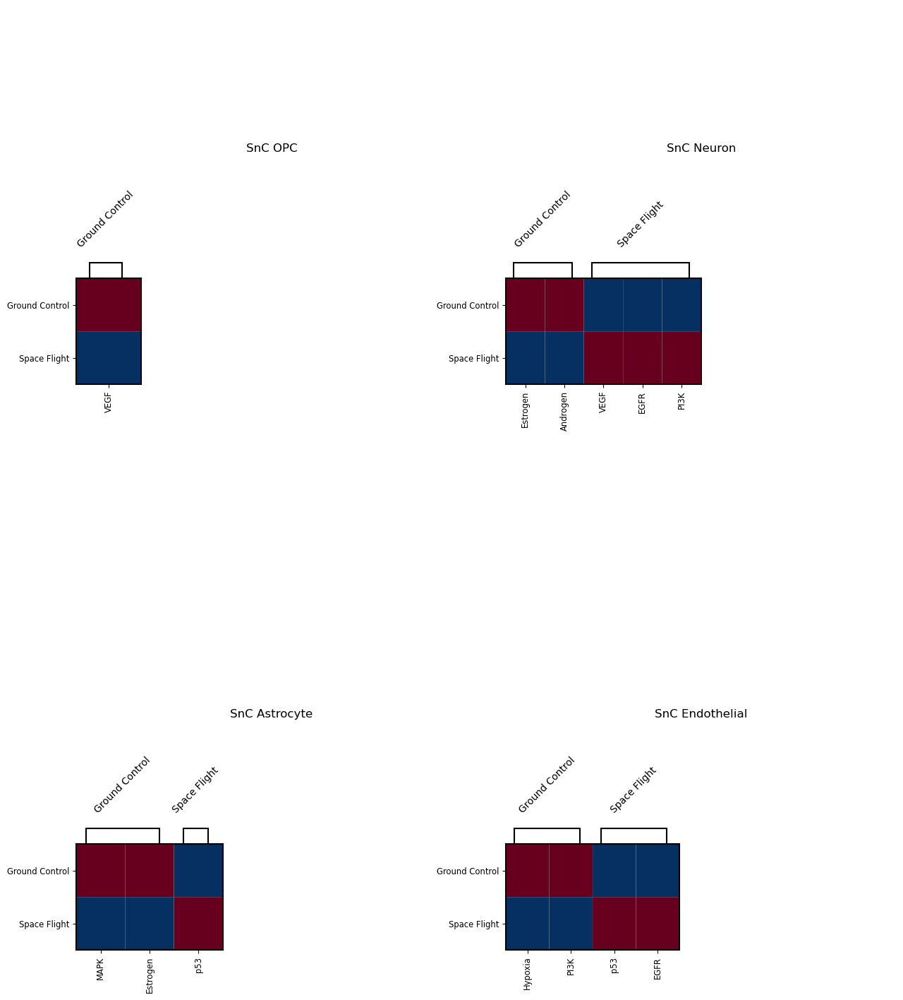

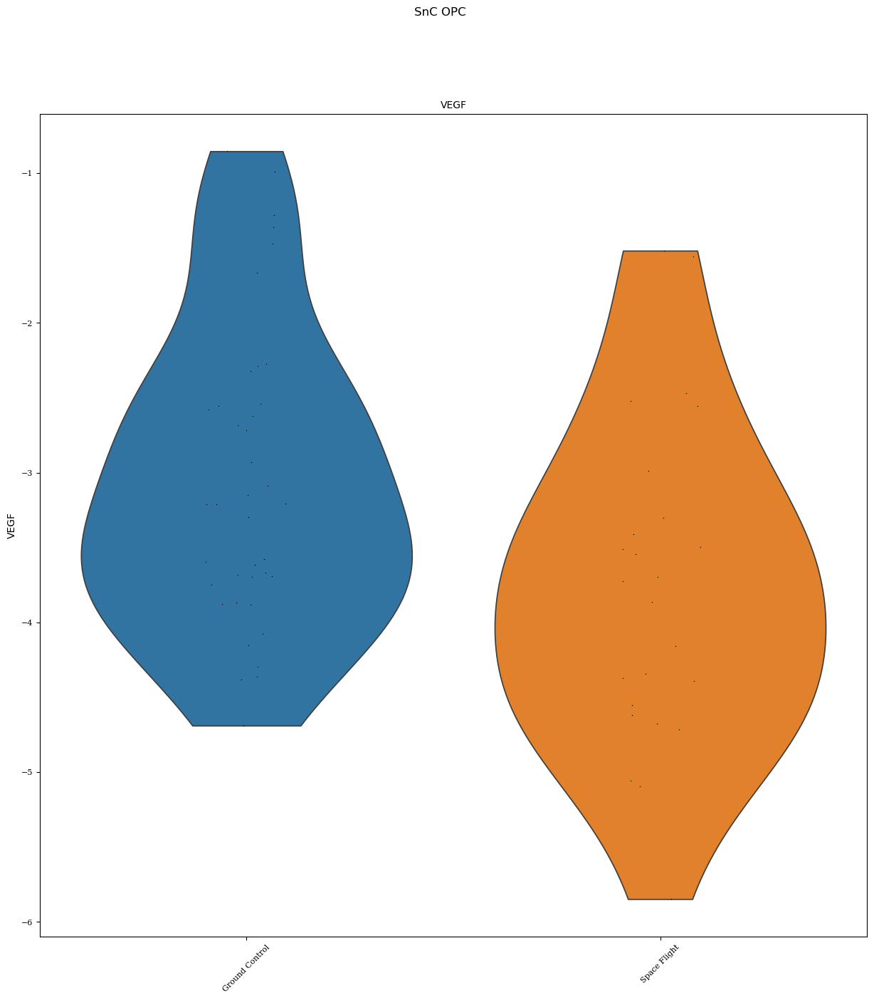

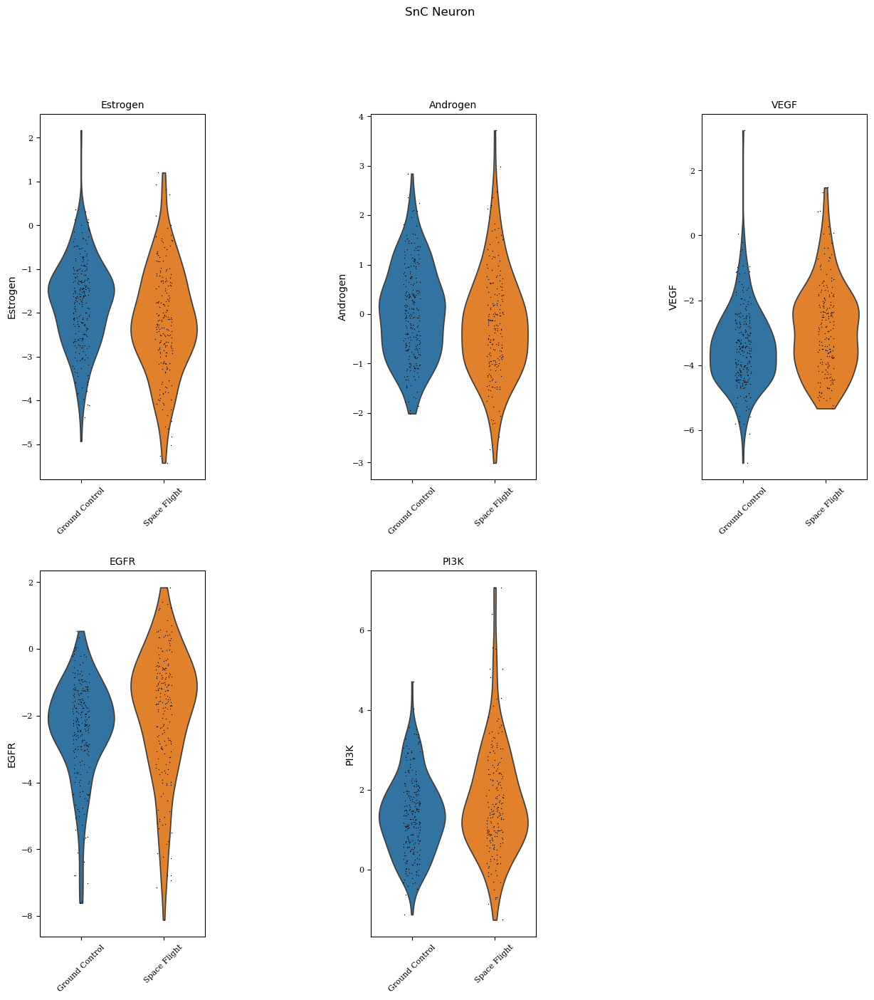

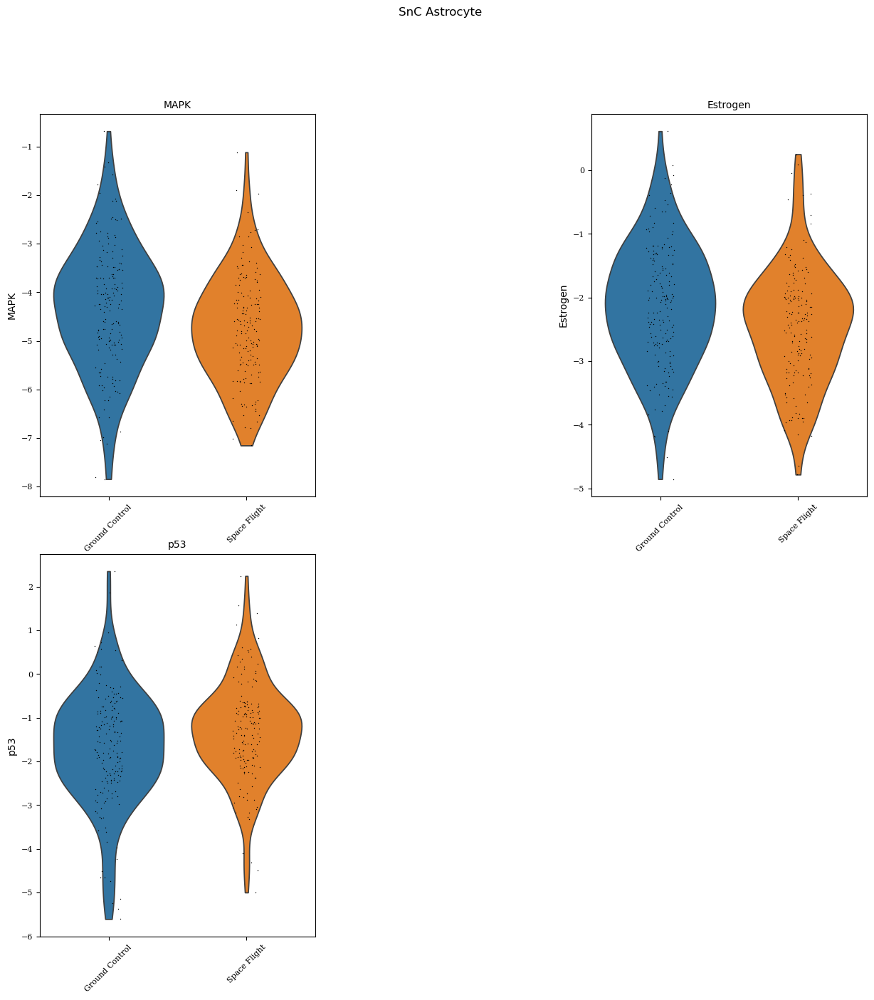



No significant contrasts for SnC Oligodendrocyte


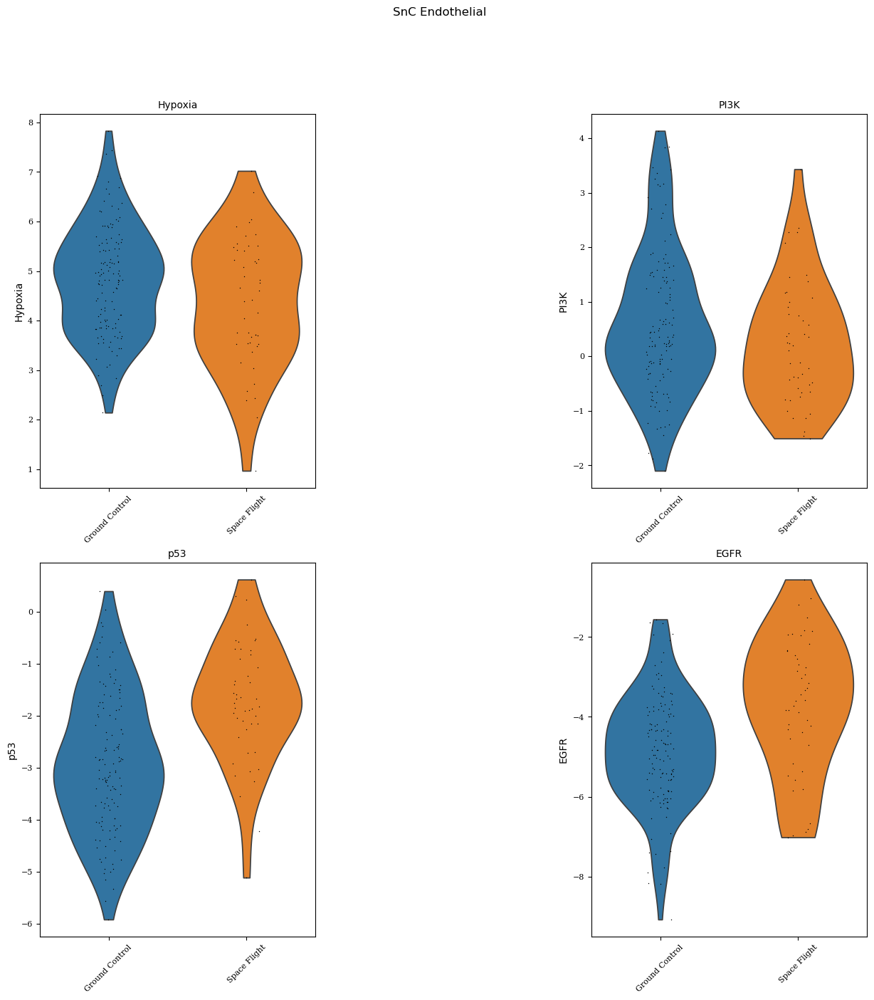



No significant contrasts for SnC Microglial
SnC OPC              Ground Control                  [VEGF]
                     Space Flight                        []
SnC Neuron           Ground Control    [Estrogen, Androgen]
                     Space Flight        [VEGF, EGFR, PI3K]
SnC Astrocyte        Ground Control        [MAPK, Estrogen]
                     Space Flight                     [p53]
SnC Oligodendrocyte  Ground Control                      []
                     Space Flight                        []
SnC Endothelial      Ground Control         [Hypoxia, PI3K]
                     Space Flight               [p53, EGFR]
SnC Microglial       Ground Control                      []
                     Space Flight                        []
dtype: object


reference      stat  meanchange      pval      padj
annotation_scanvi_collapsed Condition      name                                                        
SnC OPC                     Ground Control VEGF          rest  2.999900    0.704298  0.003657  0.022829
SnC Neuron                  Ground Control Estrogen      rest  4.333691    0.443316  0.000018  0.000126
                                           Androgen      rest  2.745869    0.257251  0.006270  0.017556
                            Space Flight   VEGF          rest  4.398329    0.585663  0.000014  0.000199
                                           EGFR          rest  3.029282    0.530272  0.002626  0.012254
                                           PI3K          rest  2.862804    0.350443  0.004454  0.015588
SnC Astrocyte               Ground Control MAPK          rest  3.371098    0.426707  0.000835  0.011155
                                           Estrogen      rest  3.182340    0.319265  0.001594  0.011155
                            Space Flight   p53           rest  2.852880    0.383787  0.004617  0.021547
SnC Endothelial             Ground Control Hypoxia       rest  3.101946    0.458700  0.002140  0.005991
                                           PI3K          rest  2.437330    0.369697  0.015482  0.030964
                            Space Flight   p53           rest  4.609484    1.179515  0.000013  0.000185
                                           EGFR          rest  3.508578    1.127792  0.000708  0.004958

In [71]:
res_dc_ulm = scflow.ax.run_decoupler_ulm(
        self.rna[self.rna.obs["Senescent_Cell_Label"] == "Senescent"],
        col_condition, col_condition="Senescent_Cell_Label_by_Type",
        species=species, resource="progeny",
        hspace=0.5, wspace=0.1, top=1, figsize=(15, 15))
res_dc_ulm_scores = pd.concat([res_dc_ulm[0][x][1].set_index(
    "group").rename_axis(col_condition).set_index(
        "name", append=True) for x in res_dc_ulm[0]],
                              keys=res_dc_ulm[0], names=[col_celltype])
res_dc_ulm_pathways = pd.concat([pd.Series(res_dc_ulm[0][x][2])
                                 for x in res_dc_ulm[0]], keys=res_dc_ulm[0])
print(res_dc_ulm_pathways)
res_dc_ulm_scores[res_dc_ulm_scores.padj < 0.05]

#### Pathway Set = Hallmark

##### Cell Type Comparisons (Separately by Condition)

{'SnC Astrocyte': ['HYPOXIA', 'ADIPOGENESIS', 'INFLAMMATORY_RESPONSE'], 'SnC Endothelial': ['XENOBIOTIC_METABOLISM', 'APOPTOSIS', 'UV_RESPONSE_DN'], 'SnC Microglial': ['COMPLEMENT', 'ALLOGRAFT_REJECTION', 'IL6_JAK_STAT3_SIGNALING'], 'SnC Neuron': ['KRAS_SIGNALING_DN', 'PANCREAS_BETA_CELLS', 'SPERMATOGENESIS'], 'SnC OPC': ['SPERMATOGENESIS'], 'SnC Oligodendrocyte': ['APICAL_SURFACE', 'DNA_REPAIR']}
{'SnC Astrocyte': ['HYPOXIA', 'INFLAMMATORY_RESPONSE', 'EPITHELIAL_MESENCHYMAL_TRANSITION'], 'SnC Endothelial': ['XENOBIOTIC_METABOLISM', 'EPITHELIAL_MESENCHYMAL_TRANSITION', 'P53_PATHWAY'], 'SnC Microglial': ['ALLOGRAFT_REJECTION', 'COMPLEMENT', 'IL6_JAK_STAT3_SIGNALING'], 'SnC Neuron': ['SPERMATOGENESIS', 'PANCREAS_BETA_CELLS', 'KRAS_SIGNALING_DN'], 'SnC OPC': ['ANGIOGENESIS', 'APICAL_JUNCTION', 'EPITHELIAL_MESENCHYMAL_TRANSITION'], 'SnC Oligodendrocyte': ['APICAL_SURFACE']}


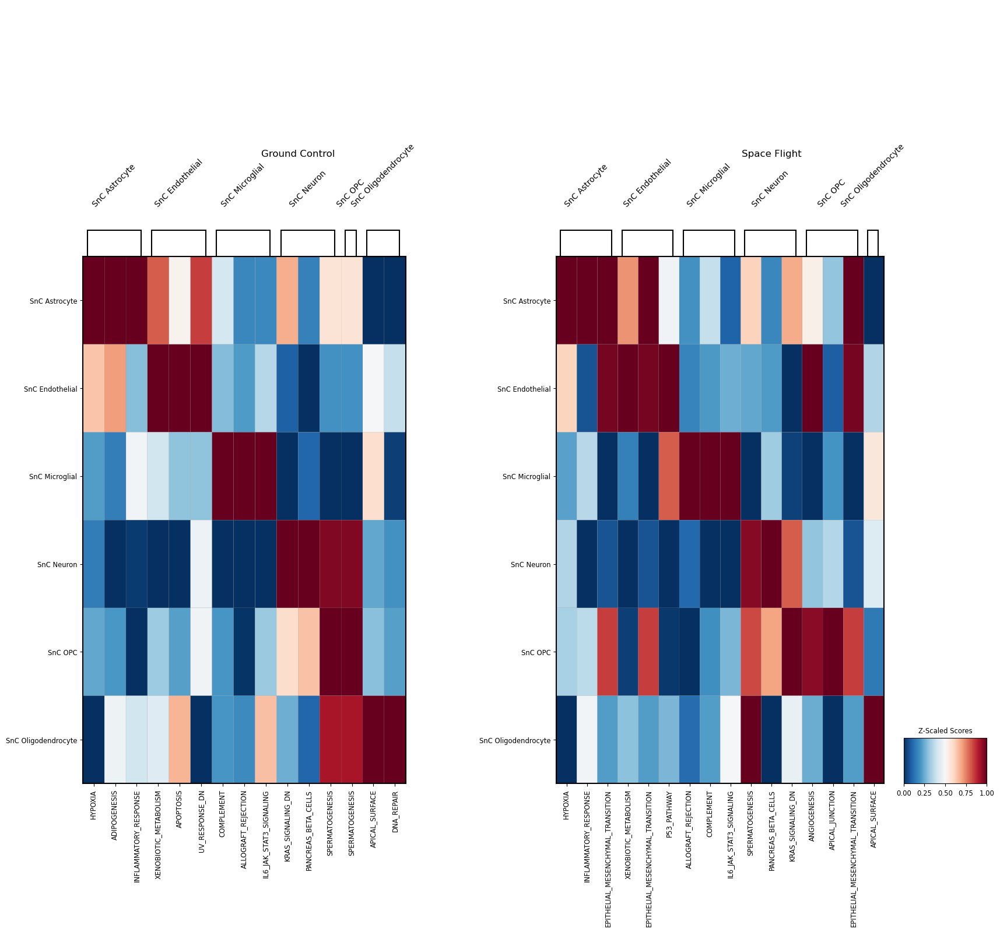

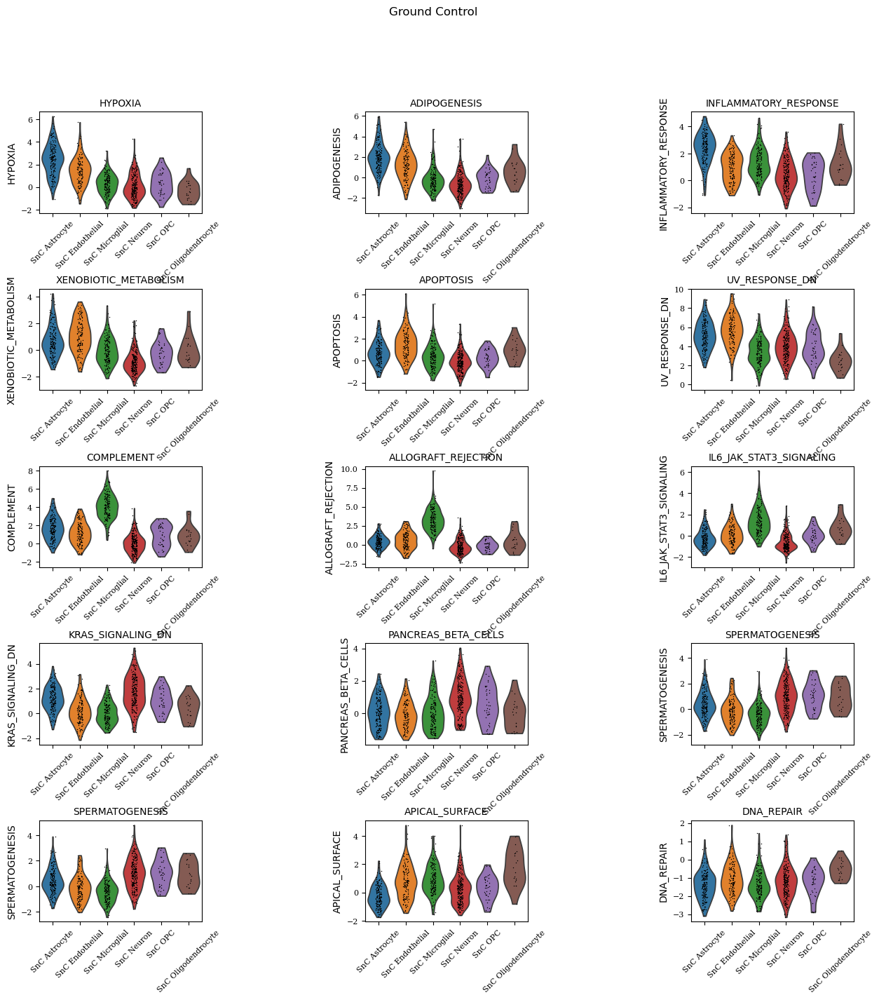

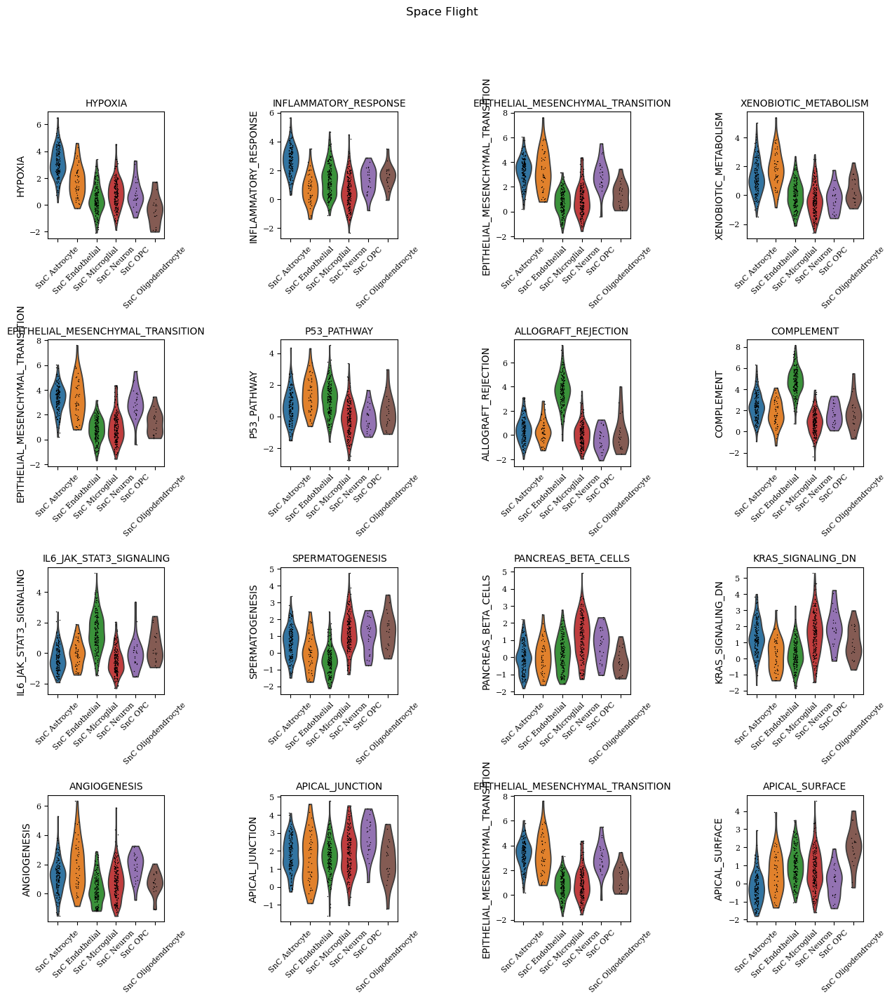

reference       stat  meanchange          pval          padj
Condition      Condition           name                                                                                          
Ground Control SnC Neuron          KRAS_SIGNALING_DN                      rest  10.949425    1.212438  6.346136e-25  1.762816e-24
                                   PANCREAS_BETA_CELLS                    rest   9.465440    0.904927  1.535924e-19  3.338965e-19
                                   SPERMATOGENESIS                        rest   9.030485    0.925842  4.525880e-18  8.381260e-18
               SnC Astrocyte       HYPOXIA                                rest  14.557324    1.980129  1.360837e-37  6.804187e-36
                                   ADIPOGENESIS                           rest  13.763819    2.007607  1.123553e-34  2.808882e-33
                                   INFLAMMATORY_RESPONSE                  rest  12.916432    1.583978  2.032427e-31  3.387379e-30
                                   FATTY_ACID_METABOLISM                  rest  11.748091    1.363937  7.639569e-27  9.549462e-26
                                   EPITHELIAL_MESENCHYMAL_TRANSITION      rest  11.225664    1.672107  9.839764e-25  9.839764e-24
                                   ESTROGEN_RESPONSE_LATE                 rest  11.089786    1.250259  1.181705e-24  9.847539e-24
                                   CHOLESTEROL_HOMEOSTASIS                rest   9.844454    1.395368  4.940614e-20  3.529010e-19
                                   MYOGENESIS                             rest   9.330668    1.254114  1.301365e-18  8.133529e-18
                                   BILE_ACID_METABOLISM                   rest   7.673814    0.869503  1.720799e-13  8.603996e-13
                                   MTORC1_SIGNALING                       rest   6.975785    0.993816  1.601754e-11  7.280698e-11
                                   GLYCOLYSIS                             rest   6.954613    0.746197  1.783272e-11  7.430299e-11
                                   XENOBIOTIC_METABOLISM                  rest   6.700815    0.847846  8.498796e-11  3.268768e-10
                                   IL2_STAT5_SIGNALING                    rest   6.514972    0.757749  2.721065e-10  9.070217e-10
                                   ESTROGEN_RESPONSE_EARLY                rest   6.362234    0.757163  6.302773e-10  1.969617e-09
                                   TNFA_SIGNALING_VIA_NFKB                rest   6.240906    0.853912  1.310778e-09  3.855229e-09
                                   UV_RESPONSE_DN                         rest   5.923413    1.011799  7.752228e-09  2.153397e-08
                                   OXIDATIVE_PHOSPHORYLATION              rest   5.814760    0.963687  1.395267e-08  3.671756e-08
                                   PEROXISOME                             rest   4.067083    0.412691  5.905366e-05  1.406039e-04
                                   MITOTIC_SPINDLE                        rest   4.056084    0.714547  6.247941e-05  1.419987e-04
                                   COAGULATION                            rest   3.879209    0.674265  1.293893e-04  2.812811e-04
                                   REACTIVE_OXYGEN_SPECIES_PATHWAY        rest   3.134679    0.334047  1.868805e-03  3.460750e-03
                                   HEDGEHOG_SIGNALING                     rest   3.057891    0.388665  2.403006e-03  4.291083e-03
                                   KRAS_SIGNALING_DN                      rest   2.864325    0.363117  4.460039e-03  7.433399e-03
               SnC Endothelial     XENOBIOTIC_METABOLISM                  rest   8.660113    1.262132  5.096133e-16  2.548066e-14
                                   APOPTOSIS                              rest   8.235504    1.172771  9.989604e-15  2.497401e-13
                                   UV_RESPONSE_DN                         rest   7.744270    1.537421  2.149743e-13  3.582905e-12
                                   ESTR

In [72]:
res_dc_ulm_hm_sfct = scflow.ax.run_decoupler_ulm(
        self.rna[self.rna.obs["Senescent_Cell_Label"] == "Senescent"],
        "Senescent_Cell_Label_by_Type", col_condition=col_condition,
        species=species, resource="hallmark", title_position=0.8,
        hspace=0.5, wspace=0.1, top=1, figsize=(20, 15))
res_dc_ulm_hm_sfct_scores = pd.concat([res_dc_ulm_hm_sfct[0][x][1].set_index(
    "group").rename_axis(col_condition).set_index(
        "name", append=True) for x in res_dc_ulm_hm_sfct[0]],
                              keys=res_dc_ulm_hm_sfct[0],
                              names=[col_condition])
res_dc_ulm_hm_sfct_scores[res_dc_ulm_hm_sfct_scores.padj < 0.01]

##### SF vs. GC

{'Ground Control': ['BILE_ACID_METABOLISM'], 'Space Flight': ['MYOGENESIS', 'COAGULATION', 'ADIPOGENESIS', 'OXIDATIVE_PHOSPHORYLATION', 'INFLAMMATORY_RESPONSE', 'EPITHELIAL_MESENCHYMAL_TRANSITION', 'APICAL_JUNCTION', 'KRAS_SIGNALING_DN']}
{'Space Flight': ['OXIDATIVE_PHOSPHORYLATION', 'ADIPOGENESIS', 'MYC_TARGETS_V1', 'MTORC1_SIGNALING', 'UV_RESPONSE_UP', 'GLYCOLYSIS', 'FATTY_ACID_METABOLISM', 'COMPLEMENT', 'REACTIVE_OXYGEN_SPECIES_PATHWAY', 'APOPTOSIS']}
{'Space Flight': ['OXIDATIVE_PHOSPHORYLATION', 'COAGULATION', 'ADIPOGENESIS', 'CHOLESTEROL_HOMEOSTASIS', 'MTORC1_SIGNALING', 'HYPOXIA', 'REACTIVE_OXYGEN_SPECIES_PATHWAY', 'KRAS_SIGNALING_UP', 'COMPLEMENT', 'XENOBIOTIC_METABOLISM']}
{'Space Flight': ['OXIDATIVE_PHOSPHORYLATION']}
{'Ground Control': ['UV_RESPONSE_DN', 'APICAL_JUNCTION', 'G2M_CHECKPOINT', 'ESTROGEN_RESPONSE_EARLY'], 'Space Flight': ['OXIDATIVE_PHOSPHORYLATION', 'UV_RESPONSE_UP', 'FATTY_ACID_METABOLISM', 'ADIPOGENESIS', 'XENOBIOTIC_METABOLISM', 'COAGULATION']}
{'Space Fli

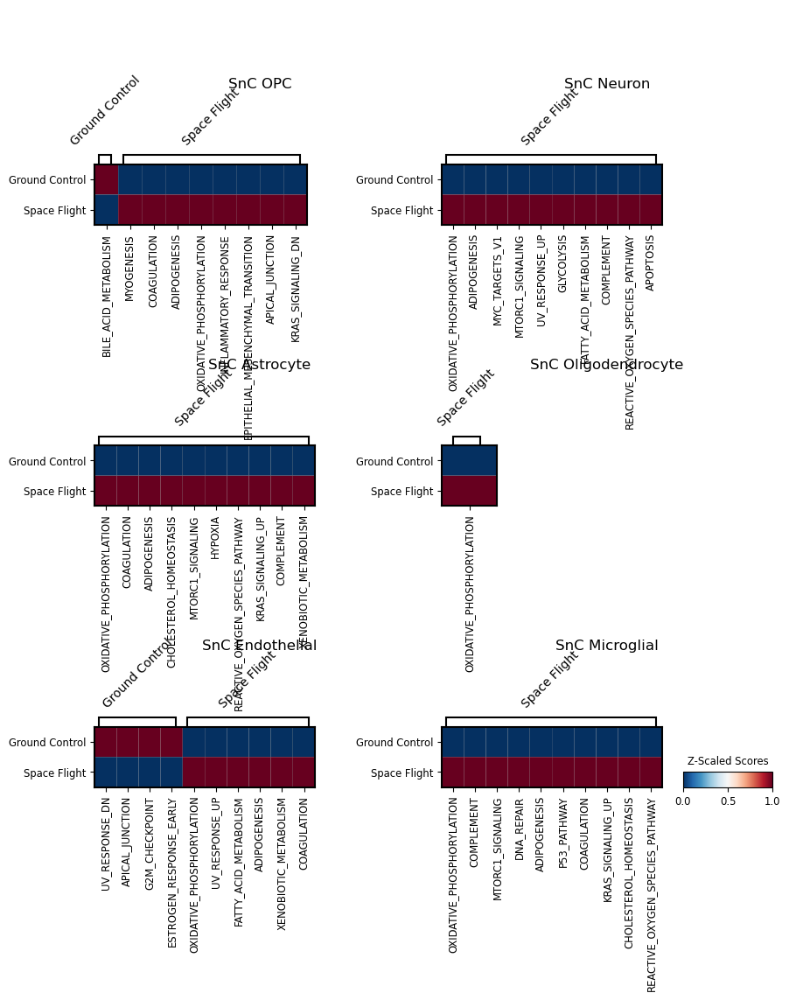

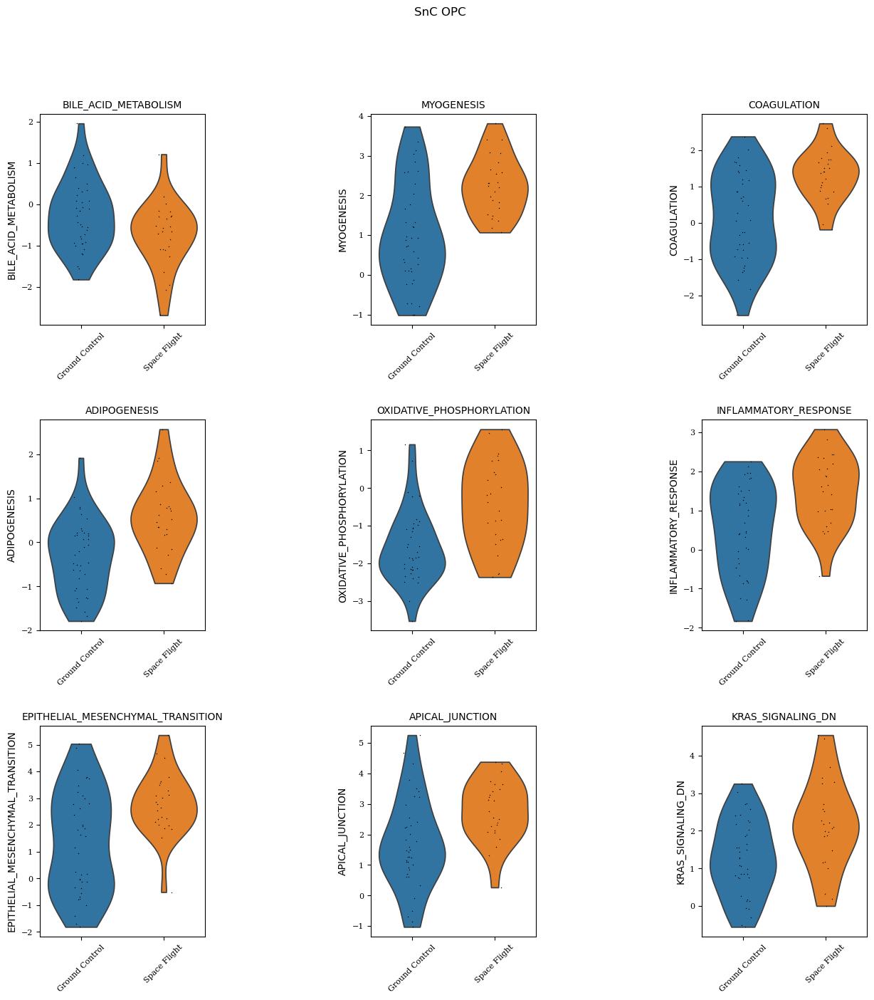

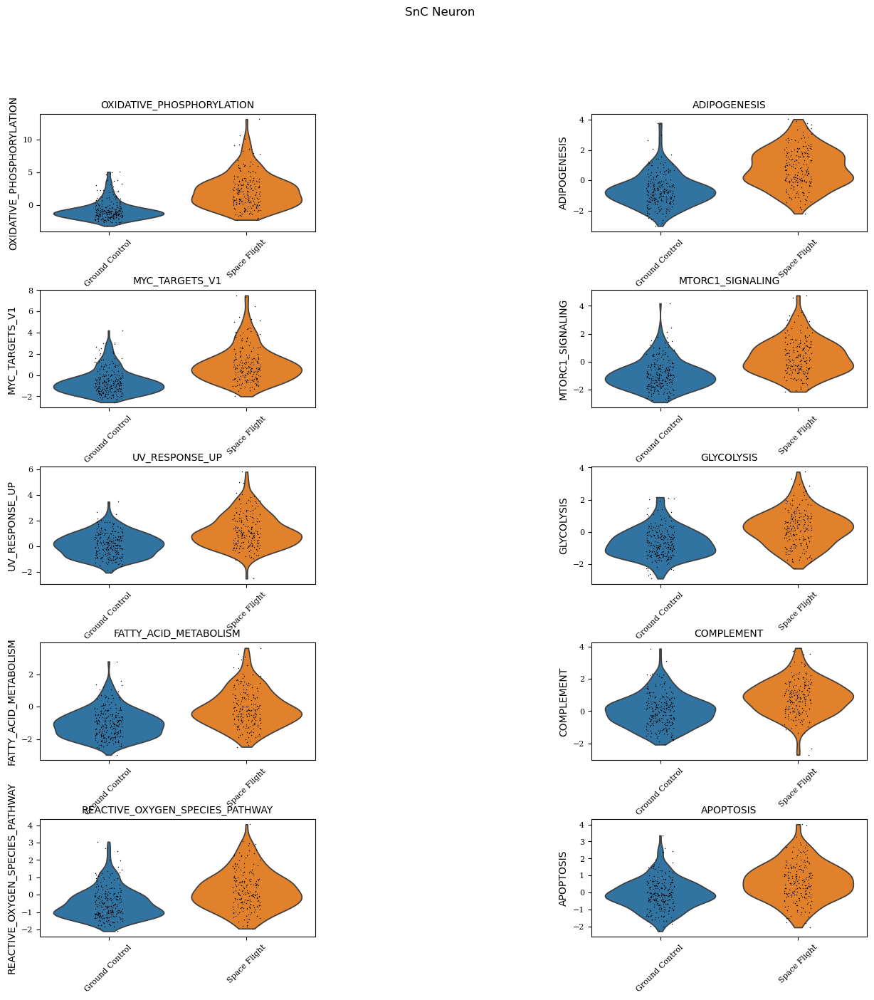

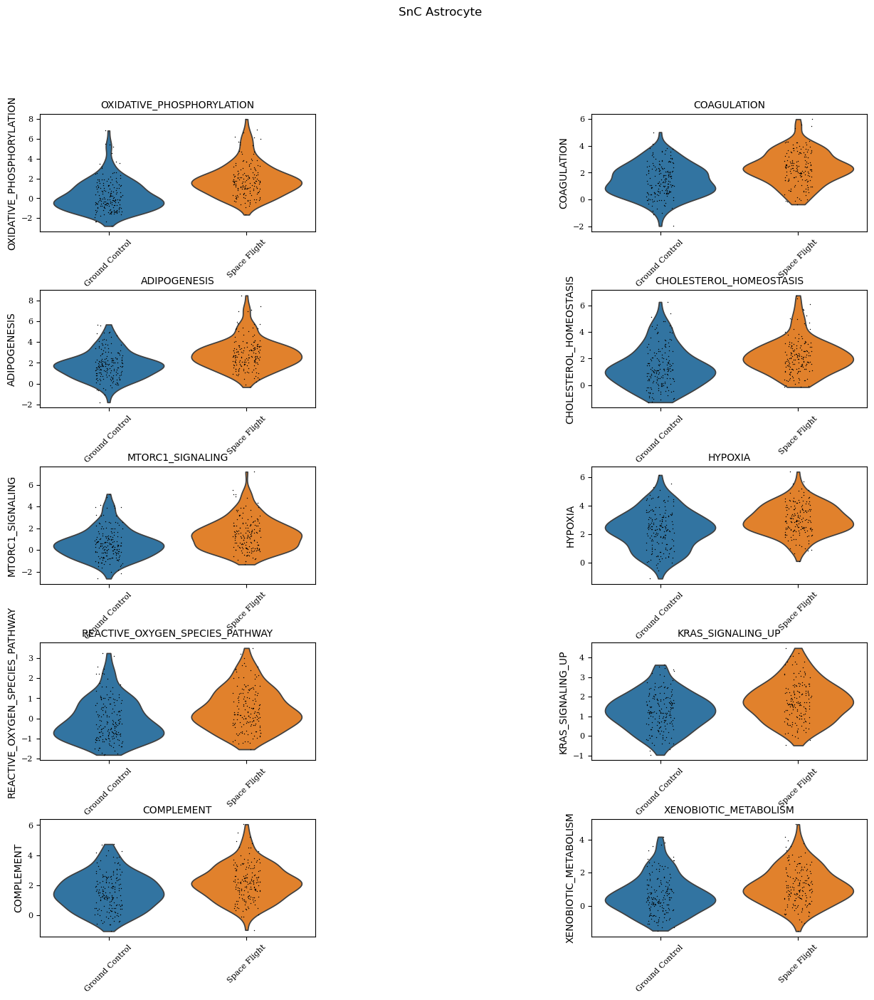

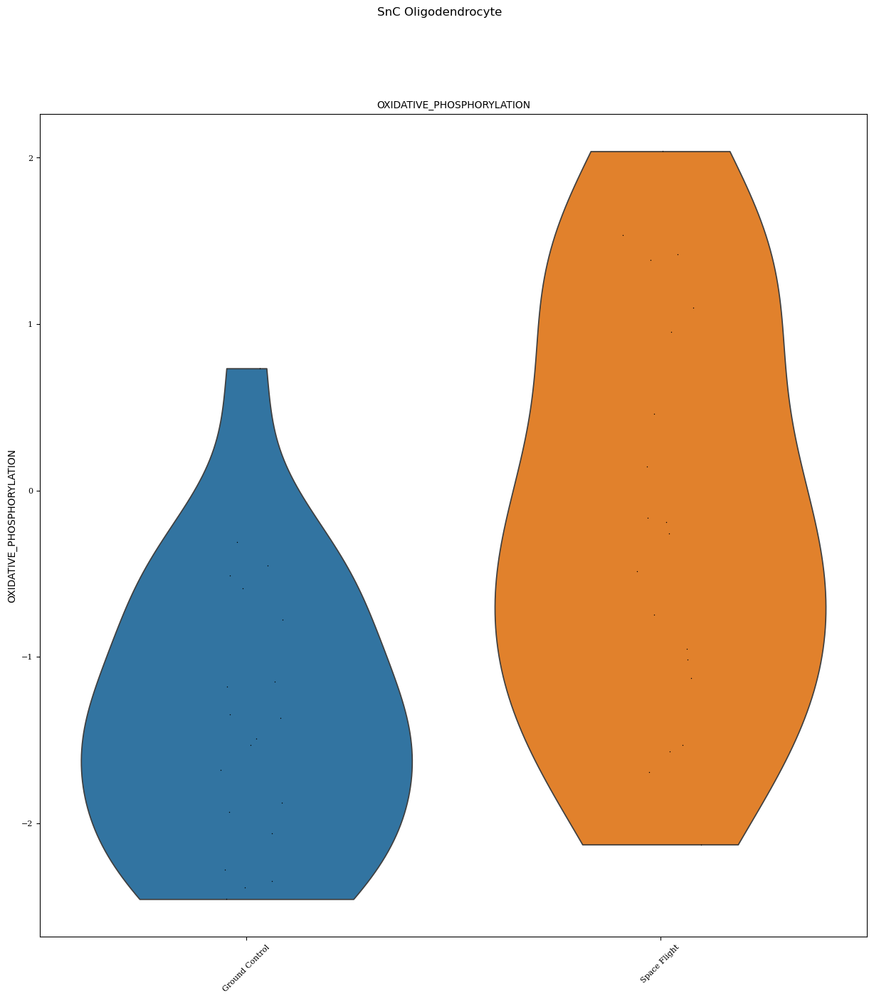

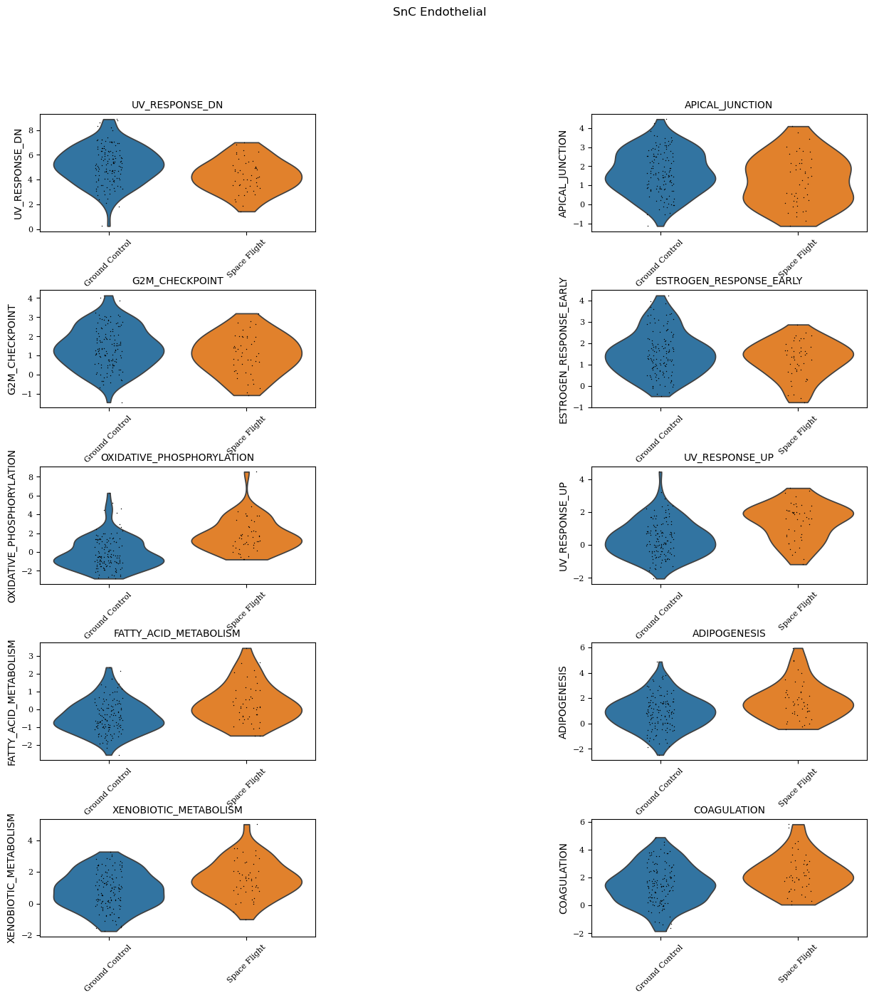

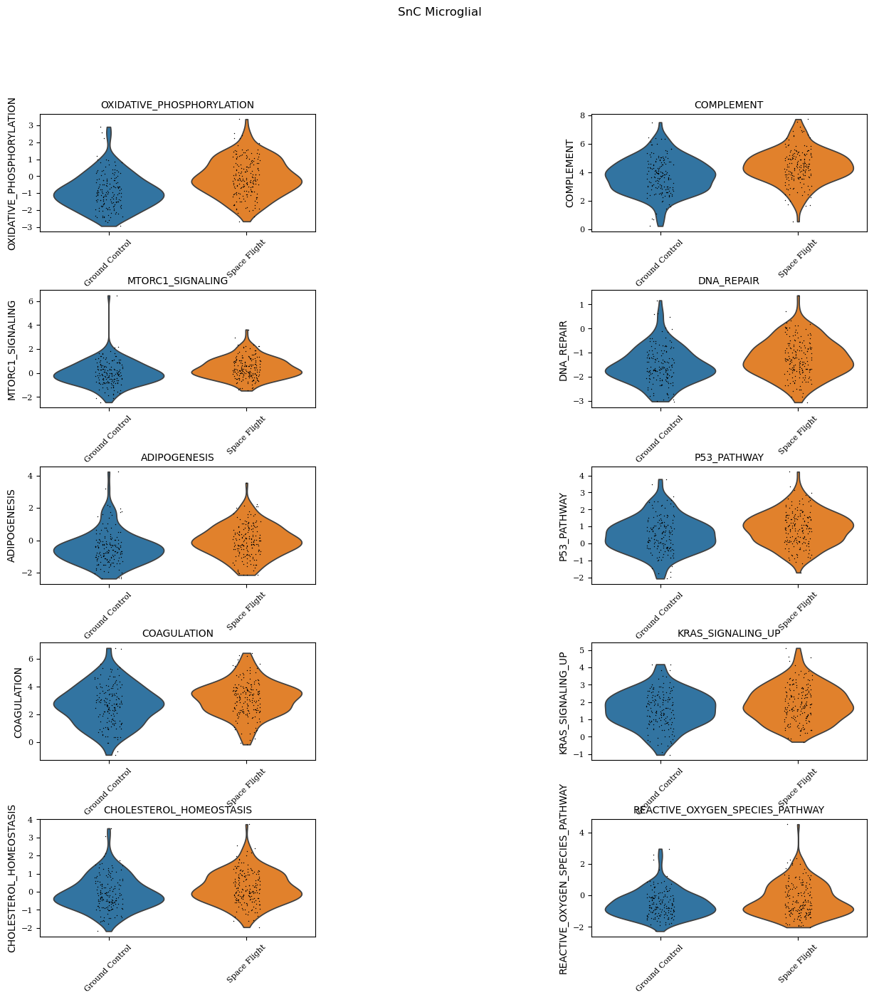

reference       stat  meanchange          pval          padj
annotation_scanvi_collapsed Condition      name                                                                                          
SnC OPC                     Ground Control BILE_ACID_METABOLISM                   rest   2.589727    0.478766  1.151037e-02  4.427066e-02
                            Space Flight   MYOGENESIS                             rest   4.157947    1.239935  1.752579e-04  4.620729e-03
                                           COAGULATION                            rest   4.140832    1.169138  1.848292e-04  4.620729e-03
                                           ADIPOGENESIS                           rest   3.797391    0.897789  4.110707e-04  5.242075e-03
                                           OXIDATIVE_PHOSPHORYLATION              rest   3.802231    1.140165  4.193660e-04  5.242075e-03
                                           INFLAMMATORY_RESPONSE                  rest   3.436618    1.006671  1.275108e-03  1.275108e-02
                                           EPITHELIAL_MESENCHYMAL_TRANSITION      rest   3.229376    1.456039  2.488102e-03  2.073418e-02
                                           APICAL_JUNCTION                        rest   2.988721    1.068398  4.678418e-03  3.341727e-02
                                           KRAS_SIGNALING_DN                      rest   2.860039    0.893061  6.309280e-03  3.943300e-02
SnC Neuron                  Space Flight   OXIDATIVE_PHOSPHORYLATION              rest  13.924027    3.005937  2.544035e-34  1.272017e-32
                                           ADIPOGENESIS                           rest  11.911185    1.432241  6.216280e-28  1.554070e-26
                                           MYC_TARGETS_V1                         rest  11.205413    1.645565  4.855506e-25  8.092510e-24
                                           MTORC1_SIGNALING                       rest  10.533996    1.255078  6.852385e-23  8.565482e-22
                                           UV_RESPONSE_UP                         rest   9.262768    1.064326  2.059872e-18  2.059872e-17
                                           GLYCOLYSIS                             rest   8.728538    0.909669  8.779783e-17  7.316486e-16
                                           FATTY_ACID_METABOLISM                  rest   8.710461    0.909232  1.061532e-16  7.582374e-16
                                           COMPLEMENT                             rest   7.942411    0.839483  2.225390e-14  1.390869e-13
                                           REACTIVE_OXYGEN_SPECIES_PATHWAY        rest   7.428178    0.762506  7.841656e-13  4.356476e-12
                                           APOPTOSIS                              rest   7.215697    0.738660  3.074841e-12  1.537420e-11
                                           HYPOXIA                                rest   6.934228    0.749081  1.731303e-11  7.869557e-11
                                           ESTROGEN_RESPONSE_LATE                 rest   6.918569    0.667569  1.912877e-11  7.970323e-11
                                           MYOGENESIS                             rest   6.532323    0.758392  2.058626e-10  7.917792e-10
                                           CHOLESTEROL_HOMEOSTASIS                rest   6.434316    0.613037  3.753915e-10  1.340684e-09
                                           P53_PATHWAY                            rest   5.576451    0.538265  4.808722e-08  1.602907e-07
                                           XENOBIOTIC_METABOLISM                  rest   5.519291    0.545439  6.468171e-08  2.021304e-07
                                           UNFOLDED_PROTEIN_RESPONSE              rest   5.466002    0.562951  8.362498e-08  2.459558e-07
                                           APICAL_SURFACE                         rest   4.886149    0.518624  1.512810e-06  4.202249e-06
                                           TGF_BETA_SIGNALING              

In [73]:
res_dc_ulm_hm_sf = scflow.ax.run_decoupler_ulm(
        self.rna[self.rna.obs["Senescent_Cell_Label"] == "Senescent"],
        col_condition, col_condition="Senescent_Cell_Label_by_Type",
        species=species, resource="hallmark", title_position=0.6,
        hspace=0.3, wspace=0.05, top=1, figsize=(10, 10), top_n=10)
res_dc_ulm_hm_sf_scores = pd.concat([res_dc_ulm_hm_sf[0][x][1].set_index(
    "group").rename_axis(col_condition).set_index(
        "name", append=True) for x in res_dc_ulm_hm_sf[0]],
                              keys=res_dc_ulm_hm_sf[0], names=[col_celltype])
res_dc_ulm_hm_sf_scores[res_dc_ulm_hm_sf_scores.padj < 0.05]

##### Batches

{'Ground Control | 20 Weeks': ['BILE_ACID_METABOLISM', 'PROTEIN_SECRETION', 'HEME_METABOLISM']}
{'Ground Control | 37 Weeks': ['KRAS_SIGNALING_DN'], 'Space Flight | 20 Weeks': ['MYC_TARGETS_V1', 'MTORC1_SIGNALING', 'PROTEIN_SECRETION'], 'Space Flight | 37 Weeks': ['ADIPOGENESIS', 'OXIDATIVE_PHOSPHORYLATION', 'REACTIVE_OXYGEN_SPECIES_PATHWAY']}
{'Space Flight | 37 Weeks': ['OXIDATIVE_PHOSPHORYLATION', 'ADIPOGENESIS', 'REACTIVE_OXYGEN_SPECIES_PATHWAY']}
{'Space Flight | 37 Weeks': ['OXIDATIVE_PHOSPHORYLATION', 'UV_RESPONSE_UP', 'FATTY_ACID_METABOLISM']}
{'Space Flight | 37 Weeks': ['OXIDATIVE_PHOSPHORYLATION', 'REACTIVE_OXYGEN_SPECIES_PATHWAY', 'ADIPOGENESIS']}


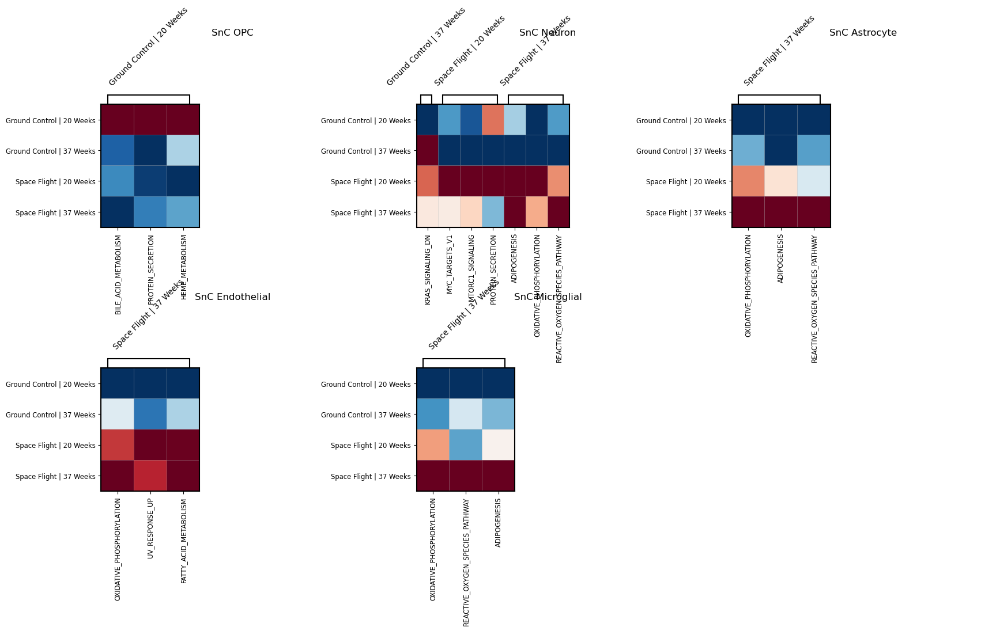

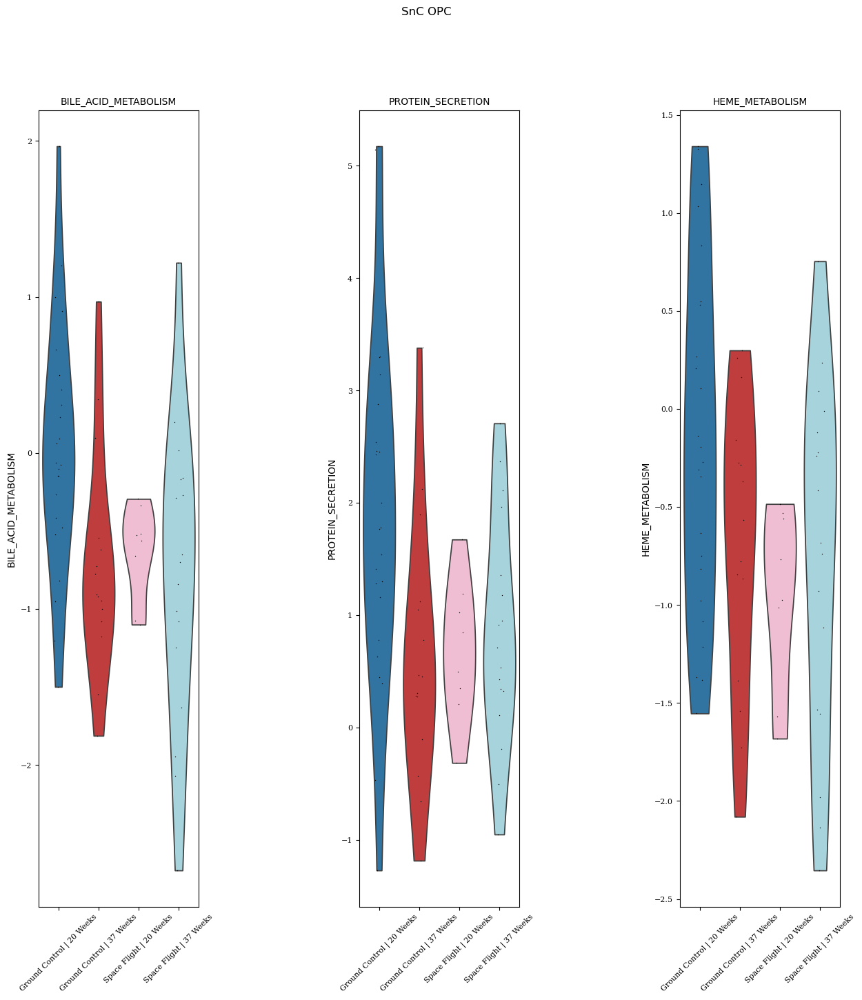

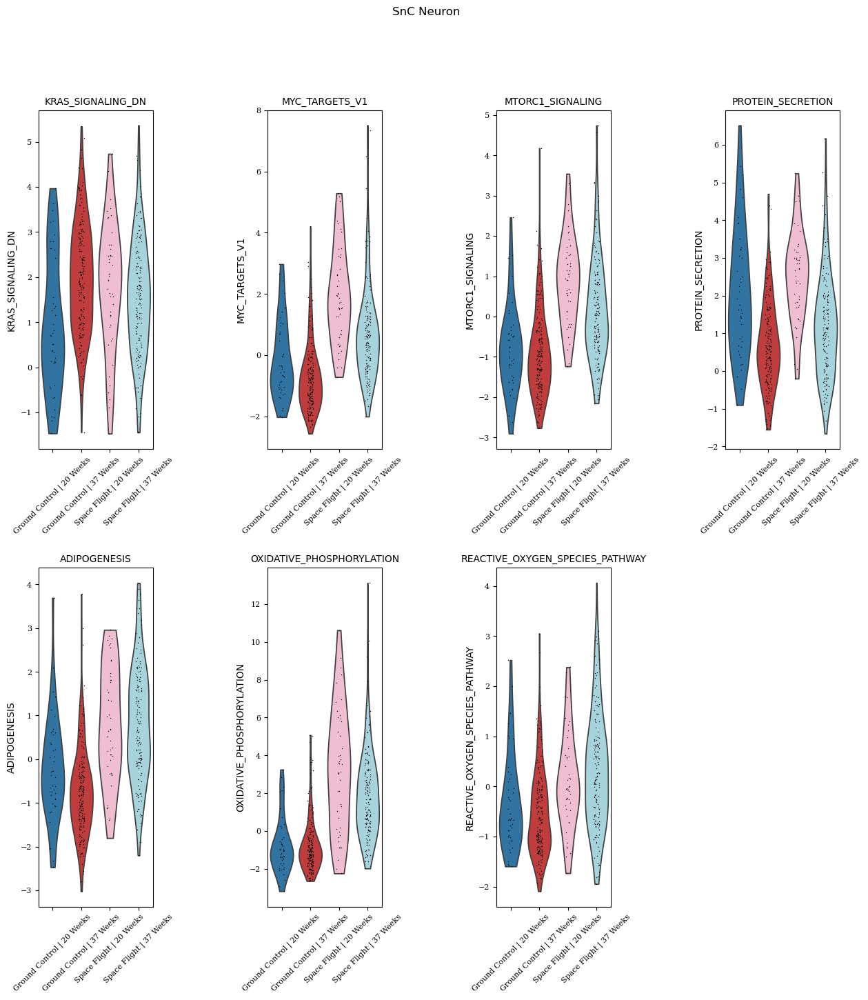

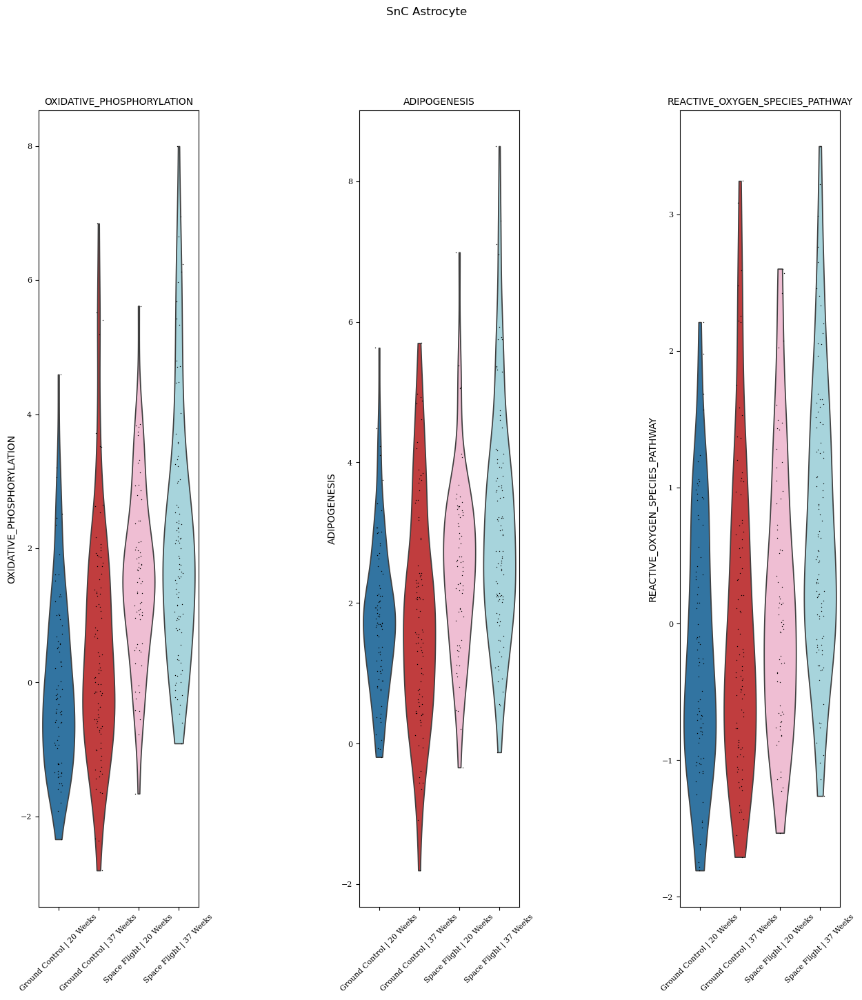



No significant contrasts for SnC Oligodendrocyte


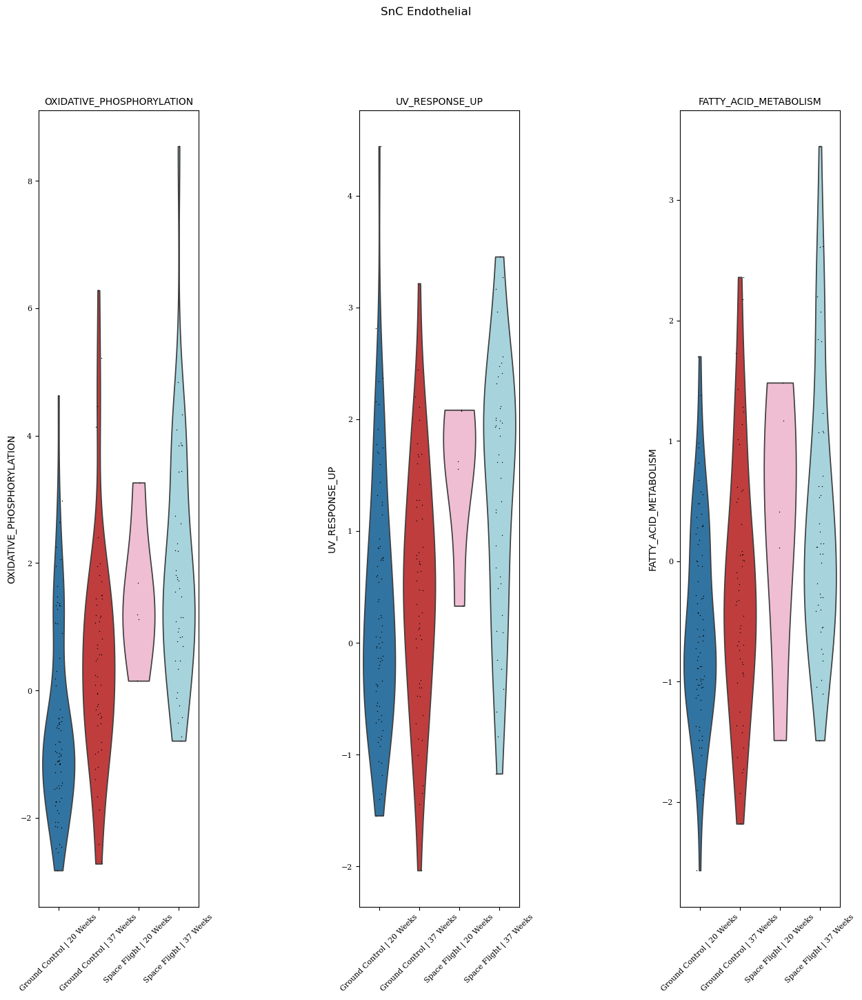

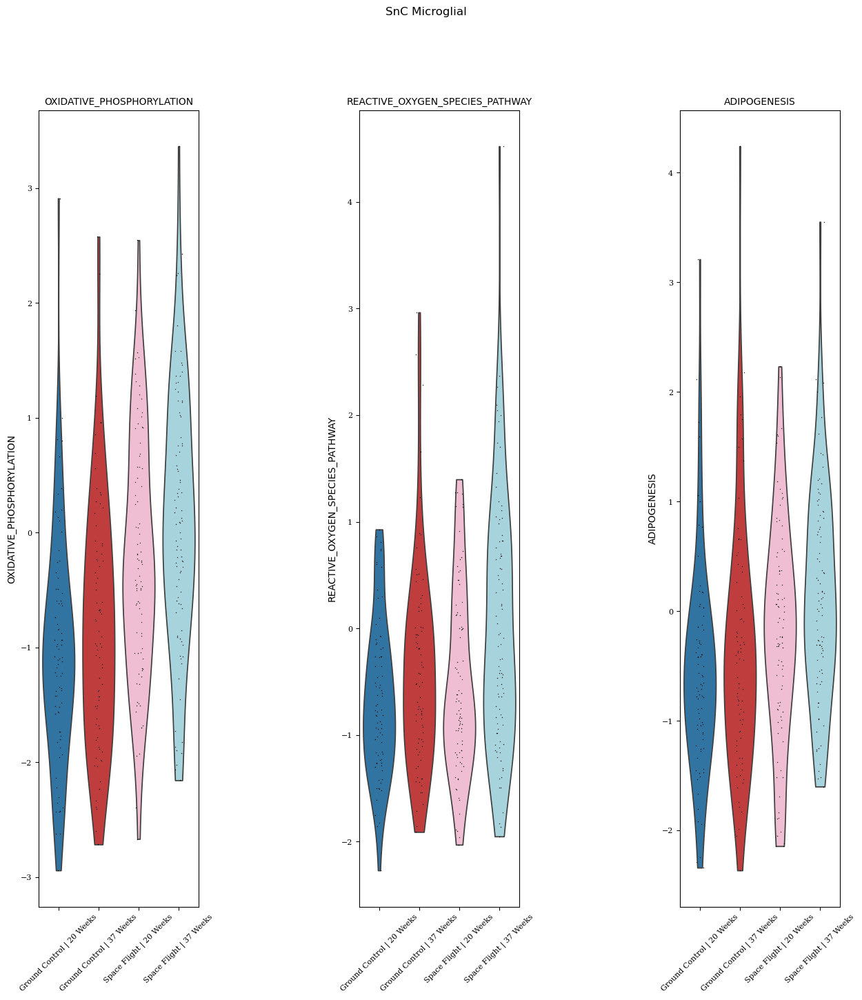

reference      stat  meanchange          pval          padj
annotation_scanvi_collapsed Group                     name                                                                                         
SnC OPC                     Ground Control | 20 Weeks BILE_ACID_METABOLISM                   rest  3.373730    0.752541  1.514491e-03  6.601070e-03
                                                      PROTEIN_SECRETION                      rest  3.119145    1.159080  3.380284e-03  1.126761e-02
                                                      HEME_METABOLISM                        rest  2.555484    0.613445  1.407337e-02  4.139226e-02
SnC Neuron                  Ground Control | 37 Weeks KRAS_SIGNALING_DN                      rest  3.929666    0.515431  1.010886e-04  2.406871e-04
                            Space Flight | 37 Weeks   ADIPOGENESIS                           rest  8.276567    1.205801  4.429689e-15  2.214844e-13
                                                      OXIDATIVE_PHOSPHORYLATION              rest  7.634966    2.083377  3.135377e-13  7.838442e-12
                                                      REACTIVE_OXYGEN_SPECIES_PATHWAY        rest  5.922699    0.721035  9.236785e-09  1.539464e-07
                                                      FATTY_ACID_METABOLISM                  rest  5.818090    0.726962  1.566248e-08  1.957810e-07
                                                      MTORC1_SIGNALING                       rest  5.437101    0.798626  1.134513e-07  1.134513e-06
                                                      XENOBIOTIC_METABOLISM                  rest  5.163013    0.594760  4.605158e-07  3.837632e-06
                                                      MYC_TARGETS_V1                         rest  5.114416    0.939600  5.667051e-07  4.047894e-06
                                                      CHOLESTEROL_HOMEOSTASIS                rest  4.764490    0.530637  2.981842e-06  1.863651e-05
                                                      UV_RESPONSE_UP                         rest  4.695391    0.660582  4.098266e-06  2.275799e-05
                                                      ESTROGEN_RESPONSE_LATE                 rest  4.668445    0.529283  4.610185e-06  2.275799e-05
                                                      GLYCOLYSIS                             rest  4.650608    0.587774  5.006758e-06  2.275799e-05
                                                      COMPLEMENT                             rest  4.270606    0.541141  2.630332e-05  1.011666e-04
                                                      APOPTOSIS                              rest  4.125306    0.501730  4.824973e-05  1.639071e-04
                                                      DNA_REPAIR                             rest  4.120336    0.415525  4.917212e-05  1.639071e-04
                                                      P53_PATHWAY                            rest  4.082722    0.455976  5.742468e-05  1.794521e-04
                                                      COAGULATION                            rest  3.964477    0.545920  9.367715e-05  2.755210e-04
                                                      HYPOXIA                                rest  3.789424    0.477154  1.832227e-04  5.089518e-04
                                                      E2F_TARGETS                            rest  3.326337    0.327694  9.909569e-04  2.607781e-03
                                                      MYOGENESIS                             rest  3.279574    0.444535  1.165280e-03  2.913200e-03
                                                      UNFOLDED_PROTEIN_RESPONSE              rest  2.583614    0.307635  1.025767e-02  2.442302e-02
                                                      APICAL_SURFACE                         rest  2.486184    0.309290  1.346591e-02  3.060434e-02
                                                      EPITHELIAL_MESENCHYMAL_TRANSITION     

In [76]:
res_dc_ulm_hm = scflow.ax.run_decoupler_ulm(
        self.rna[self.rna.obs["Senescent_Cell_Label"] == "Senescent"],
        col_batch, col_condition="Senescent_Cell_Label_by_Type",
        species=species, resource="hallmark", p_threshold=0.05,
        # brackets=False,
        title_position=0.85,
        hspace=0.2, wspace=0.2, figsize=(20, 10), sharey=True)
res_dc_ulm_hm_scores = pd.concat([res_dc_ulm_hm[0][x][1].set_index(
    "group").rename_axis(col_batch).set_index(
        "name", append=True) for x in res_dc_ulm_hm[0]],
                                 keys=res_dc_ulm_hm[0], names=[col_celltype])
# res_dc_ulm_hm_scores[res_dc_ulm_hm_scores.padj < 0.05].loc[
#     "SnC Neuron", [group_order[2], group_order[3]], :]["stat"].loc[
#         "SnC Neuron"].unstack(0)
res_dc_ulm_hm_scores[res_dc_ulm_hm_scores.padj < 0.05]

### Individual Cell Scores

In [ ]:
res_aucell = scflow.ax.run_decoupler_aucell(
    self.rna, col_covariates=["Senescent_Cell_Label_by_Type", col_condition],
    resource="progeny", species=species, inplace=True)
_ = self.plot(genes=list(self.rna.obsm["score_aucell"].columns),
              subset=self.rna.obs["Senescent_Cell"],
              col_celltype=col_condition, kind="violin",
              by_group="Senescent_Cell_Label_by_Type", figsize=(15, 15))

#### DEGs (`find_markers`) by Group

In [ ]:
out_pathway_snc_degs = scflow.ax.run_enrichr(
    df_snc_markers_top, col_grouping=["Comparison", col_celltype],
    gene_sets=gene_sets, fx_replace_string=fx_replace_string, title="Overall")
out_pathway_snc_degs_gc = scflow.ax.run_enrichr(
    df_snc_markers_top_gc, col_grouping=["Comparison", col_celltype],
    gene_sets=gene_sets, fx_replace_string=fx_replace_string,
    title=keys[col_condition]["key_control"])
out_pathway_snc_degs_sf = scflow.ax.run_enrichr(
    df_snc_markers_top_sf, col_grouping=["Comparison", col_celltype],
    gene_sets=gene_sets, fx_replace_string=fx_replace_string,
    title=keys[col_condition]["key_treatment"])
# out_pathway_snc_degs[1].drop("All", level=0)

#### Edger Contrasts (Pseudo-Bulk)

In [ ]:
# GSEA
print("\n\nGSEA Enrichment Analysis\n\n")
out_pathway_snc_degs = scflow.ax.run_enrichr(
    out_edgr_contrasts_snc_all_top, col_grouping=col_celltype,
    gene_sets=gene_sets, fx_replace_string=fx_replace_string)

# ToppGene
print("\n\nToppGene Enrichment Analysis\n\n")
mks_ctrsts_snc = dict(out_edgr_contrasts_snc_all_top.reset_index(
    1).variable.groupby(col_celltype).apply(lambda x: list(x)))  # SnC DEGs
results_toppgene_degs = scflow.pp.annotate_by_toppgene(
    mks_ctrsts_snc, species=species, min_genes=1,
    categories=["Pathway", "PubMed"])
results_toppgene_degs = results_toppgene_degs.join(pd.Series(
    mks_ctrsts_snc).to_frame("DEGs").rename_axis("Gene Set"))
results_toppgene_degs = results_toppgene_degs.groupby("Gene Set").apply(
    lambda x: x.sort_values("PValue", ascending=True), include_groups=False)
pthwys = dict(results_toppgene_degs.groupby("Gene Set").apply(
    lambda x: [i.capitalize() for i in x.Name.unique()]))
print("\n\n".join([f"{k}: {pthwys[k]}" for k in pthwys]))
results_toppgene_degs[["Name", "Symbols", "GenesInTerm", "GenesInQuery",
                       "GenesInTermInQuery", "PValue"]].reset_index(
                           2, drop=True)

## Plot

In [ ]:
# Top 10 Senescence Genes or All?
ggg = top_genes
# ggg = genes

# Mask for High Senescence Subset & Helper Variable for Figure Dimensions
subset = self.rna.obs["Senescent_Cell"].isin([1, True])
num_cts = len(self.rna[subset].obs[col_celltype].unique())

# Plot SnC Markers Overlap with Marker Sets
sc.pl.violin(self.rna[subset], set(genes).intersection(
    marker_gene_sets.explode().unique()),
             groupby=col_batch, rotation=90)  # plot overlap w/ SnC markers

# Plot Most Highly-Expressed Genes in Each Senescent Cell Type
_ = self.plot(kind=["matrix", "heat"], genes=top_genes,
              col_celltype=col_celltype, layer="log1p",
              subset=subset, dendrogram=True, swap_axes=False, heat=dict(
                  dendrogram=False), standard_scale="var",
              figsize=(len(top_genes) / 1.5, num_cts * 1.5))

# Grouped by Top Cell Types
_ = self.plot(kind=["matrix", "heat"], genes=top_genes_dict,
              standard_scale="obs", col_celltype=col_celltype,
              layer="log1p", swap_axes=False, figsize=(len(ggg), num_cts),
              subset=subset, dendrogram=True)

# Write Object

In [ ]:
# Send Email with Output When Done
if email is not None and html_out is not None:
    os.system(f"jupyter nbconvert --to html {cur_file}")
    os.system(f"echo 'yay' | mutt -s 'JOB DONE' -a {html_out} -- {email}")

# SCRATCH

In [ ]:
# %%R

# MAST

# find_de_MAST_RE <- function(adata_, formula){
#     # create a MAST object
#     sca <- SceToSingleCellAssay(adata_, class="SingleCellAssay")
#     print("Dimensions before subsetting:")
#     print(dim(sca))
#     print("")
#     # keep genes that are expressed in more than 10% of all cells
#     sca <- sca[freq(sca) > 0.1,]
#     print("Dimensions after subsetting:")
#     print(dim(sca), "\n")
#     cdr2 <- colSums(assay(sca) > 0)
#     colData(sca)$ngeneson <- scale(cdr2)
#     # store the columns that we are interested in as factors
#     label <- factor(colData(sca)$label)
#     # set the reference level
#     label <- relevel(label,"ctrl")
#     colData(sca)$label <- label
#     celltype <- factor(colData(sca)$cell_type)
#     colData(sca)$celltype <- celltype
#     # same for donors (which we need to model random effects)
#     replicate <- factor(colData(sca)$replicate)
#     colData(sca)$replicate <- replicate
#     # create a group per condition-celltype combination
#     colData(sca)$group <- paste0(colData(
#         adata_)$label, ".", colData(adata_)$cell_type)
#     colData(sca)$group <- factor(colData(sca)$group)
#     # define and fit the model
#     zlmCond <- zlm(formula=formula,
#                    sca=sca,
#                    method="glmer",
#                    ebayes=F,
#                    strictConvergence=F,
#                    fitArgsD=list(nAGQ = 0)) # to speed up calculations
#     # perform likelihood-ratio test for the condition
#     summaryCond <- summary(zlmCond, doLRT="groupstim.CD14_Monocytes")
#     # get the table with log-fold changes and p-values
#     summaryDt <- summaryCond$datatable
#     return(summaryDt)
# }

In [77]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()
df_degs = df_snc_markers.drop("All").reset_index(0, drop=True)
df_degs = df_degs[df_degs.pvals_adj < 1e-25]

factor_name = col_celltype
# factor_name = col_condition

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021", f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              # "Reactome_Pathways_2024", "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
gene_sets = dict(zip(["up", "down"], [[
    f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
        f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
    for i in ["up", "down"]]))
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle("Senescent Cell Spaceflight DEGs", fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

Exception: Error sending gene list, try again later

In [78]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

# factor_name = col_celltype
# factor_name = col_condition
factor_name = col_batch

df_degs = res_rank_genes.loc[:, "Overall", :]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)
df_degs = df_degs.reset_index(1).set_index("names", append=True)

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021",
              # f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              "Reactome_Pathways_2024",
              # "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle("Senescent Cell Spaceflight DEGs",
             fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

KeyError: 'Group'

In [ ]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

factor_name = col_celltype
# factor_name = col_condition

iii = 2
df_degs = res_rank_genes_top.loc[self.rna.obs[col_batch].unique()[iii]]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)
print(self.rna.obs[col_batch].unique()[iii])

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021", f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              # "Reactome_Pathways_2024", "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle("Senescent Cell Spaceflight DEGs", fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

In [ ]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

factor_name = col_celltype
# factor_name = col_condition

iii = 1
df_degs = res_rank_genes_top.loc[self.rna.obs[col_batch].unique()[iii]]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)
print(self.rna.obs[col_batch].unique()[iii])

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021", f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              # "Reactome_Pathways_2024", "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle("Senescent Cell Spaceflight DEGs", fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

In [ ]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

# factor_name = col_celltype
factor_name = col_condition
# factor_name = col_batch

c_t = "OPC"

df_degs = res_rank_genes.loc[:, c_t, :]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)
df_degs = df_degs.reset_index(1).set_index("names", append=True)

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021",
              # f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures",
              # "OMIM_Disease",
              "Reactome_Pathways_2024",
              "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle(f"{c_t} SnC vs. Non-SnC DEGs",
             fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

In [ ]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

factor_name = col_celltype
# factor_name = col_condition
# factor_name = col_batch

c_t = "Space Flight"

df_degs = res_rank_genes.loc[c_t]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)
df_degs = df_degs.reset_index(1).set_index("names", append=True)

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021",
              # f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures",
              # "OMIM_Disease",
              "Reactome_Pathways_2024",
              "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle(f"{c_t} SnC vs. Non-SnC DEGs",
             fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]

In [ ]:
# df_degs = out_edgr_old_sf_v_gc.copy()
# df_degs = out_edgr_batches_snc_top.copy()
# df_degs = res_snc_grps.copy()

factor_name = col_celltype
# factor_name = col_condition
# factor_name = col_batch

c_t = "Ground Control"

df_degs = res_rank_genes.loc[c_t]
df_degs = df_degs.assign(log_fc=df_degs.logfoldchanges.abs())
df_degs = df_degs.assign(abs_log_fc=df_degs.logfoldchanges_abs)
df_degs = df_degs.reset_index(1).set_index("names", append=True)

names = gp.get_library_name()
# [i for i in names if "brain" in i.lower() or "mouse" in i.lower()]
pathways_snc_vs_no, res_pathways_snc_vs_no = {}, {}
thresh_p_path = 0.05
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021",
              # f"HDSigDB_{species}_2021",
              # "DGIdb_Drug_Targets_2024",
              "MSigDB_Hallmark_2020",
              "MSigDB_Oncogenic_Signatures",
              # "OMIM_Disease",
              "Reactome_Pathways_2024",
              "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
# if species.lower() == "mouse":
#     other_sets += ["PerturbAtlas_MouseGenePerturbationSigs"]
for x in df_degs.reset_index()[factor_name].unique():
    pathways_snc_vs_no[x], res_pathways_snc_vs_no[x] = {}, {}
    for i in ["up", "down"]:
        degs_tmp = df_degs.loc[x]
        if i == "up":
            degs_tmp = list(degs_tmp[degs_tmp.log_fc > 0].index.values)
        else:
            degs_tmp = list(degs_tmp[degs_tmp.log_fc < 0].index.values)
        if len(degs_tmp) > 0:
            g_s = [f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
                f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
            g_s = [g for g in g_s if g in names]
            pathways_snc_vs_no[x][i] = gp.enrichr(
                gene_list=degs_tmp, gene_sets=g_s,
                organism=species, cutoff=0.5)
            res_pathways_snc_vs_no[x][i] = pathways_snc_vs_no[x][i].results[
                pathways_snc_vs_no[x][i].results[
                    "Adjusted P-value"] < thresh_p_path]
    res_pathways_snc_vs_no[x] = pd.concat(res_pathways_snc_vs_no[x],
                                          names=["Direction"])
res_pathways_snc_vs_no = pd.concat(res_pathways_snc_vs_no,
                                   names=[col_celltype])
res_pathways_snc_vs_no.loc[
    :, "Term Short"] = res_pathways_snc_vs_no.Term.apply(
        lambda x: re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
            ".*.XLSX", "",
            re.sub(".*Supplementary Table [0-9]+[-]?", "", re.sub(
                ".*.xlsx.", "", re.sub(".*Supplementary Data ..", "", re.sub(
                    "PMID([0-9])+", "", re.sub(
                        "([0-9]+) years v ([0-9]+) years", "\\1 v \\2 yrs.",
                        re.sub("aging:([0-9]+)", "aging", re.sub(
                            "([0-9]+) months v ([0-9]+) mo(nths)?",
                            "\\1 v \\2 mo.", re.sub("SRP[0-9]+ ", "", re.sub(
                                "GSE[0-9]+ ", "", x)))))))))))))
cts_i = res_pathways_snc_vs_no.reset_index()[col_celltype].unique()
res_pathways_snc_top_vs_no = res_pathways_snc_vs_no.reset_index().groupby([
    col_celltype, "Direction"]).apply(lambda x: x.sort_values(
        "Adjusted P-value", ascending=True).head(10), include_groups=False)
fig, axes = plt.subplots(*scflow.pl.square_grid(cts_i), figsize=(
    20, 25), gridspec_kw=dict(wspace=1.5, top=0.95), squeeze=False)
for i, x in enumerate(cts_i):
    gp.dotplot(
        res_pathways_snc_top_vs_no.loc[x].reset_index(),
        column="Adjusted P-value",
        # column="Overlap",
        x="Direction", y="Term Short",
        ax=axes.flatten()[i], size=20, top_term=100,
        title=x, xticklabels_rot=45, yticklabels_rot=45,
        show_ring=True, marker="o", cutoff=0.5)
    axes.flatten()[i].tick_params(axis="y", labelsize=8,
                                  labelfontfamily="serif")
    axes.flatten()[i].tick_params(axis="x", labelsize=10,
                                  labelfontfamily="serif")
    axes.flatten()[i].title.set_fontsize(10)
if len(axes.flatten()) > len(cts_i):
    for a in axes.flatten()[len(cts_i):]:
        a.set_visible(False)
fig.suptitle(f"{c_t} SnC vs. Non-SnC DEGs",
             fontsize="xx-large",
             fontproperties=dict(family="serif"))
res_pathways_snc_top_vs_no[["Term Short", "Genes"] + list(
    res_pathways_snc_top_vs_no.columns.difference([
        "Term", "Genes", "Term Short"]))]